In [ ]:
pip install yesg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for yesg: filename=yesg-2.1.1-py3-none-any.whl size=6104 sha256=020c86bc3204084eacc5cba4a94787367892df6b99e5439e54e31cd6805183ee
  Stored in directory: /root/.cache/pip/wheels/2b/53/0e/129a8d67d809bf89a196f3ea3e56b9df3da4975924157cb1a3
Successfully built yesg


In [ ]:
import pandas as pd
import yfinance as yf
import seaborn as sns
import matplotlib.pyplot as plt
import yesg
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from itertools import combinations

In [ ]:
payload=pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
first_table = payload[0]
second_table = payload[1]

sp500 = first_table
sp500_symbols = sp500['Symbol'].values.tolist()
print(sp500_symbols)

['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ATVI', 'ADM', 'ADBE', 'ADP', 'AAP', 'AES', 'AFL', 'A', 'APD', 'AKAM', 'ALK', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AMD', 'AEE', 'AAL', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'ABC', 'AME', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'AZO', 'AVB', 'AVY', 'AXON', 'BKR', 'BALL', 'BAC', 'BBWI', 'BAX', 'BDX', 'WRB', 'BRK.B', 'BBY', 'BIO', 'TECH', 'BIIB', 'BLK', 'BK', 'BA', 'BKNG', 'BWA', 'BXP', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BF.B', 'BG', 'CHRW', 'CDNS', 'CZR', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CARR', 'CTLT', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CE', 'CNC', 'CNP', 'CDAY', 'CF', 'CRL', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', 'KO', 'CTSH', 'CL', 'CMCSA', 'CMA', 'CAG', 'COP', 'ED', 'STZ', 'CEG', 'COO', 'CPRT', 'GLW', 'CTVA', 'CSGP', 'COST', 'CTRA', 'CCI', 'CSX', 'C

In [ ]:
company_esg_data = []
excluded_ticker = []

def get_esg(ticker):
  global company_esg_data
  global excluded_ticker
  try:
    company_esg_data.append(yesg.get_historic_esg(ticker).fillna(method='ffill')['Total-Score'])
    return
  except Exception:
    pass
    excluded_ticker.append(ticker)

for ticker in sp500_symbols:
  get_esg(ticker)

print(len(company_esg_data))
print(excluded_ticker,len(excluded_ticker))

An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be wrong or you might need to wait to continue.
An error has occurred. The ticker symbol might be 

In [ ]:
used_ticker = sp500_symbols[:]

for i in sp500_symbols:
  if i in excluded_ticker:
    used_ticker.remove(i)
print("The following are tickers for which ESG data can be retrieved:")
print(used_ticker)
print("The follwing are ticker for which ESG data cannot be retireved:")
print(excluded_ticker)

len(used_ticker) + len(excluded_ticker) == len(sp500_symbols) #재확인

The following are tickers for which ESG data can be retrieved:
['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ATVI', 'ADM', 'ADBE', 'ADP', 'AAP', 'AES', 'AFL', 'A', 'APD', 'AKAM', 'ALB', 'ARE', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'MO', 'AMZN', 'AEE', 'AAL', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'ABC', 'AME', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'AZO', 'AVB', 'AVY', 'BALL', 'BAC', 'BBWI', 'BAX', 'BDX', 'WRB', 'BBY', 'BIO', 'TECH', 'BIIB', 'BLK', 'BK', 'BA', 'BKNG', 'BWA', 'BXP', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BG', 'CHRW', 'CDNS', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CE', 'CNC', 'CNP', 'CF', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', 'KO', 'CTSH', 'CL', 'CMCSA', 'CMA', 'CAG', 'COP', 'ED', 'STZ', 'COO', 'CPRT', 'GLW', 'CSGP', 'COST', 'CTRA', 'CCI', 'CSX', 'CMI', 'CVS', 'DHI', 'DHR', 'DRI', 'DVA', 'DE', 'DAL', 'XRAY',

True

In [ ]:
company_esg_normalized = [] #list of dataframes of the normalized data of all companies

def scale_standard(i) :
  global company_esg_normalized
  i = pd.DataFrame(i)
  cutoff_date = '2019-12-01'
  a = i.loc[i.index <= cutoff_date]
  b= i.loc[i.index > cutoff_date]
  anew = pd.DataFrame(100-a['Total-Score']) # cut-off 이전의 데이터를 낮으면 낮을 수록 좋게 변경, anew에 assign
  #print('The following is data before 2019-11-01:')
  #print(a)
  #print("")
  #print('The following is data before 2019-11-01 that has been subtracted from 100. This will be the data used from now onwards')
  #print(anew)
  #print("")
  
  #anwew 의 스케일을 0에서 100으로 변경
  scale_anew = anew.loc[:,'Total-Score'].max() - anew.loc[:,'Total-Score'].min() 
  anew.loc[:, 'Total-Score-Normalized'] = ((anew.loc[:,'Total-Score'] - anew.loc[:,'Total-Score'].min()) / scale_anew)*100
  #print("The following is data before 2019-11-01 that has been normalized:")
  #print(anew)
  #print("")

  #b의 스케일을 0에서 100으로 변경
  scale_b = b.loc[:,'Total-Score'].max() - b.loc[:,'Total-Score'].min() 
  b.loc[:, 'Total-Score-Normalized'] = ((b.loc[:,'Total-Score'] - b.loc[:,'Total-Score'].min()) / scale_b)*100
  #print("The following is data after 2019-11-01 that has been normalized:")
  #print(b)
  #print("")
 
  #anew와 b concat
  company_standardized = pd.DataFrame(pd.concat([anew.loc[:,'Total-Score-Normalized'], b.loc[:,'Total-Score-Normalized']]))
  #print("The following is the whole data for this company that has been normalized : ")
  #print(company_standardized)

  company_esg_normalized.append(company_standardized) #normalized 된 데이터프레임 리스트에 append 


"\nfor i in company_esg_data:\n  i = pd.DataFrame(i)\n  cutoff_date = '2019-11-01'\n  a = i.loc[i.index <= cutoff_date]\n  b = i.loc[i.index > cutoff_date]\n  display(a,b)\n  a_new = pd.DataFrame(100-a['Total-Score']) \n  ab = pd.DataFrame(pd.concat([a['Total-Score'], b['Total-Score']]))\n  scale = ab['Total-Score'].max() - ab['Total-Score'].min()\n  ab.loc[:, 'Total-Score-Normalized'] = (ab['Total-Score'] - ab['Total-Score'].min()) / scale * 100\n  print(i)\n"

In [ ]:
import pandas
pandas.set_option('display.max_rows', None)

for i in company_esg_data:
  scale_standard(i)

<ipython-input-8-1d634499f8d1>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b.loc[:, 'Total-Score-Normalized'] = ((b.loc[:,'Total-Score'] - b.loc[:,'Total-Score'].min()) / scale_b)*100
<ipython-input-8-1d634499f8d1>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b.loc[:, 'Total-Score-Normalized'] = ((b.loc[:,'Total-Score'] - b.loc[:,'Total-Score'].min()) / scale_b)*100
<ipython-input-8-1d634499f8d1>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try u

In [ ]:
# rate change column 넣기
def add_ratechange(df):
  diff = df['Total-Score-Normalized'] - df['Total-Score-Normalized'].shift()
  df['change'] = diff

for i in company_esg_normalized:
  add_ratechange(i)

In [ ]:
#맞나 확인
print(company_esg_normalized[0:3])

[            Total-Score-Normalized     change
Date                                         
2014-09-01                4.941932        NaN
2014-10-01                7.412898   2.470966
2014-11-01                4.941932  -2.470966
2014-12-01                4.941932   0.000000
2015-01-01                2.470966  -2.470966
2015-02-01                2.470966   0.000000
2015-03-01                2.470966   0.000000
2015-04-01                2.470966   0.000000
2015-05-01                2.470966   0.000000
2015-06-01                2.470966   0.000000
2015-07-01                2.470966   0.000000
2015-08-01                2.470966   0.000000
2015-09-01                2.470966   0.000000
2015-10-01                2.470966   0.000000
2015-11-01                2.470966   0.000000
2015-12-01                0.000000  -2.470966
2016-01-01                0.766000   0.766000
2016-02-01                2.174450   1.408451
2016-03-01                2.174450   0.000000
2016-04-01                7.36347

---------------------------------------------------------------------------
For MMM The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


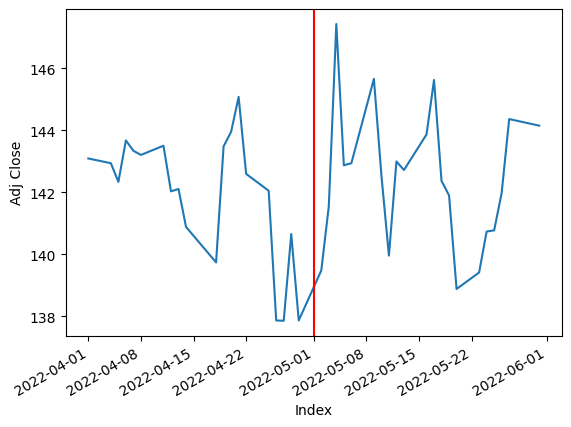

---------------------------------------------------------------------------
For AOS The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


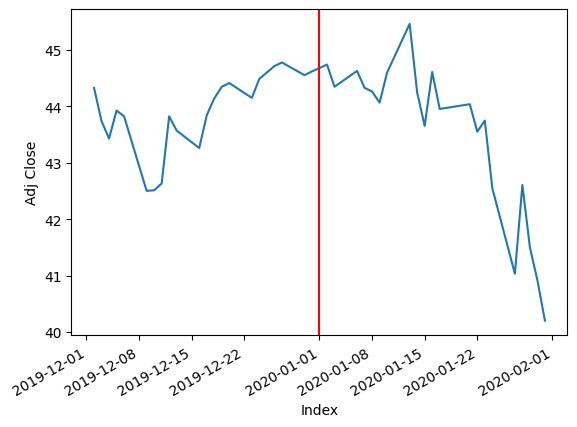

---------------------------------------------------------------------------
For ABT The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


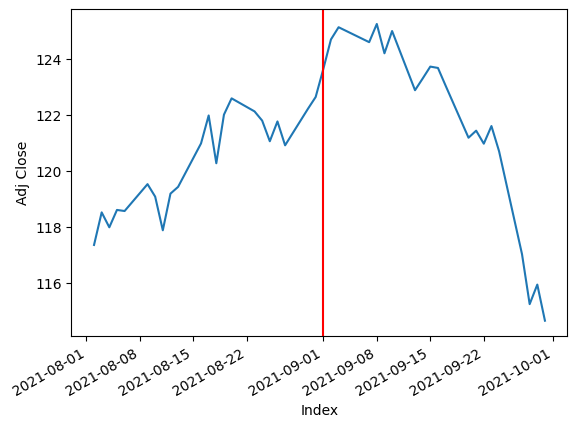

---------------------------------------------------------------------------
For ABBV The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


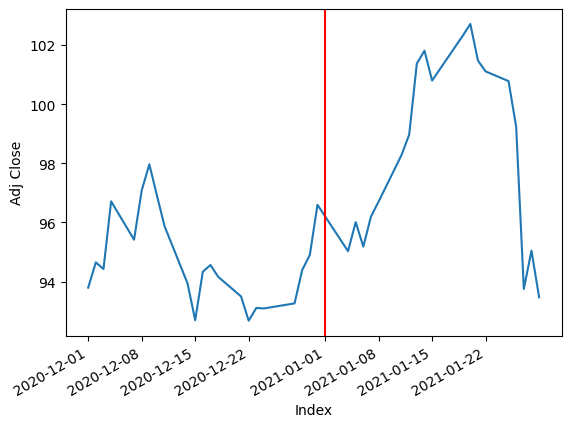

---------------------------------------------------------------------------
For ACN The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


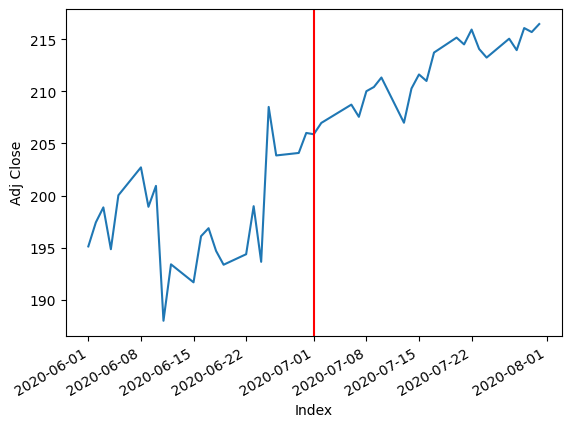

---------------------------------------------------------------------------
For ATVI The index when the drop is the largest 2016-02-01 00:00:00
2016-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


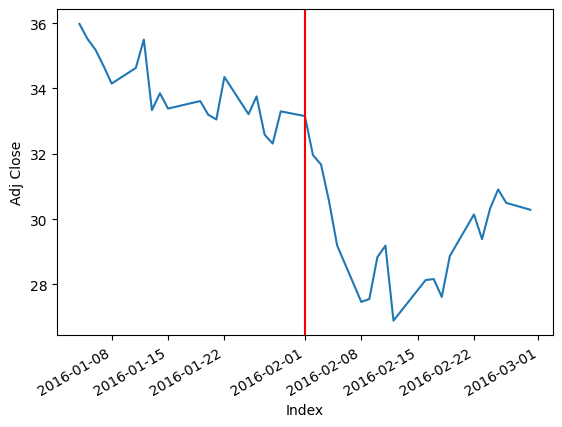

---------------------------------------------------------------------------
For ADM The index when the drop is the largest 2014-12-01 00:00:00
2014-12-01 00:00:00
[*********************100%***********************]  1 of 1 completed


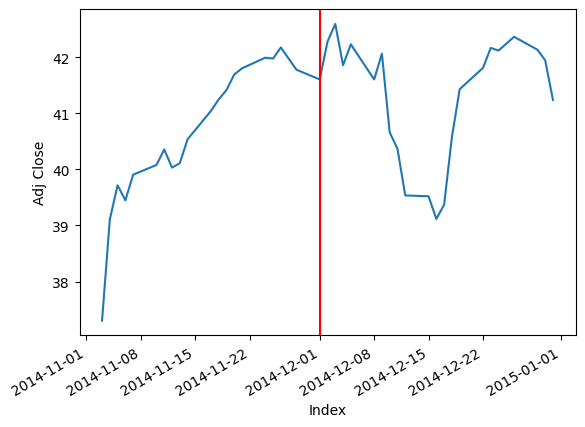

---------------------------------------------------------------------------
For ADBE The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


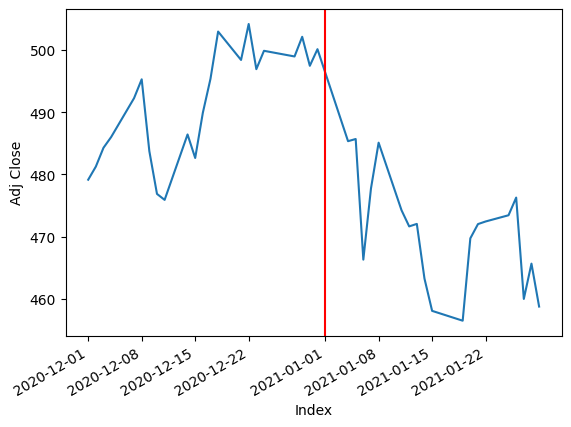

---------------------------------------------------------------------------
For ADP The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


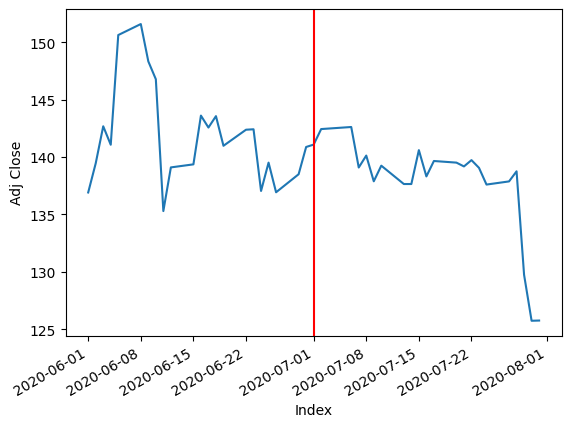

---------------------------------------------------------------------------
For AAP The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


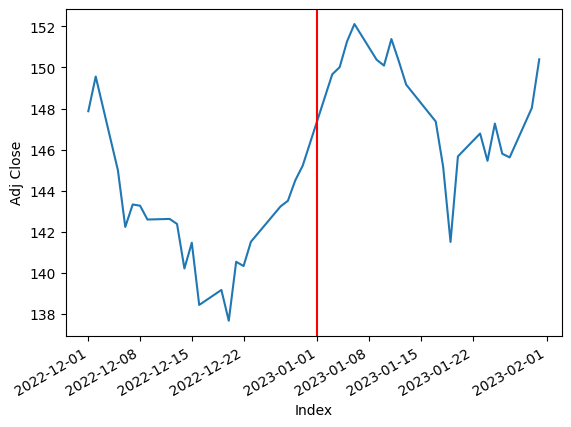

---------------------------------------------------------------------------
For AES The index when the drop is the largest 2015-01-01 00:00:00
2015-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


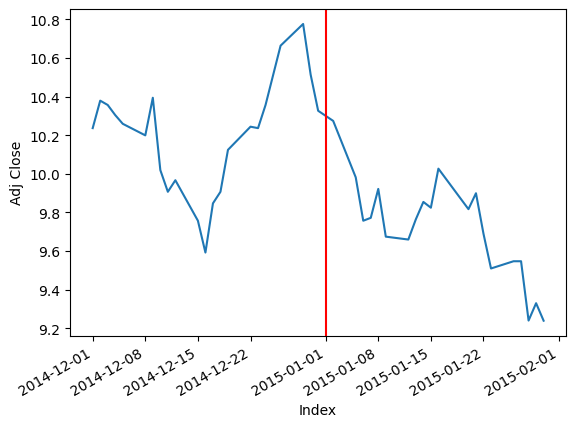

---------------------------------------------------------------------------
For AFL The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


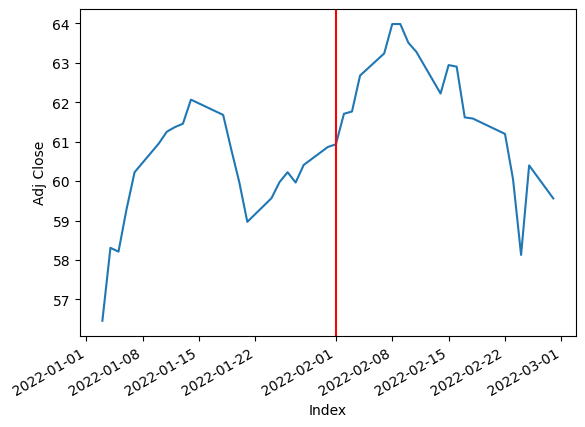

---------------------------------------------------------------------------
For A The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


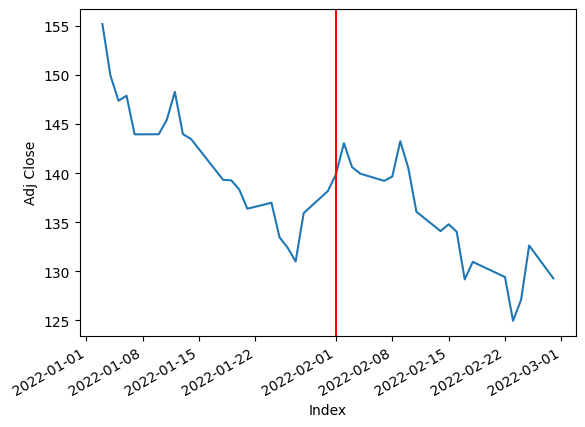

---------------------------------------------------------------------------
For APD The index when the drop is the largest 2019-01-01 00:00:00
2019-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


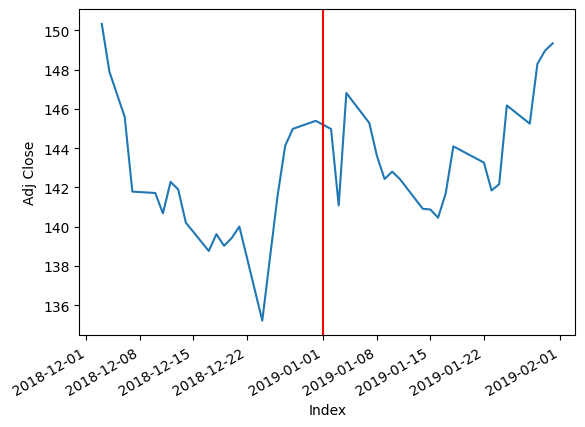

---------------------------------------------------------------------------
For AKAM The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


KeyboardInterrupt: ignored

In [ ]:
from dateutil.relativedelta import relativedelta
from datetime import datetime
import matplotlib.pyplot as plt





def eda(df,ticker):
  date= df['change'].dropna().idxmin()
  print("---------------------------------------------------------------------------")
  print("For", used_ticker[ticker], "The index when the drop is the largest", date)
  print(date)
  start_date = date - relativedelta(months=1)
  start_date = start_date.date()
  end_date = date + relativedelta(months=1)
  end_date = end_date.date()
  date = date.date()
  data = yf.download(used_ticker[ticker], start = start_date, end=end_date)
  data['Adj Close'].plot()
  plt.xlabel('Index')
  plt.ylabel('Adj Close')
  plt.axvline(x=date, color='r')
  plt.show()

for i in range(152):                  #153 번째 에러뜸
  eda(company_esg_normalized[i],i)


















---------------------------------------------------------------------------
For LLY The index when the drop is the largest 2021-02-01 00:00:00
2021-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


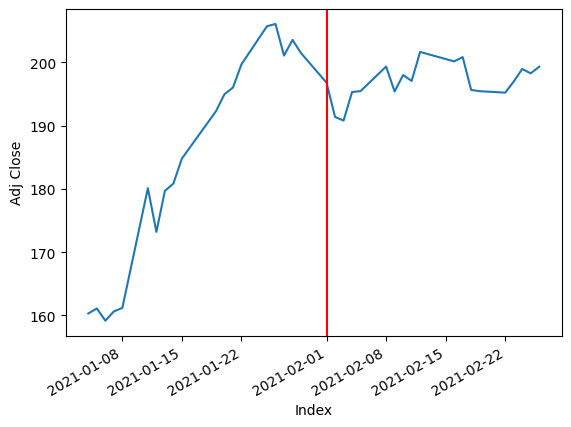

---------------------------------------------------------------------------
For EMR The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


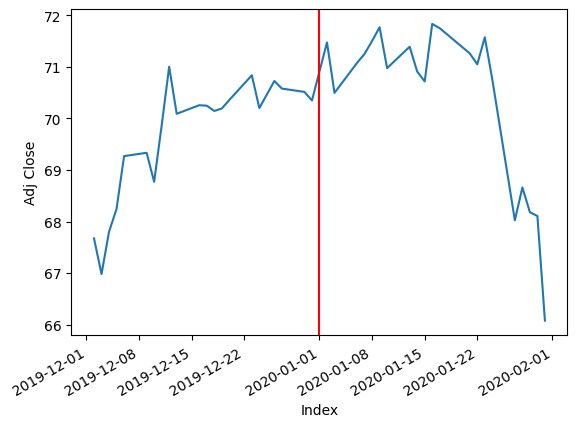

---------------------------------------------------------------------------
For ETR The index when the drop is the largest 2016-02-01 00:00:00
2016-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


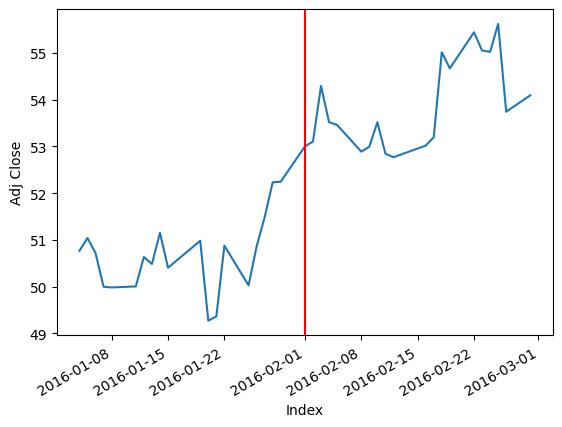

---------------------------------------------------------------------------
For EOG The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


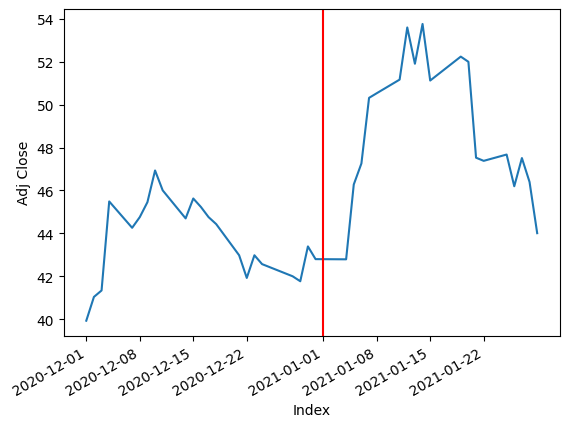

---------------------------------------------------------------------------
For EQT The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


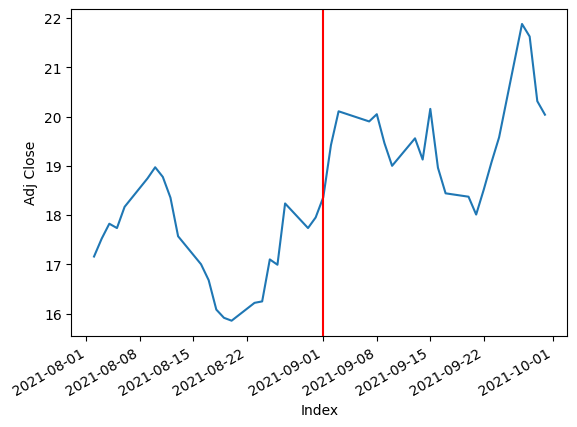

---------------------------------------------------------------------------
For EFX The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


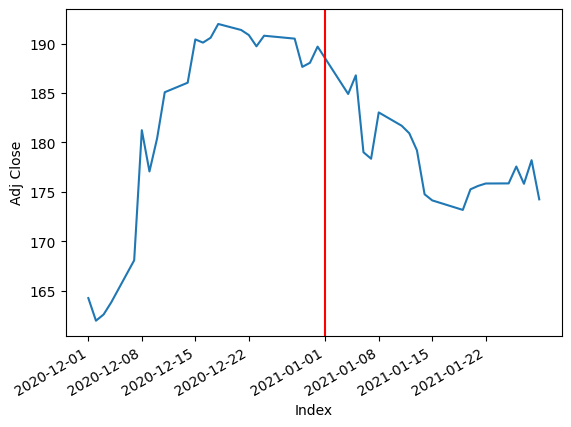

---------------------------------------------------------------------------
For EQIX The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


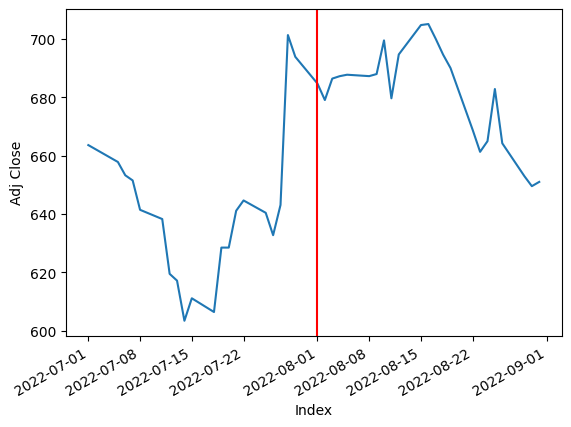

---------------------------------------------------------------------------
For EQR The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


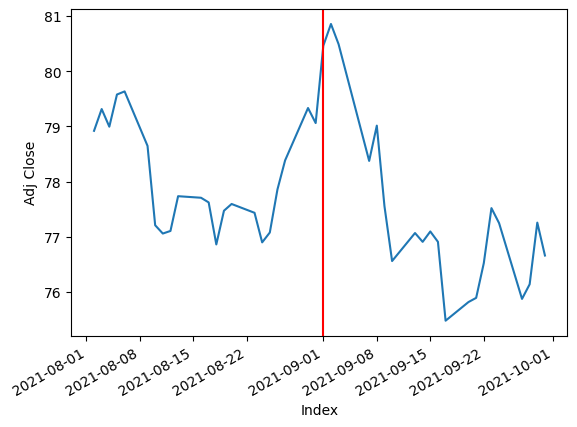

---------------------------------------------------------------------------
For ESS The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


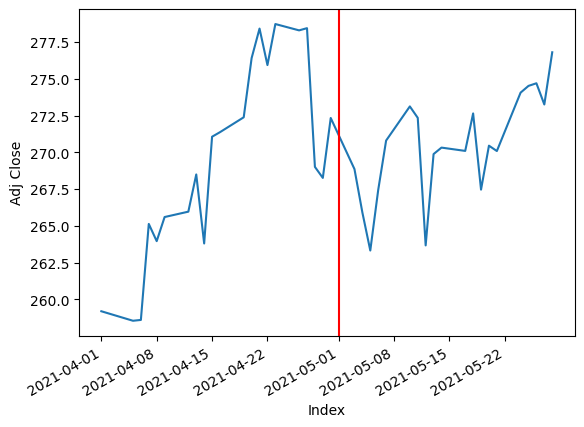

---------------------------------------------------------------------------
For EL The index when the drop is the largest 2019-09-01 00:00:00
2019-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


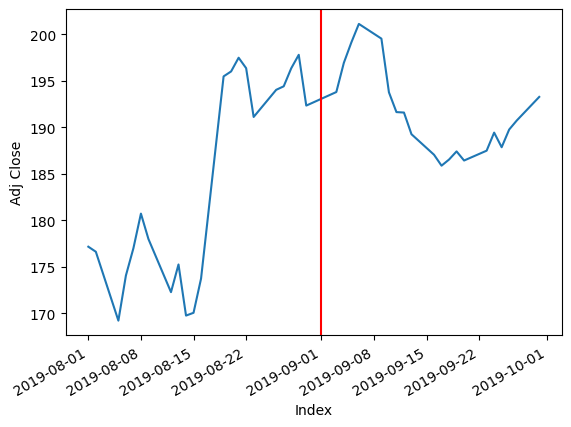

---------------------------------------------------------------------------
For ETSY The index when the drop is the largest 2018-04-01 00:00:00
2018-04-01 00:00:00
[*********************100%***********************]  1 of 1 completed


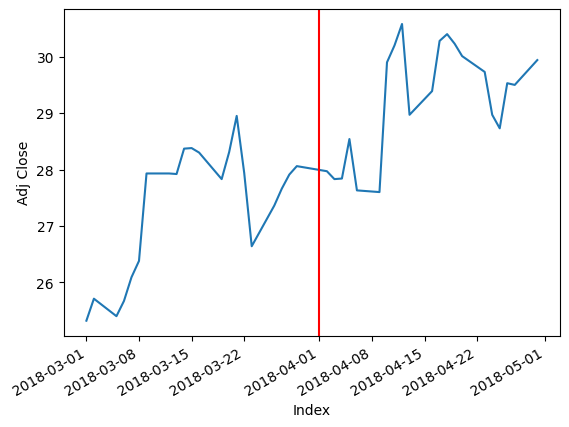

---------------------------------------------------------------------------
For RE The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


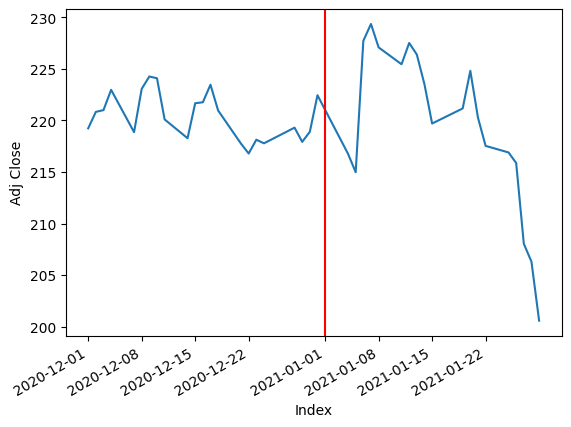

---------------------------------------------------------------------------
For ES The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


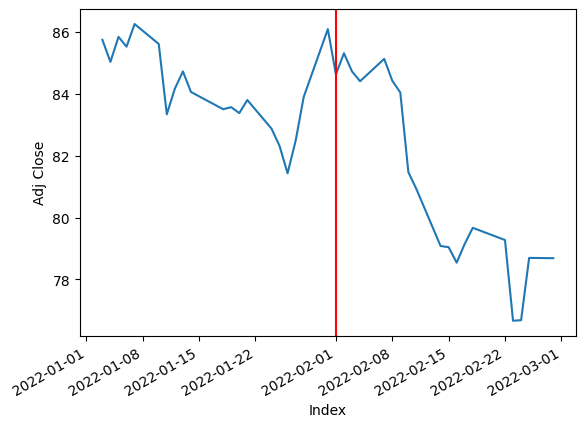

---------------------------------------------------------------------------
For EXC The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


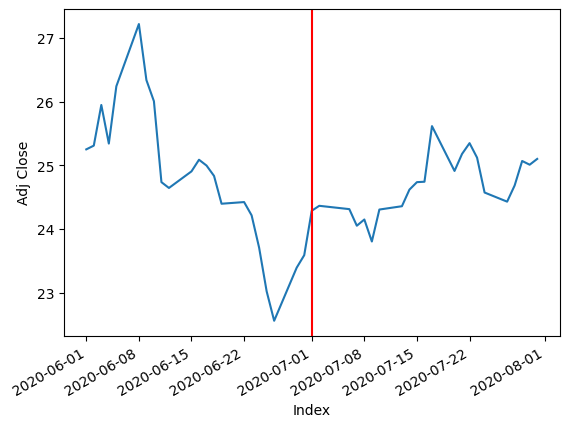

---------------------------------------------------------------------------
For EXPE The index when the drop is the largest 2019-11-01 00:00:00
2019-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


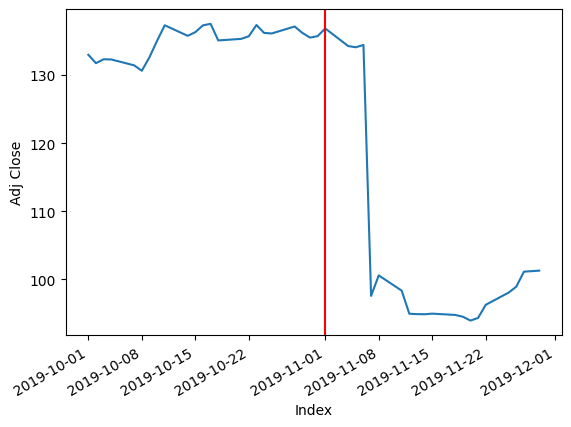

---------------------------------------------------------------------------
For EXPD The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


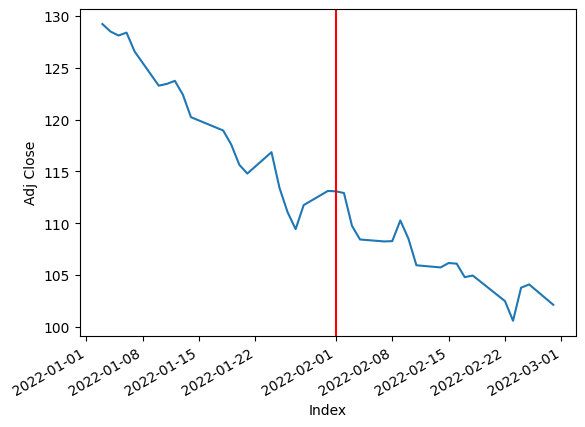

---------------------------------------------------------------------------
For EXR The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


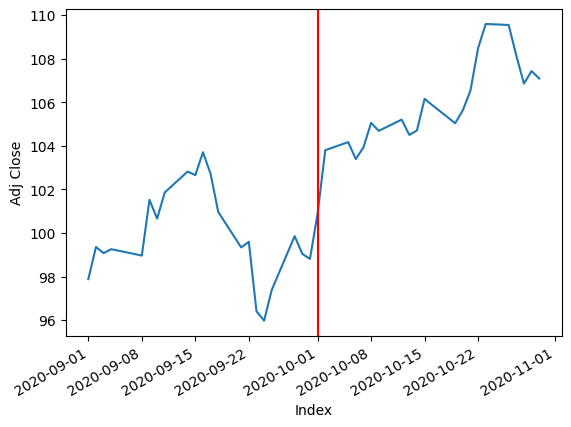

---------------------------------------------------------------------------
For XOM The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


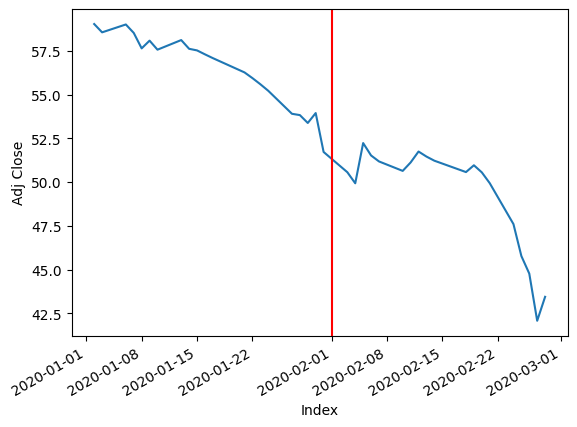

---------------------------------------------------------------------------
For FFIV The index when the drop is the largest 2019-11-01 00:00:00
2019-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


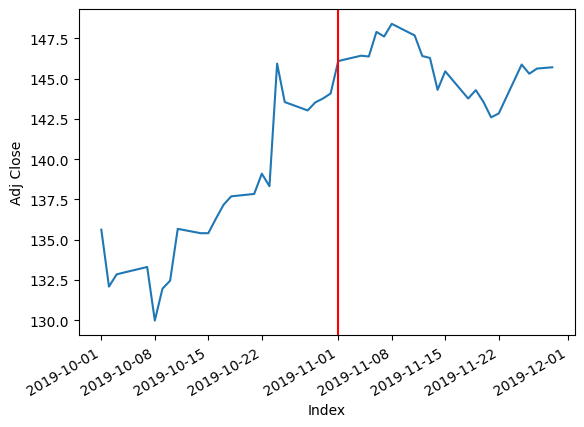

---------------------------------------------------------------------------
For FDS The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


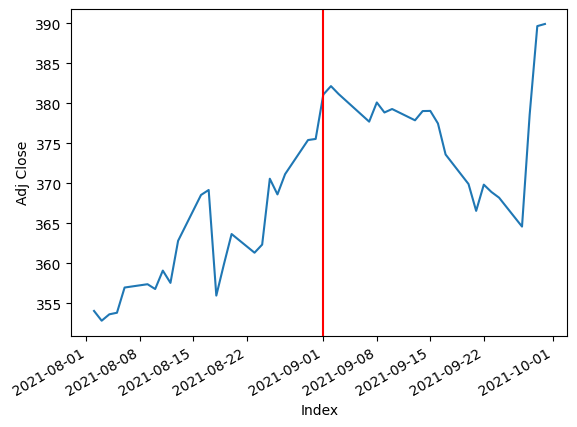

---------------------------------------------------------------------------
For FAST The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


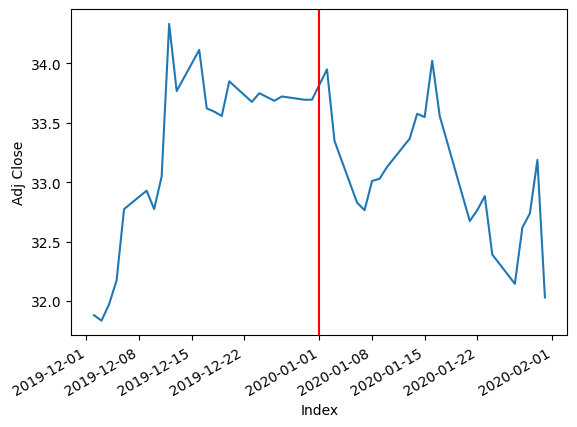

---------------------------------------------------------------------------
For FRT The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


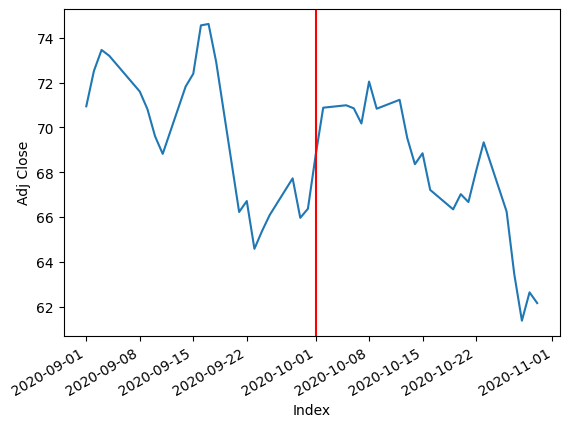

---------------------------------------------------------------------------
For FDX The index when the drop is the largest 2020-08-01 00:00:00
2020-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


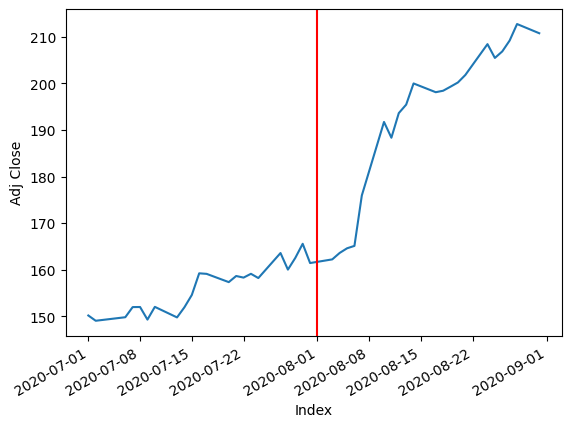

---------------------------------------------------------------------------
For FITB The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


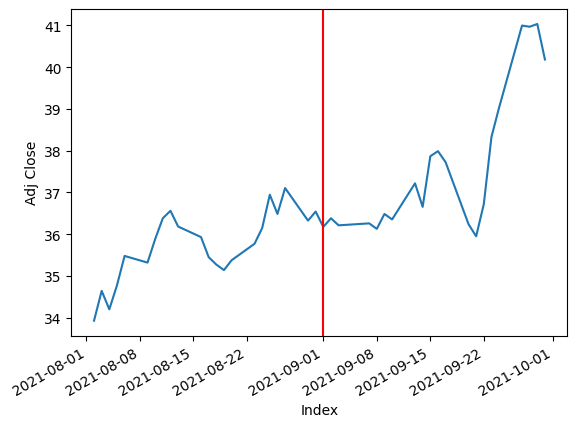

---------------------------------------------------------------------------
For FE The index when the drop is the largest 2017-09-01 00:00:00
2017-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


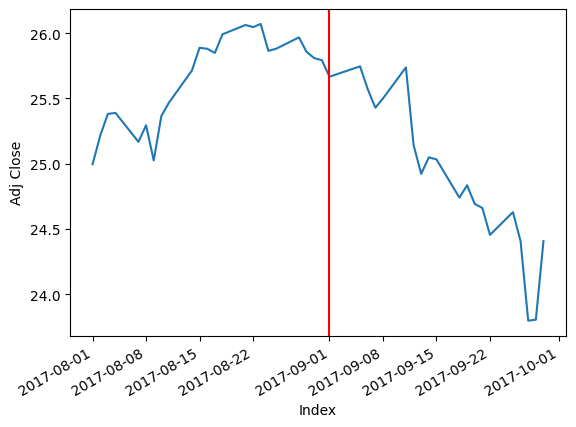

---------------------------------------------------------------------------
For FIS The index when the drop is the largest 2019-01-01 00:00:00
2019-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


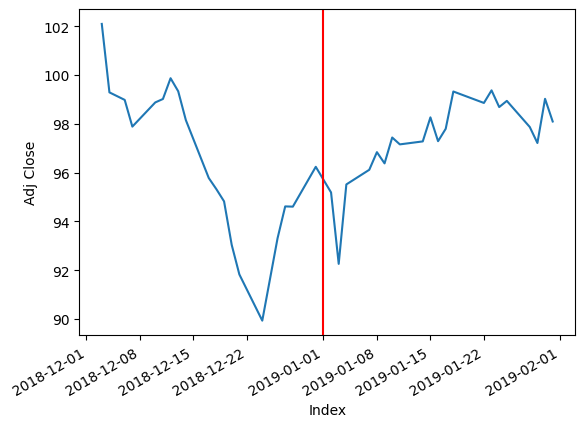

---------------------------------------------------------------------------
For FISV The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


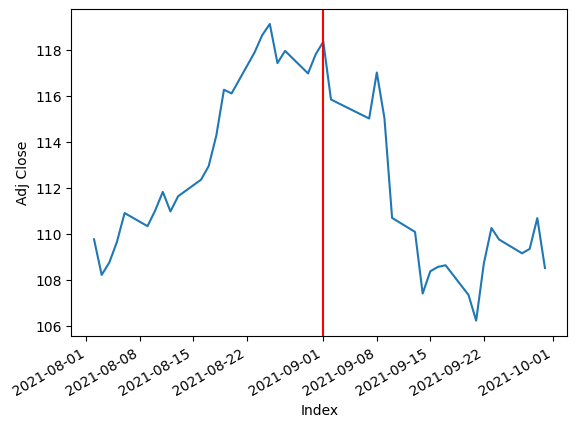

---------------------------------------------------------------------------
For FLT The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


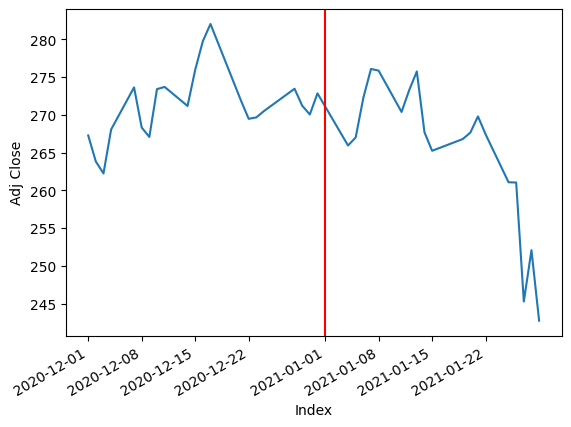

---------------------------------------------------------------------------
For FMC The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


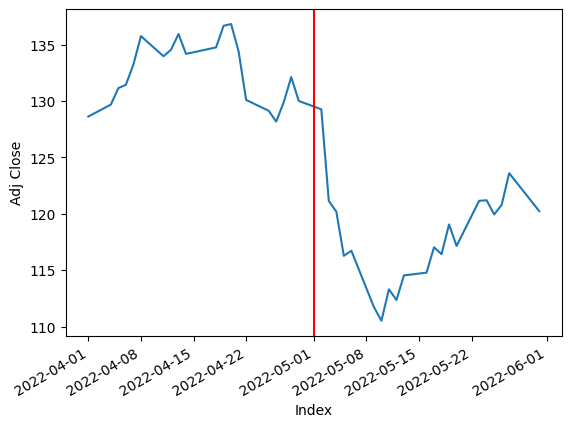

---------------------------------------------------------------------------
For F The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


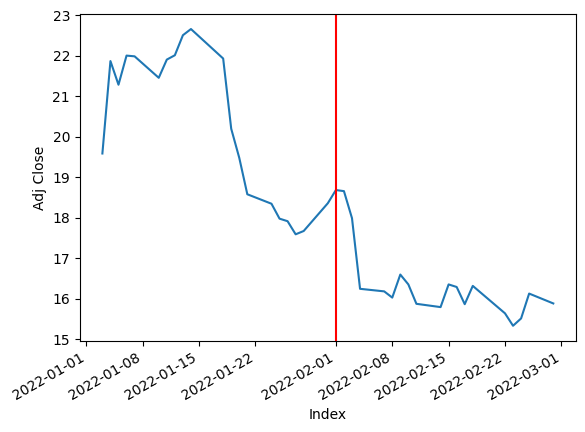

---------------------------------------------------------------------------
For FTNT The index when the drop is the largest 2016-10-01 00:00:00
2016-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


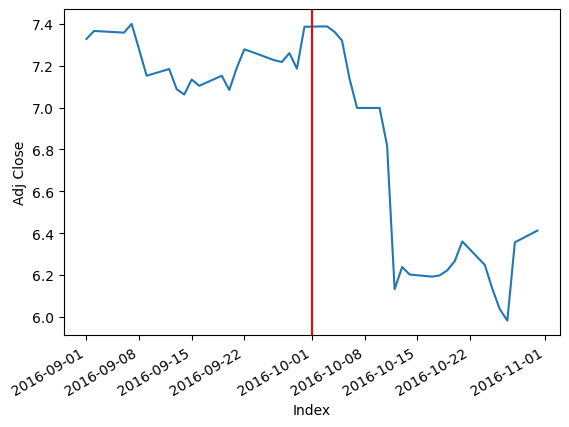

---------------------------------------------------------------------------
For FTV The index when the drop is the largest 2019-02-01 00:00:00
2019-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


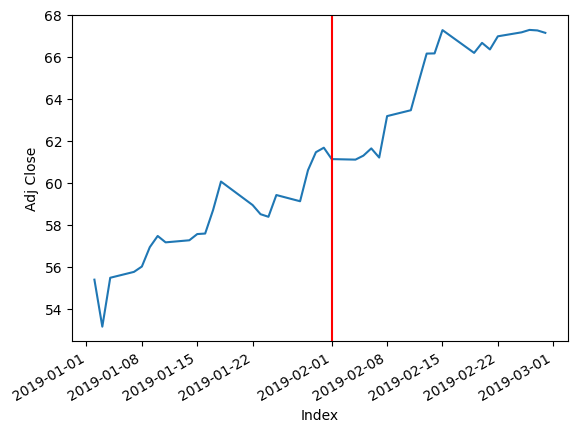

---------------------------------------------------------------------------
For FOXA The index when the drop is the largest 2016-05-01 00:00:00
2016-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- FOXA: Data doesn't exist for startDate = 1459483200, endDate = 1464753600


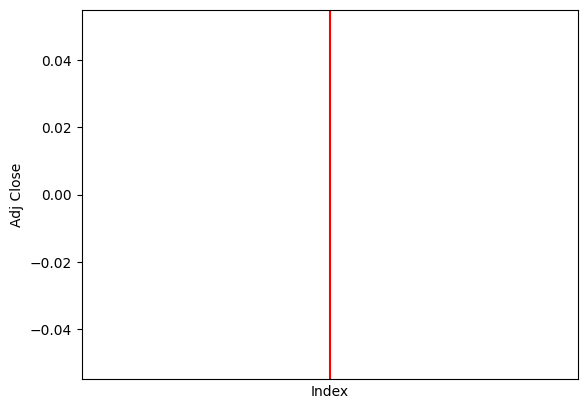

---------------------------------------------------------------------------
For BEN The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


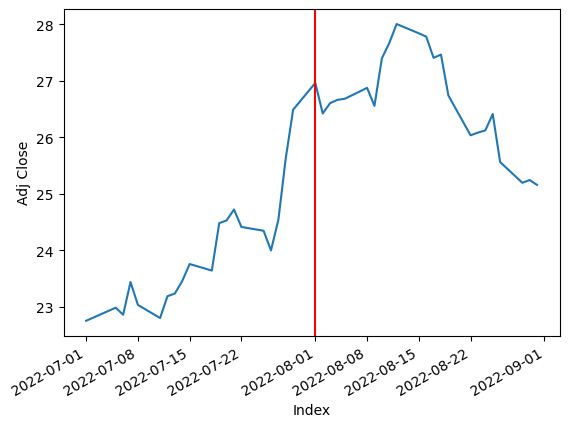

---------------------------------------------------------------------------
For FCX The index when the drop is the largest 2015-01-01 00:00:00
2015-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


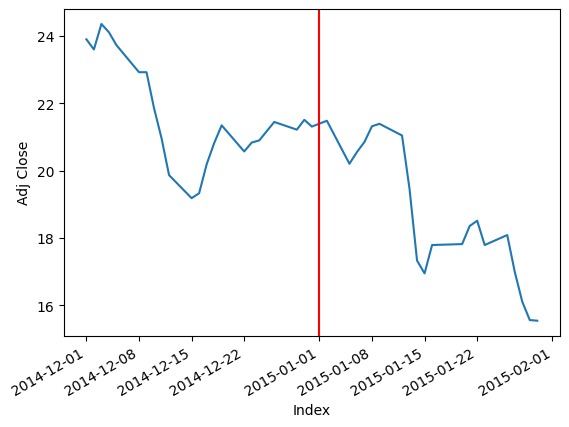

---------------------------------------------------------------------------
For GRMN The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


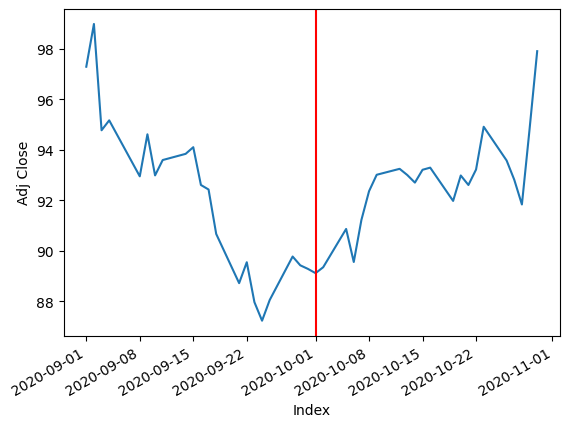

---------------------------------------------------------------------------
For IT The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


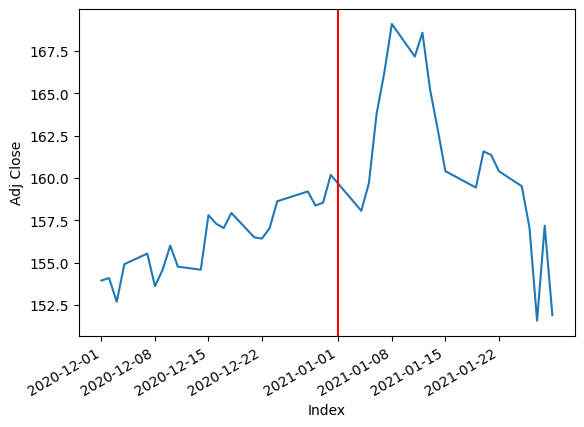

---------------------------------------------------------------------------
For GD The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


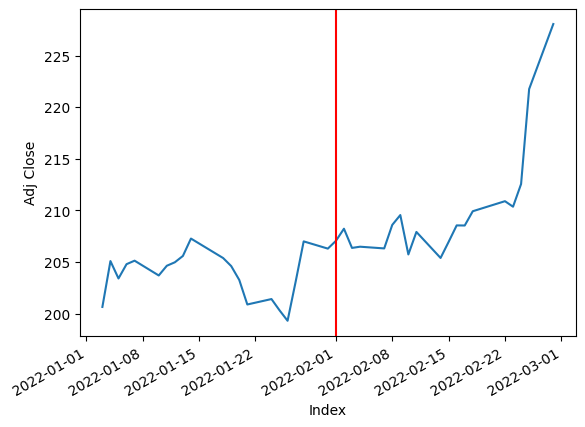

---------------------------------------------------------------------------
For GE The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


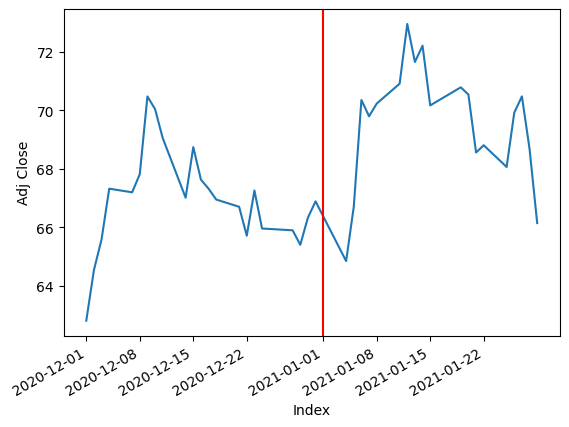

---------------------------------------------------------------------------
For GIS The index when the drop is the largest 2015-07-01 00:00:00
2015-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


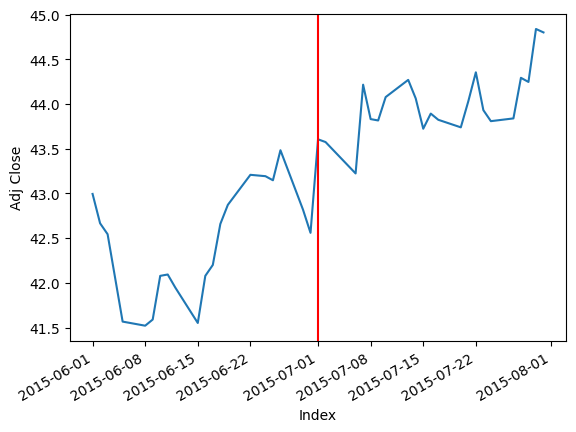

---------------------------------------------------------------------------
For GM The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


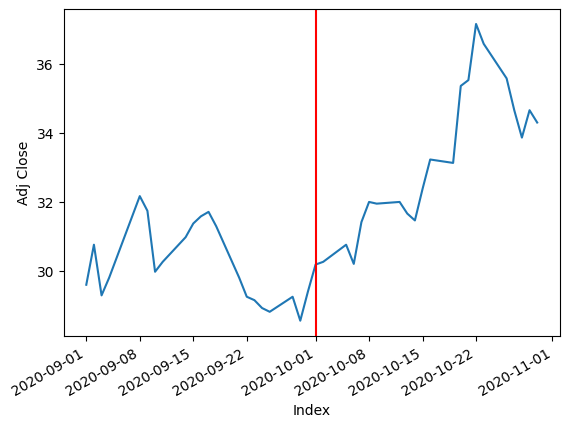

---------------------------------------------------------------------------
For GPC The index when the drop is the largest 2019-11-01 00:00:00
2019-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


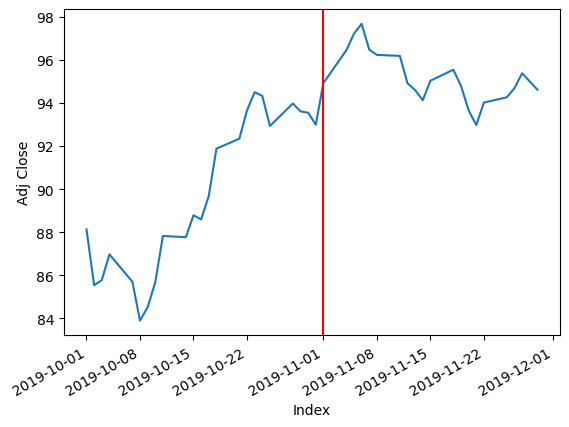

---------------------------------------------------------------------------
For GILD The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


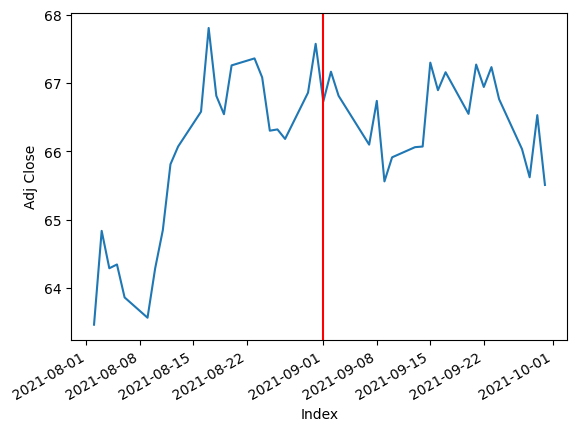

---------------------------------------------------------------------------
For GL The index when the drop is the largest 2019-11-01 00:00:00
2019-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


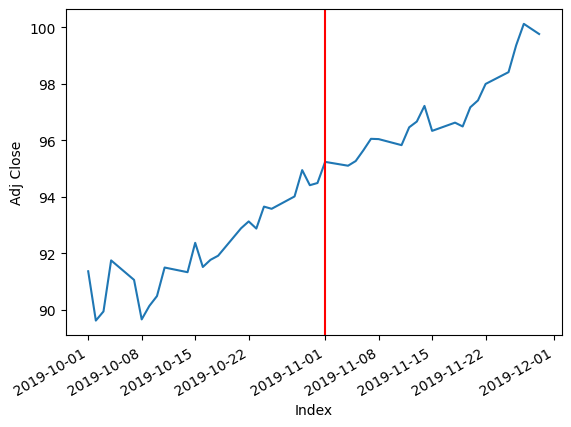

---------------------------------------------------------------------------
For GPN The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


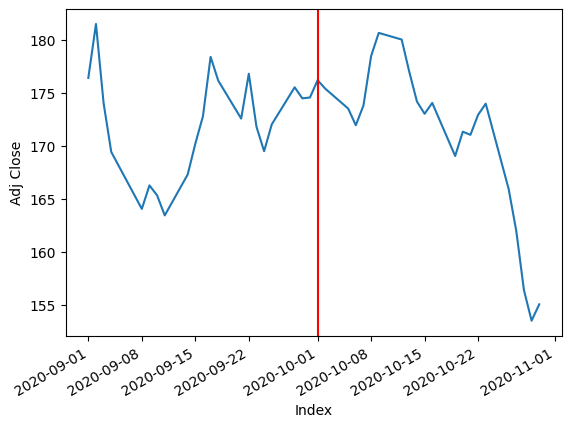

---------------------------------------------------------------------------
For GS The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


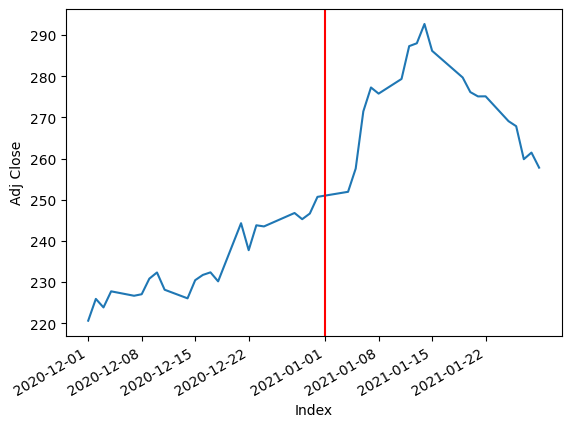

---------------------------------------------------------------------------
For HAL The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


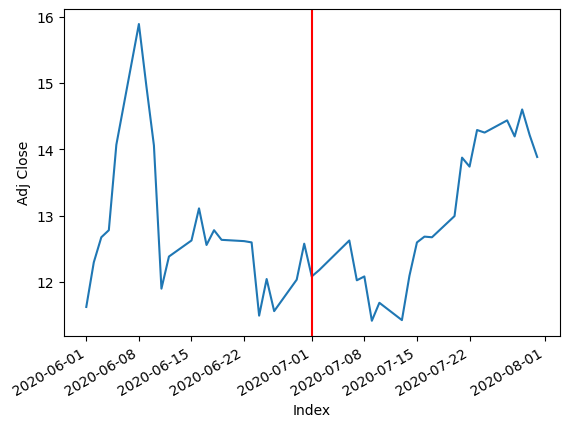

---------------------------------------------------------------------------
For HIG The index when the drop is the largest 2018-07-01 00:00:00
2018-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


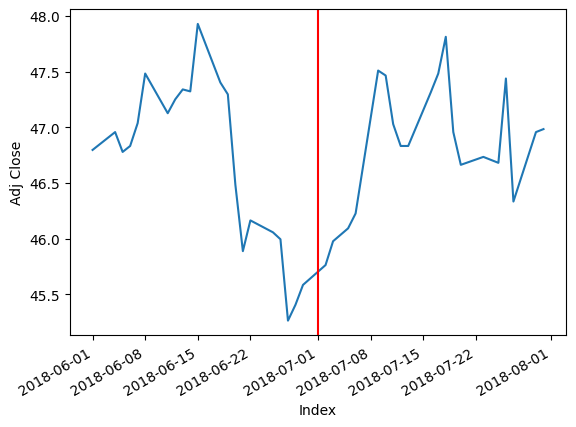

---------------------------------------------------------------------------
For HAS The index when the drop is the largest 2015-12-01 00:00:00
2015-12-01 00:00:00
[*********************100%***********************]  1 of 1 completed


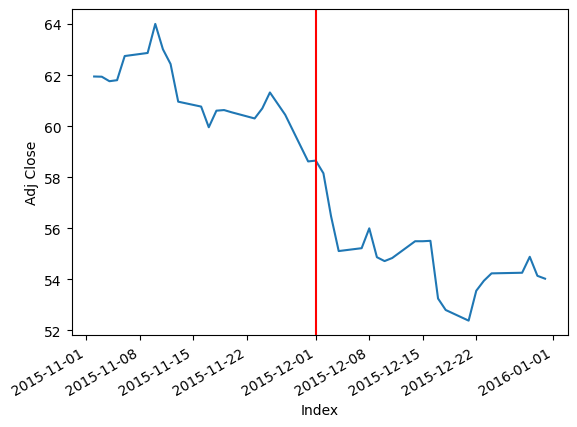

---------------------------------------------------------------------------
For HCA The index when the drop is the largest 2016-06-01 00:00:00
2016-06-01 00:00:00
[*********************100%***********************]  1 of 1 completed


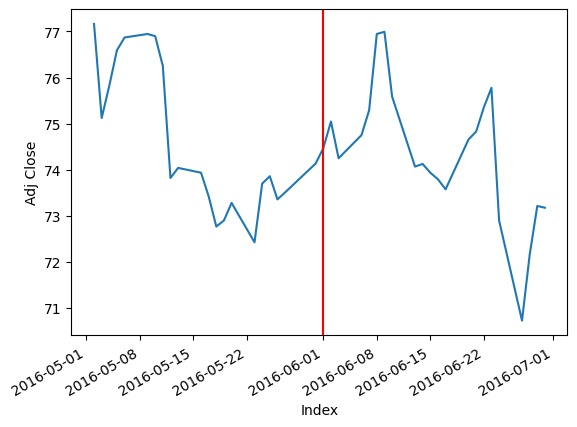

---------------------------------------------------------------------------
For PEAK The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


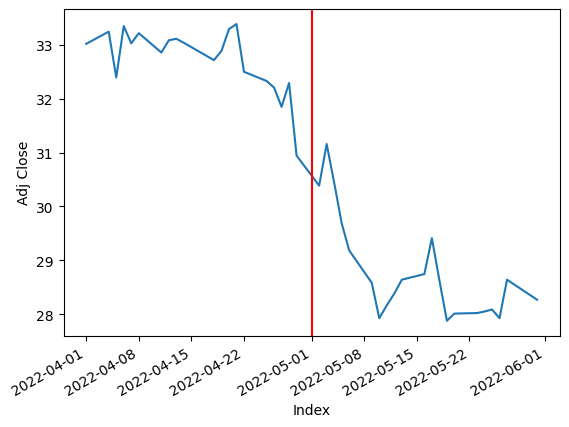

---------------------------------------------------------------------------
For HSIC The index when the drop is the largest 2015-12-01 00:00:00
2015-12-01 00:00:00
[*********************100%***********************]  1 of 1 completed


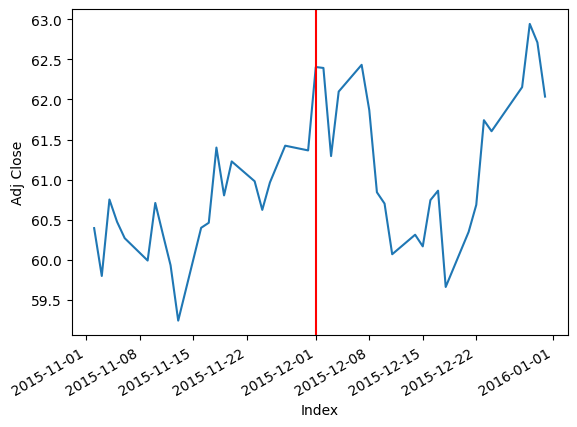

---------------------------------------------------------------------------
For HSY The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


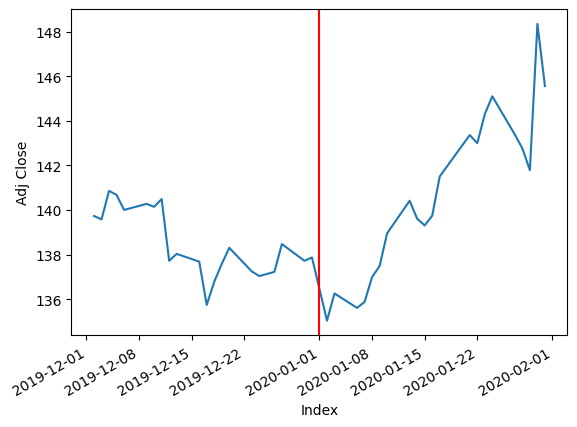

---------------------------------------------------------------------------
For HES The index when the drop is the largest 2018-02-01 00:00:00
2018-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


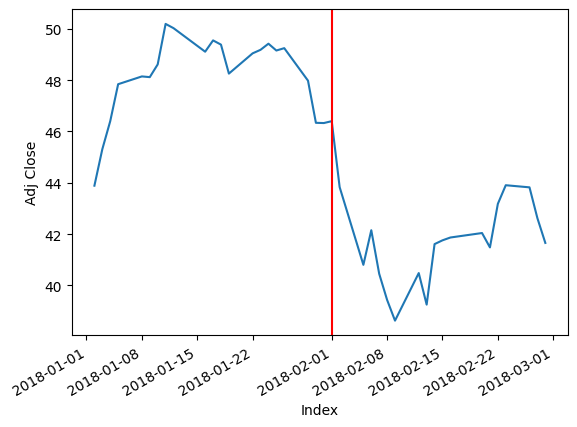

---------------------------------------------------------------------------
For HPE The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


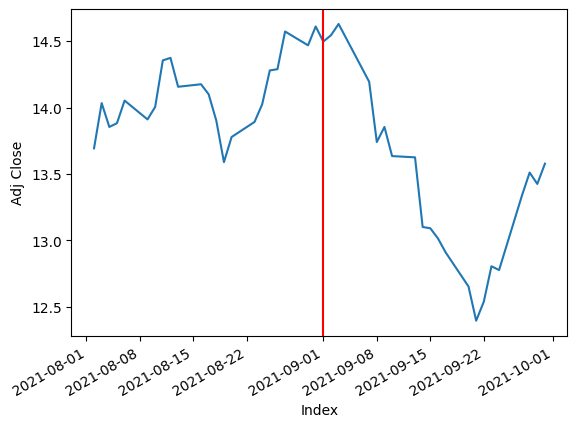

---------------------------------------------------------------------------
For HLT The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


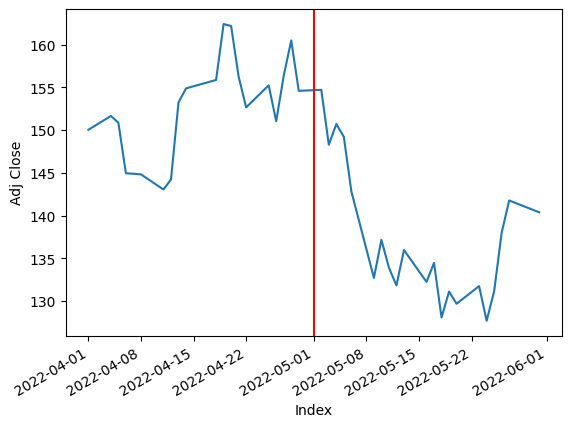

---------------------------------------------------------------------------
For HOLX The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


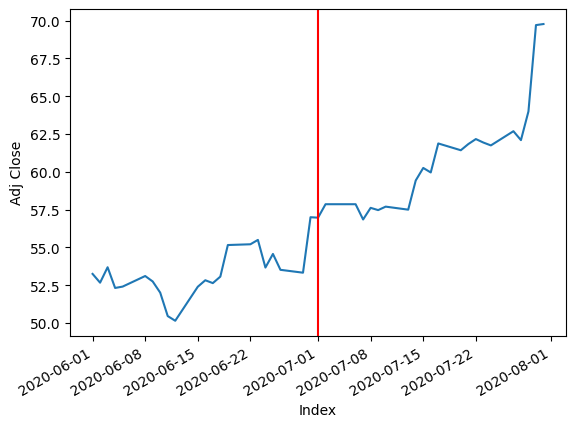

---------------------------------------------------------------------------
For HD The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


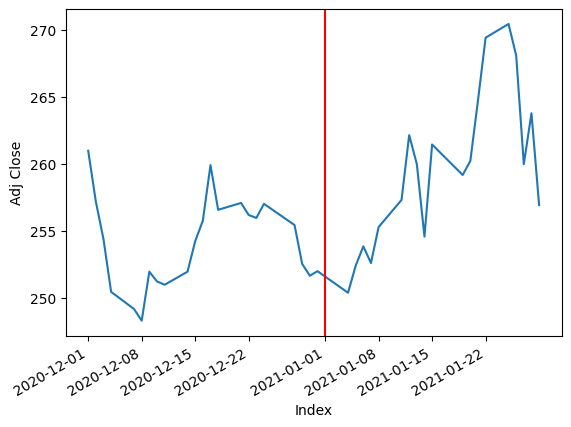

---------------------------------------------------------------------------
For HON The index when the drop is the largest 2020-03-01 00:00:00
2020-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


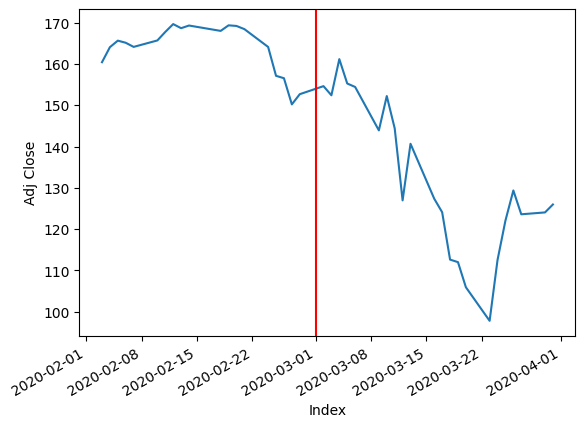

---------------------------------------------------------------------------
For HRL The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


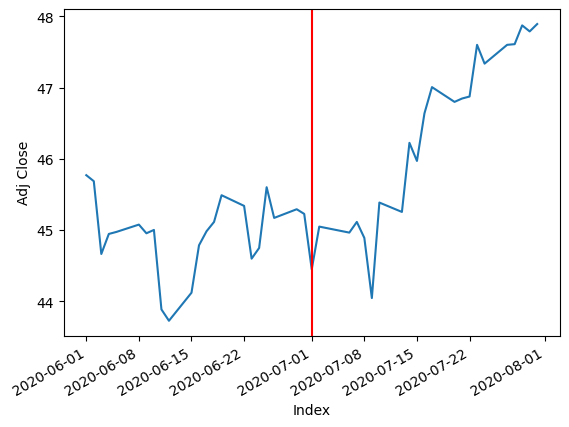

---------------------------------------------------------------------------
For HST The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


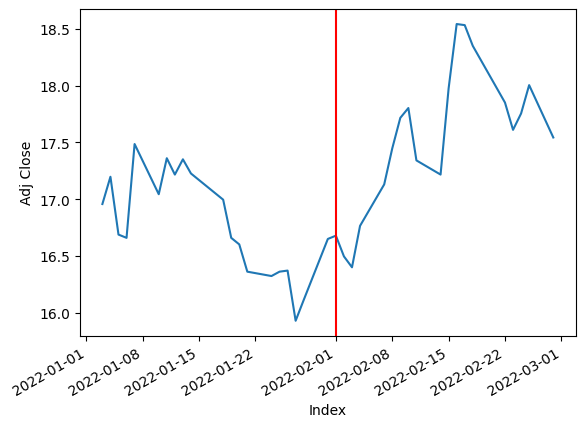

---------------------------------------------------------------------------
For HPQ The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


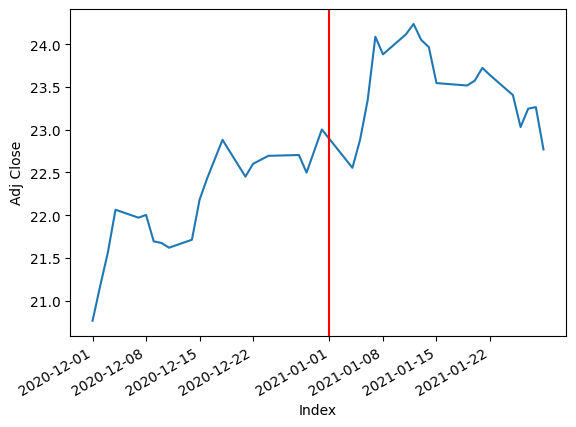

---------------------------------------------------------------------------
For HUM The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


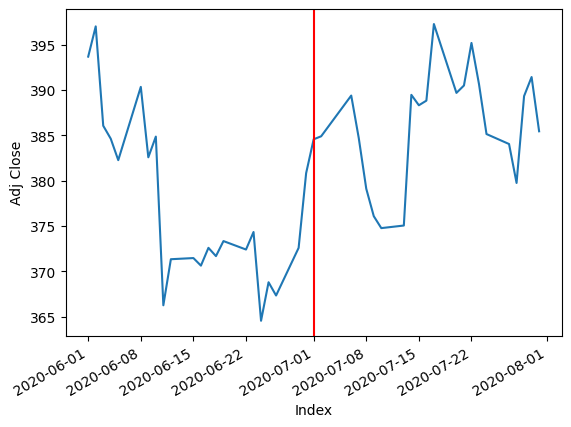

---------------------------------------------------------------------------
For HBAN The index when the drop is the largest 2019-09-01 00:00:00
2019-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


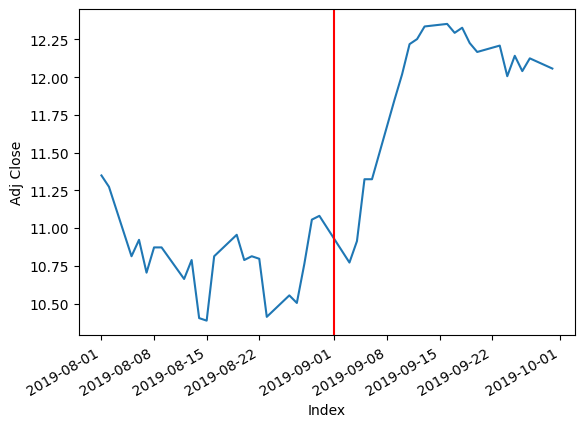

---------------------------------------------------------------------------
For HII The index when the drop is the largest 2018-11-01 00:00:00
2018-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


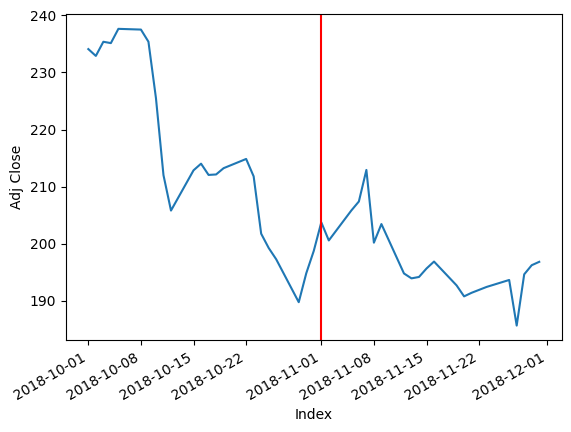

---------------------------------------------------------------------------
For IBM The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


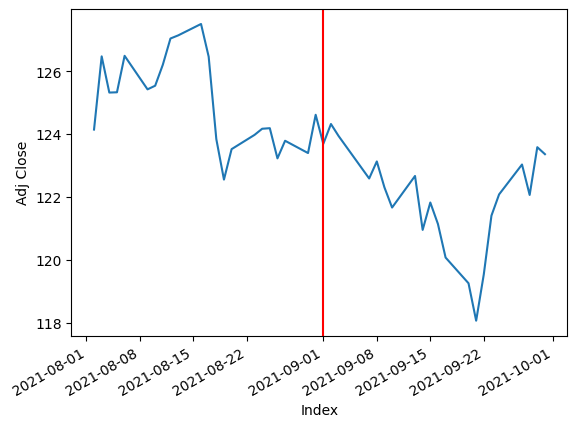

---------------------------------------------------------------------------
For IEX The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


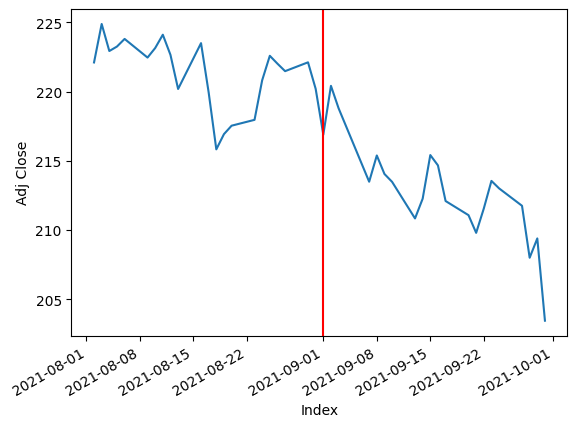

---------------------------------------------------------------------------
For IDXX The index when the drop is the largest 2016-11-01 00:00:00
2016-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


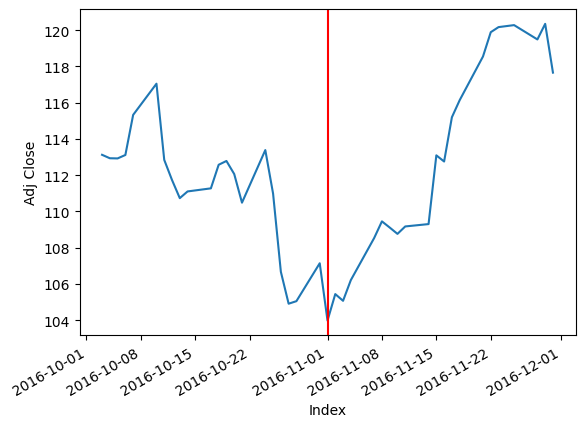

---------------------------------------------------------------------------
For ITW The index when the drop is the largest 2020-08-01 00:00:00
2020-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


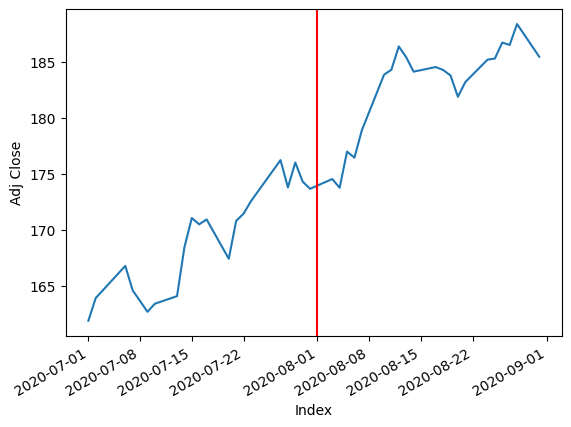

---------------------------------------------------------------------------
For ILMN The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


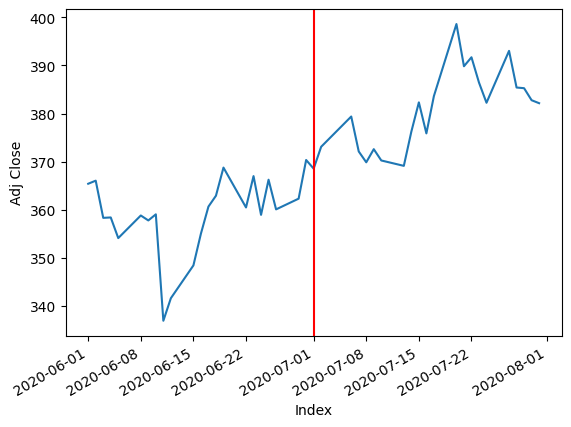

---------------------------------------------------------------------------
For INCY The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


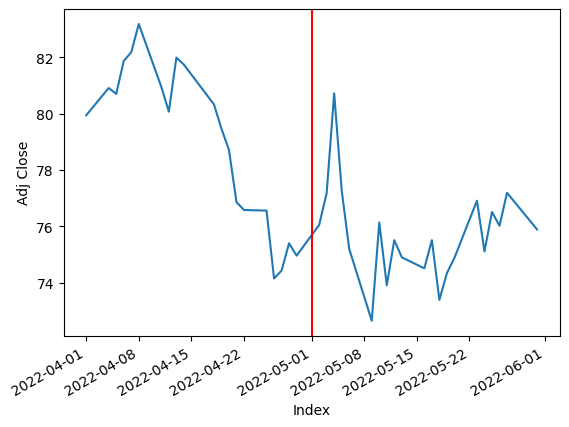

---------------------------------------------------------------------------
For IR The index when the drop is the largest 2020-03-01 00:00:00
2020-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


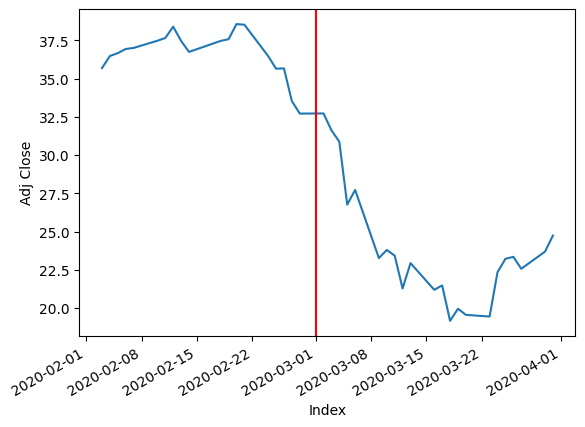

---------------------------------------------------------------------------
For INTC The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


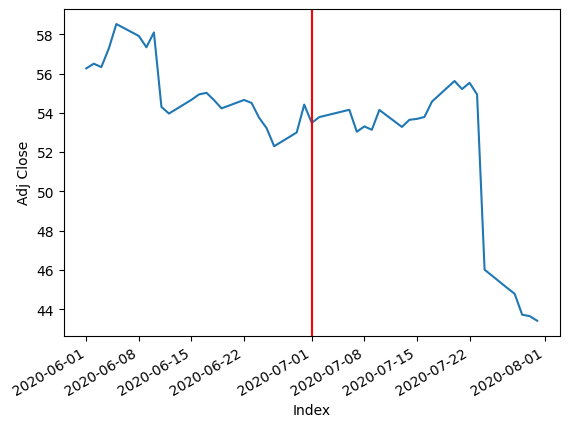

---------------------------------------------------------------------------
For ICE The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


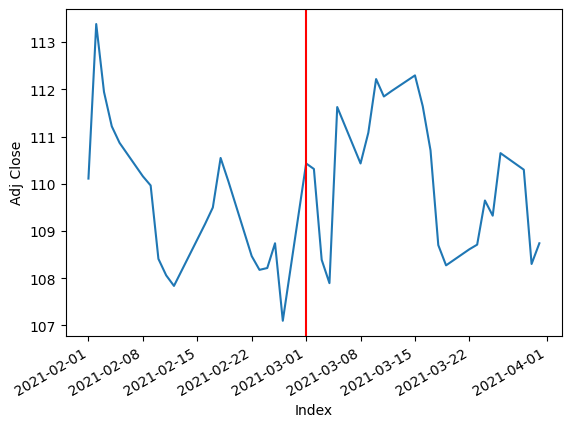

---------------------------------------------------------------------------
For IFF The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


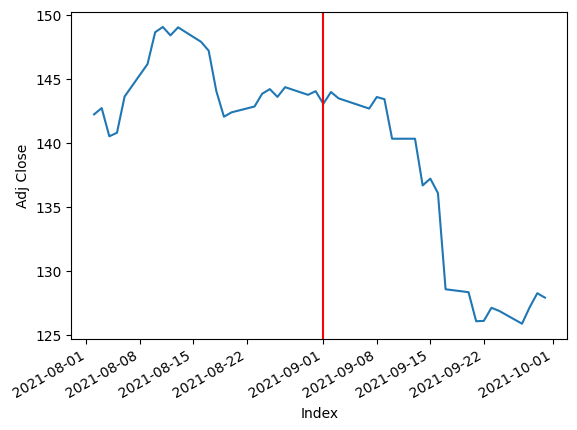

---------------------------------------------------------------------------
For IP The index when the drop is the largest 2016-09-01 00:00:00
2016-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


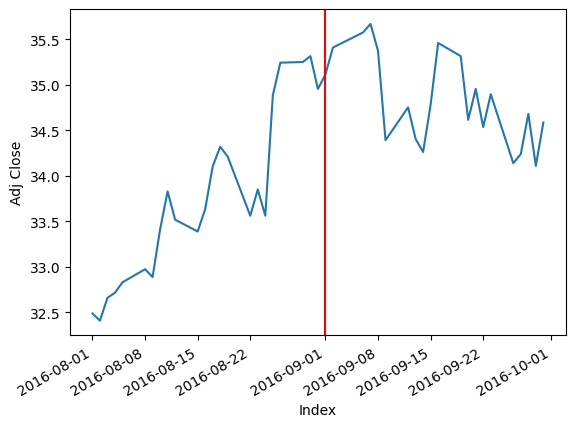

---------------------------------------------------------------------------
For IPG The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


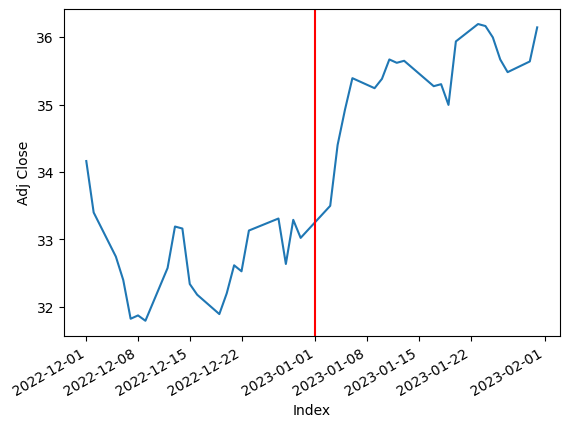

---------------------------------------------------------------------------
For INTU The index when the drop is the largest 2020-08-01 00:00:00
2020-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


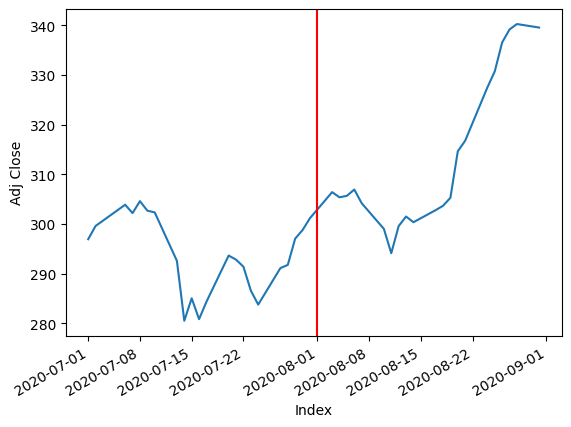

---------------------------------------------------------------------------
For ISRG The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


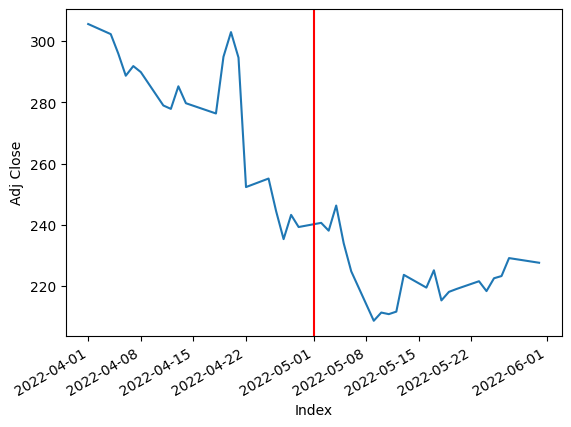

---------------------------------------------------------------------------
For IVZ The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


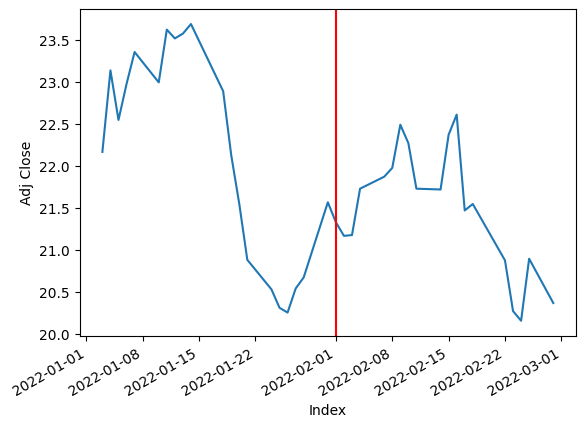

---------------------------------------------------------------------------
For IQV The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


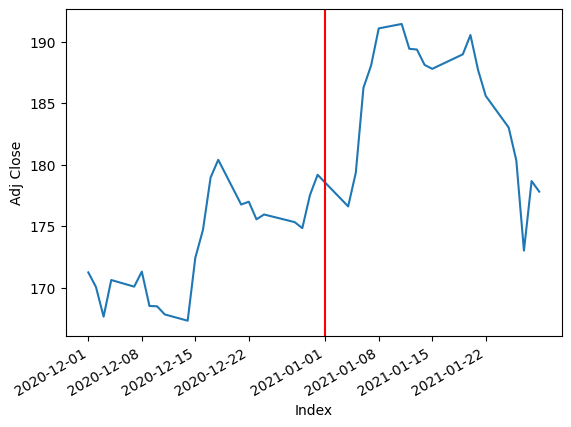

---------------------------------------------------------------------------
For IRM The index when the drop is the largest 2014-10-01 00:00:00
2014-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


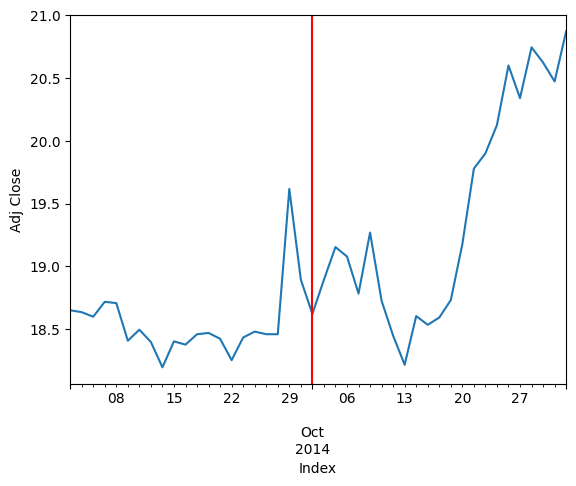

---------------------------------------------------------------------------
For JBHT The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


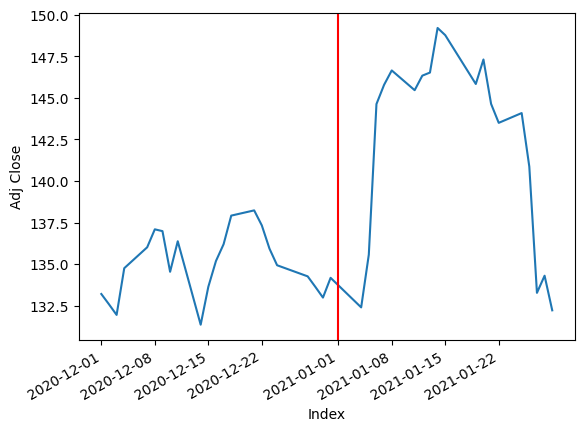

---------------------------------------------------------------------------
For JKHY The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


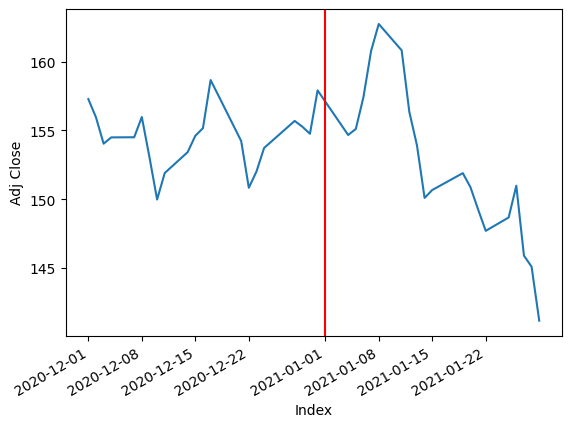

---------------------------------------------------------------------------
For J The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


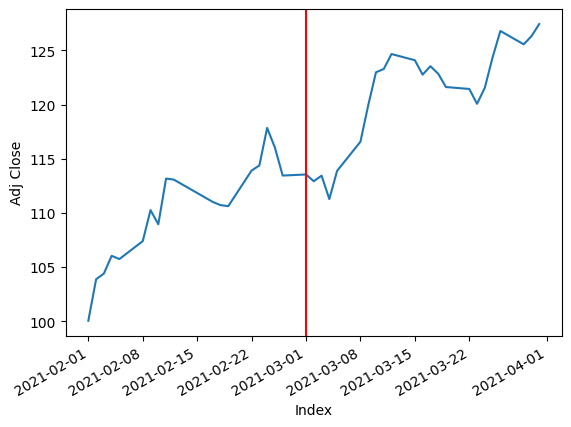

---------------------------------------------------------------------------
For JNJ The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


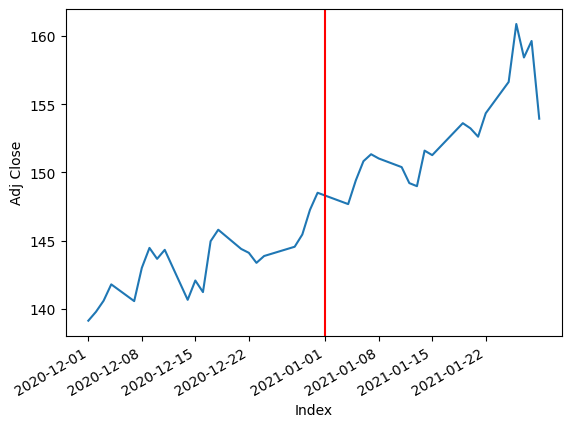

---------------------------------------------------------------------------
For JCI The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


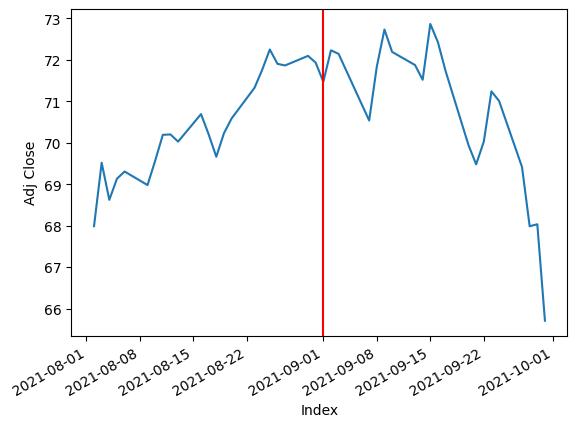

---------------------------------------------------------------------------
For JPM The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


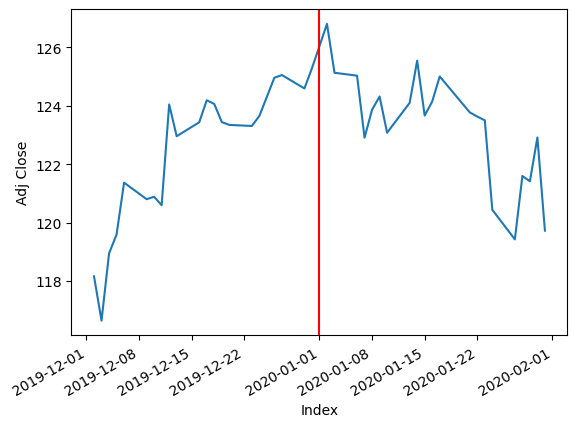

---------------------------------------------------------------------------
For JNPR The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


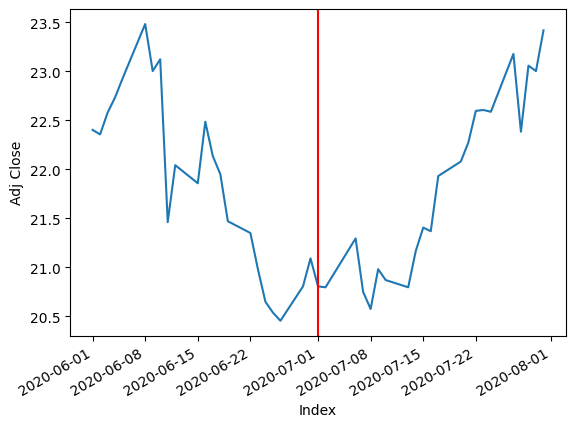

---------------------------------------------------------------------------
For K The index when the drop is the largest 2019-09-01 00:00:00
2019-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


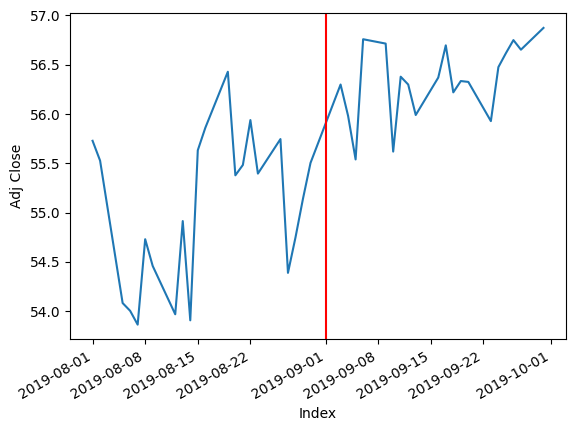

---------------------------------------------------------------------------
For KEY The index when the drop is the largest 2018-09-01 00:00:00
2018-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


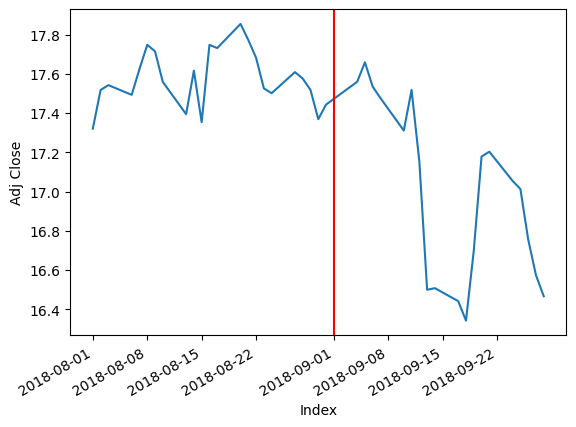

---------------------------------------------------------------------------
For KEYS The index when the drop is the largest 2017-01-01 00:00:00
2017-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


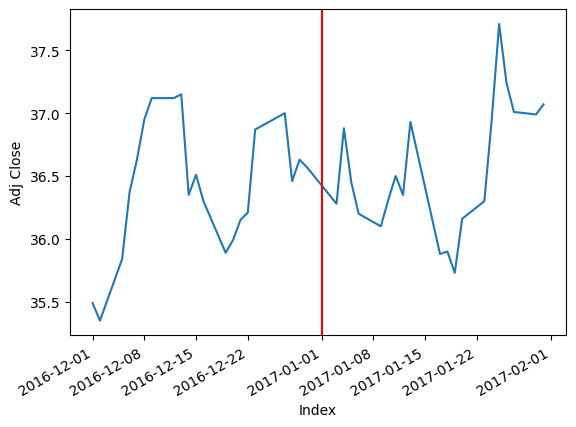

---------------------------------------------------------------------------
For KMB The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


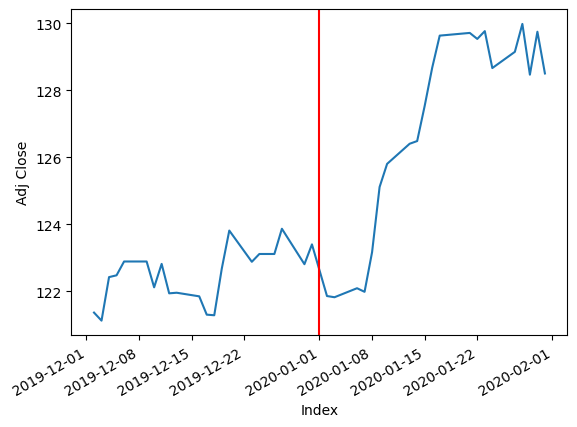

---------------------------------------------------------------------------
For KIM The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


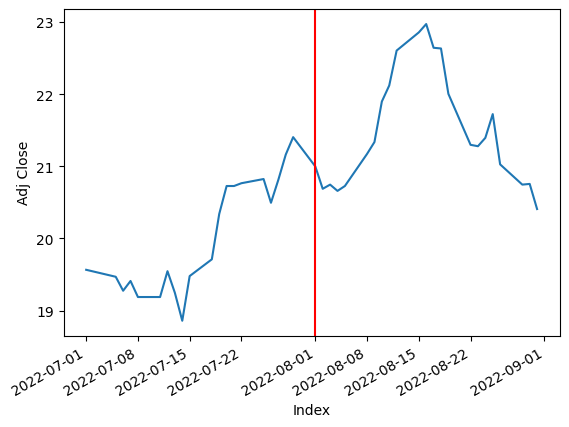

---------------------------------------------------------------------------
For KMI The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


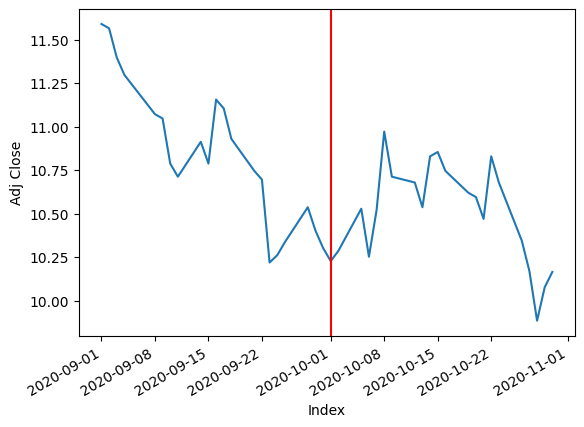

---------------------------------------------------------------------------
For KLAC The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


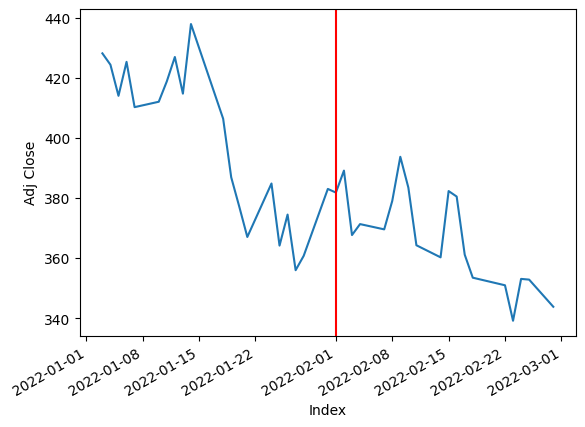

---------------------------------------------------------------------------
For KHC The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


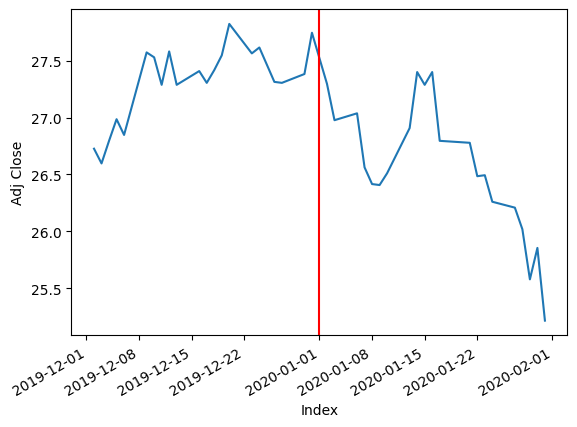

---------------------------------------------------------------------------
For KR The index when the drop is the largest 2018-11-01 00:00:00
2018-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


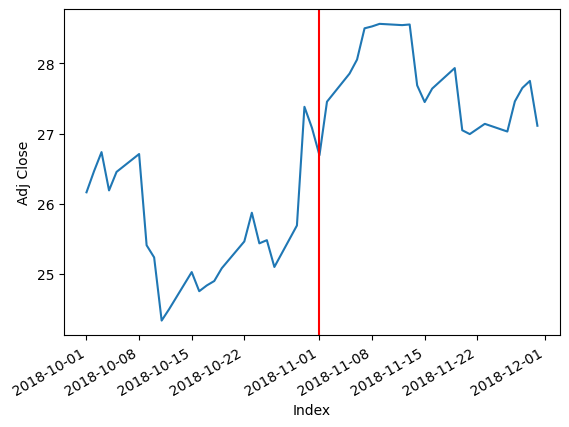

---------------------------------------------------------------------------
For LH The index when the drop is the largest 2017-01-01 00:00:00
2017-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


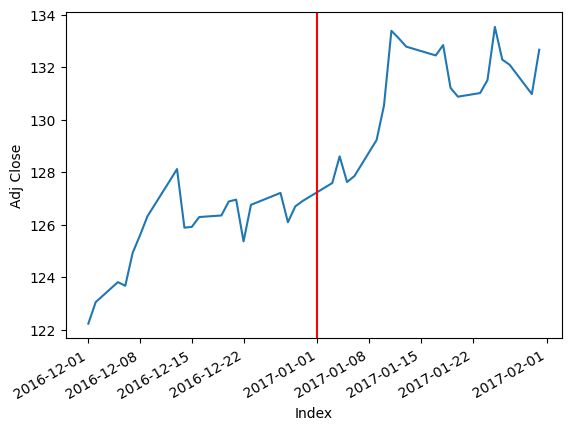

---------------------------------------------------------------------------
For LRCX The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


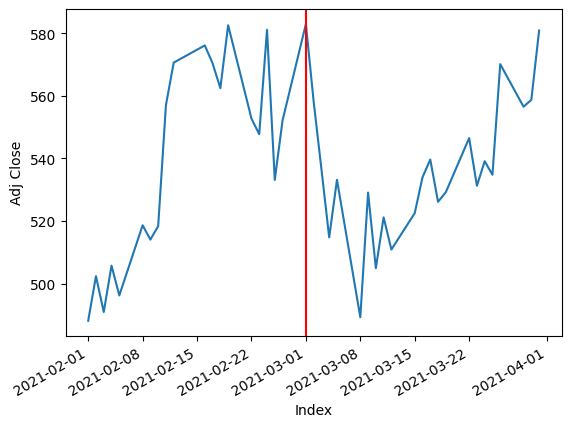

---------------------------------------------------------------------------
For LVS The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


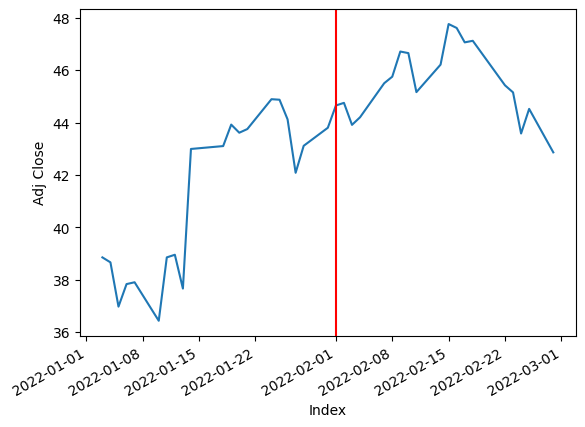

---------------------------------------------------------------------------
For LDOS The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


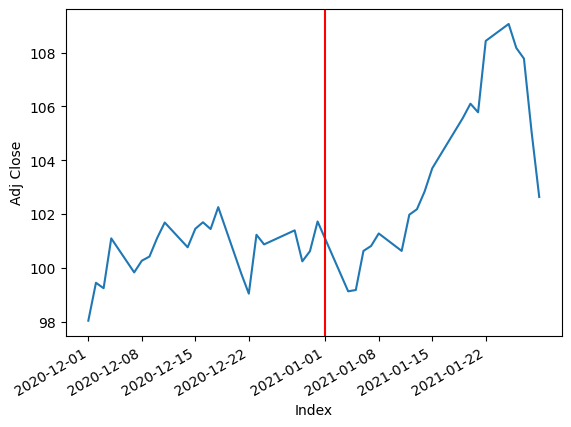

---------------------------------------------------------------------------
For LEN The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


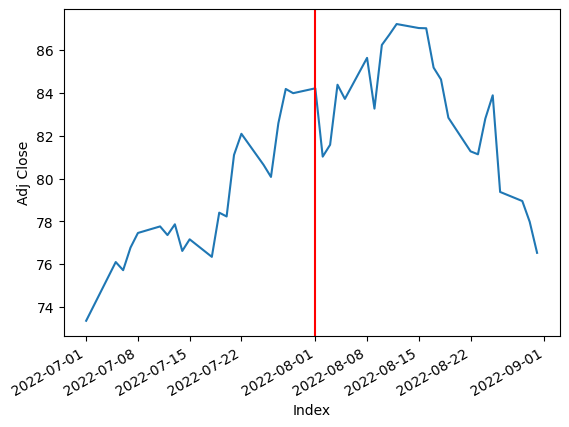

---------------------------------------------------------------------------
For LNC The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


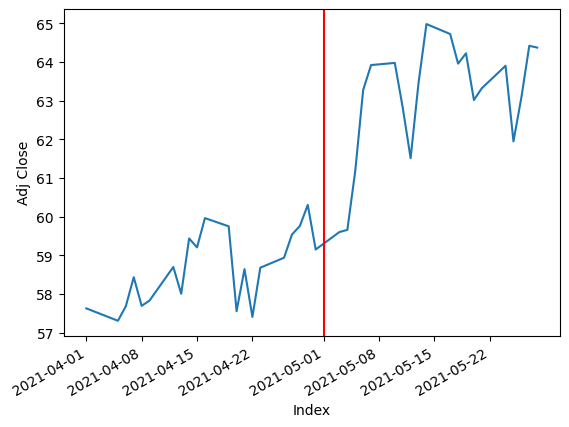

---------------------------------------------------------------------------
For LKQ The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


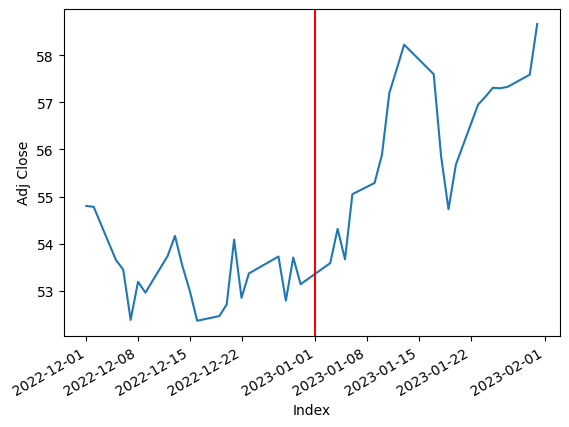

---------------------------------------------------------------------------
For LMT The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


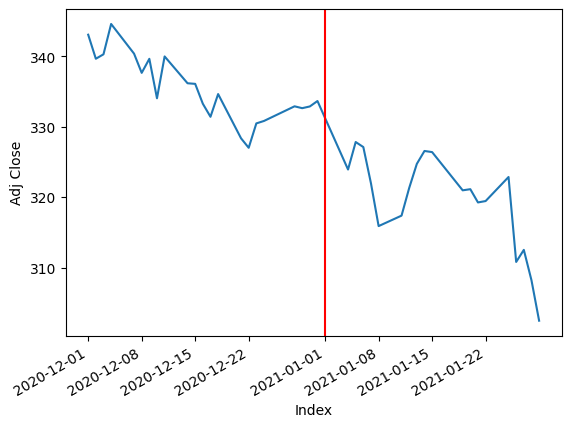

---------------------------------------------------------------------------
For L The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


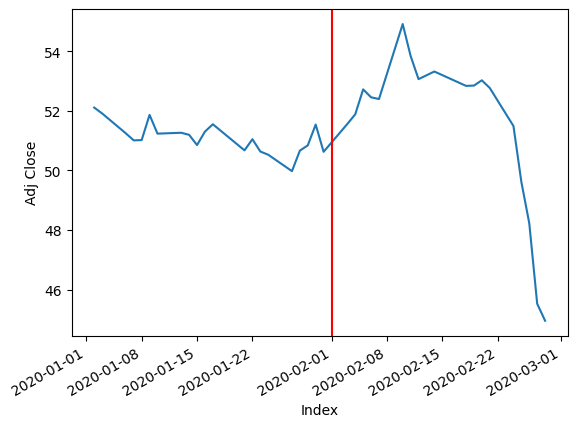

---------------------------------------------------------------------------
For LOW The index when the drop is the largest 2020-03-01 00:00:00
2020-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


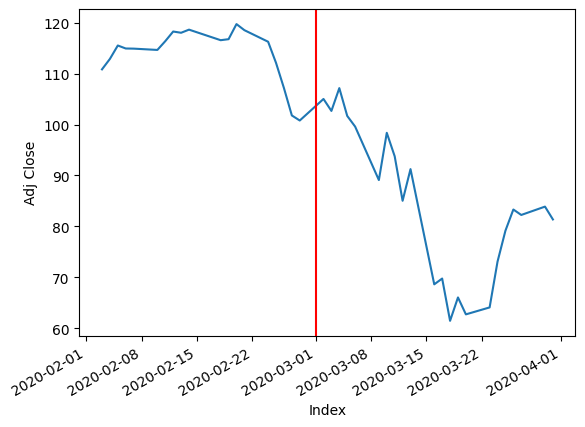

---------------------------------------------------------------------------
For LYB The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


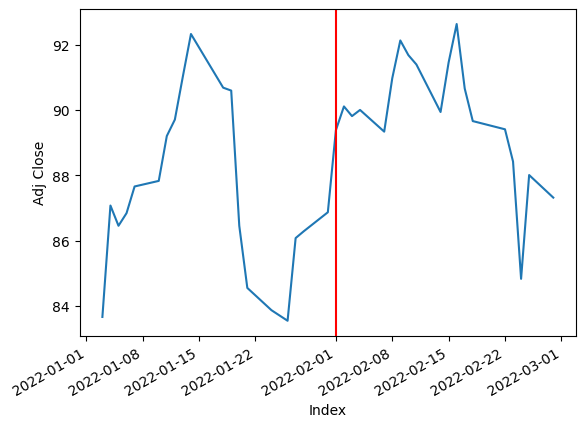

---------------------------------------------------------------------------
For MTB The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


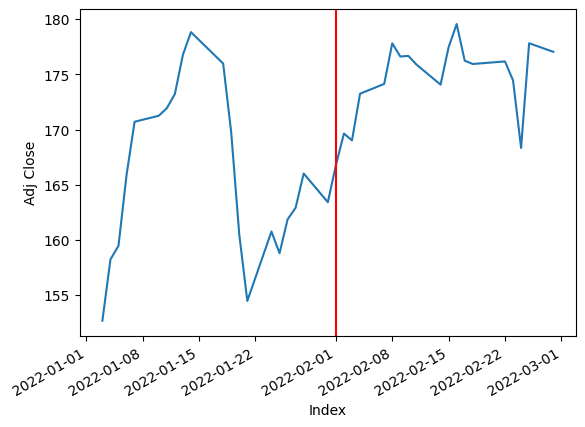

---------------------------------------------------------------------------
For MRO The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


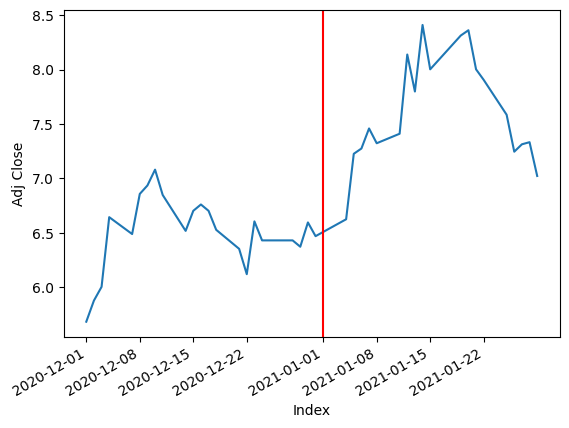

---------------------------------------------------------------------------
For MPC The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


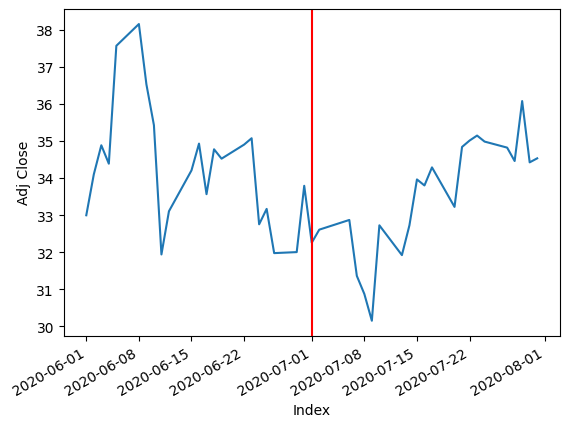

---------------------------------------------------------------------------
For MAR The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


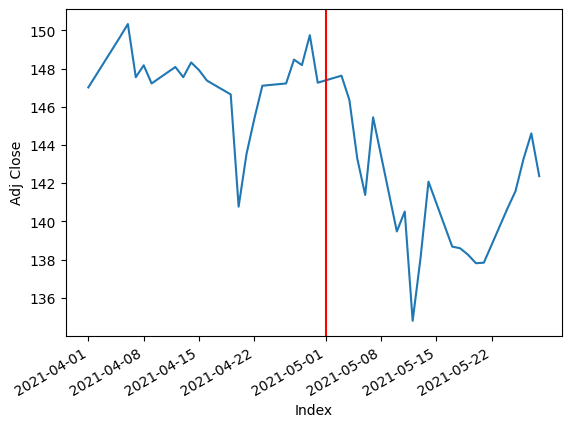

---------------------------------------------------------------------------
For MMC The index when the drop is the largest 2018-10-01 00:00:00
2018-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


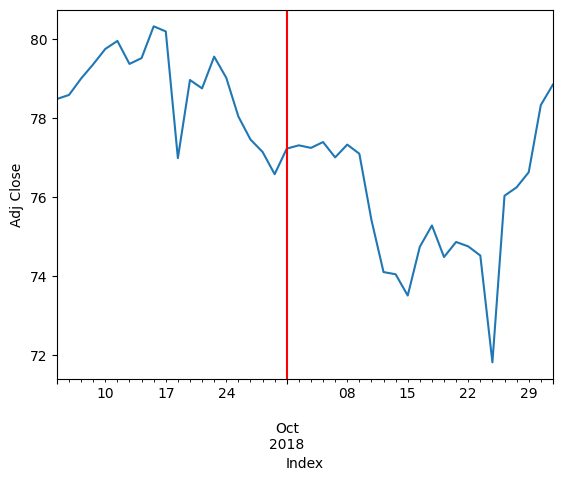

---------------------------------------------------------------------------
For MLM The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


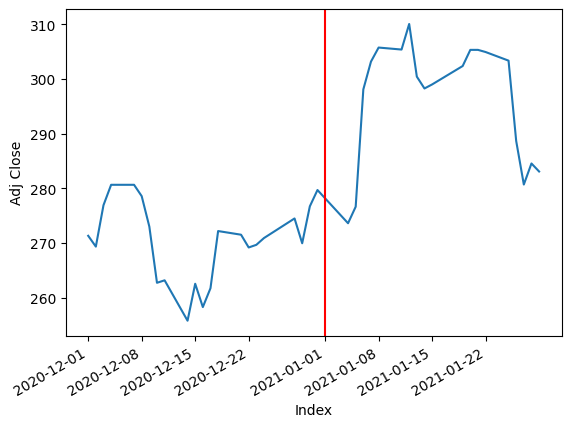

---------------------------------------------------------------------------
For MAS The index when the drop is the largest 2015-02-01 00:00:00
2015-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


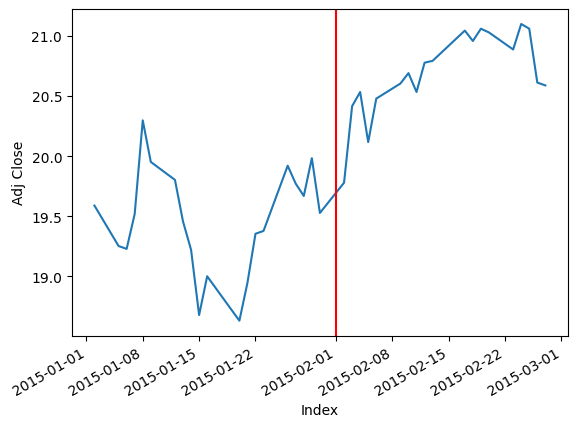

---------------------------------------------------------------------------
For MA The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


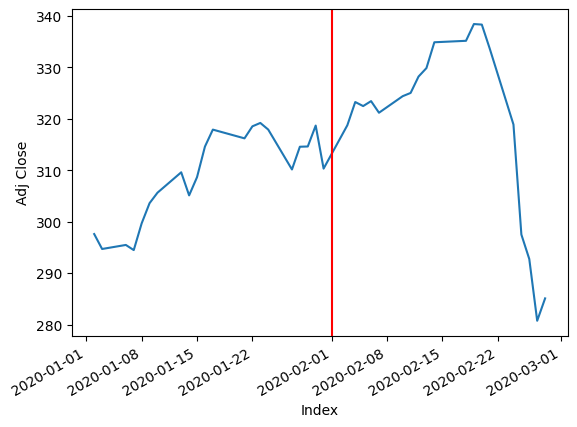

---------------------------------------------------------------------------
For MKC The index when the drop is the largest 2017-01-01 00:00:00
2017-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


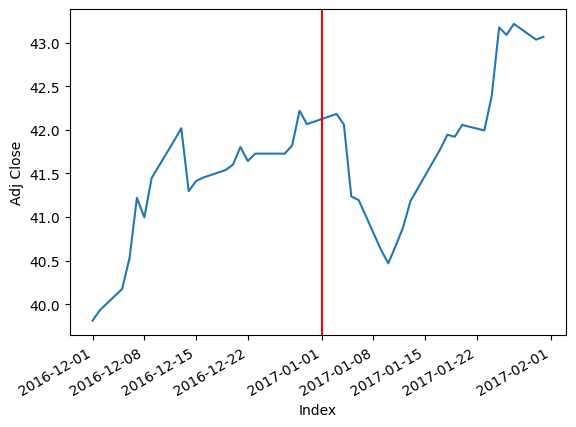

---------------------------------------------------------------------------
For MCD The index when the drop is the largest 2020-08-01 00:00:00
2020-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


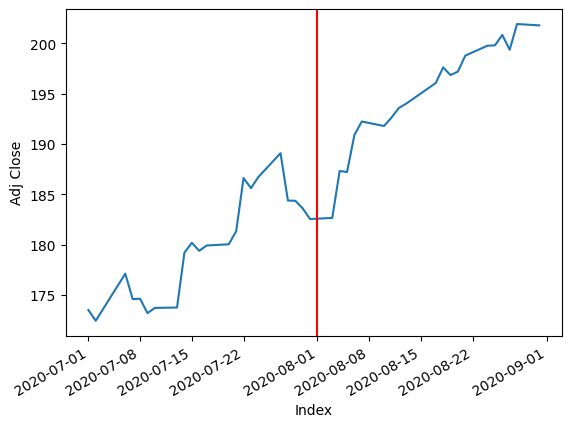

---------------------------------------------------------------------------
For MCK The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


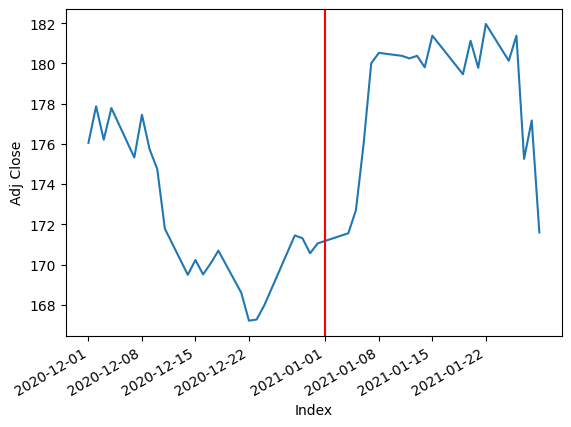

---------------------------------------------------------------------------
For MDT The index when the drop is the largest 2020-08-01 00:00:00
2020-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


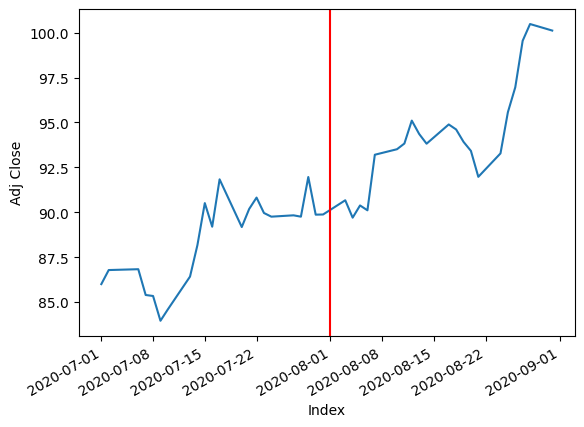

---------------------------------------------------------------------------
For MRK The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


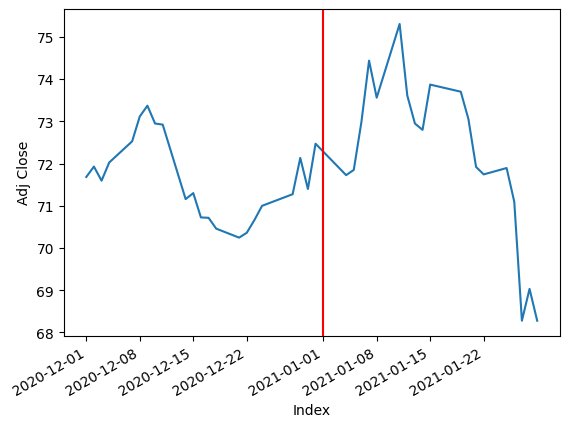

---------------------------------------------------------------------------
For META The index when the drop is the largest 2022-06-01 00:00:00
2022-06-01 00:00:00
[*********************100%***********************]  1 of 1 completed


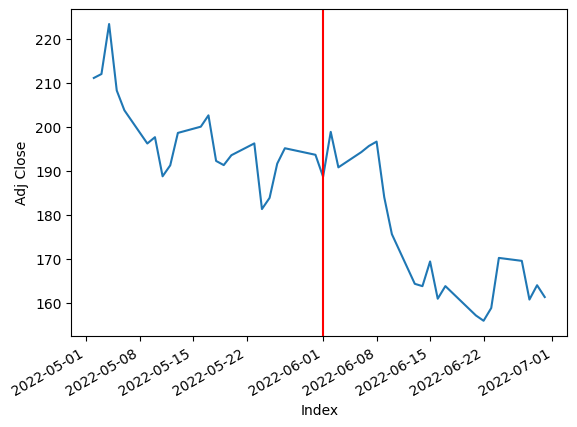

---------------------------------------------------------------------------
For MET The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


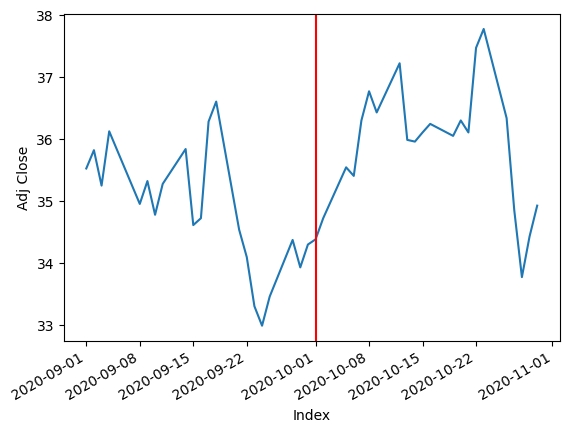

---------------------------------------------------------------------------
For MTD The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


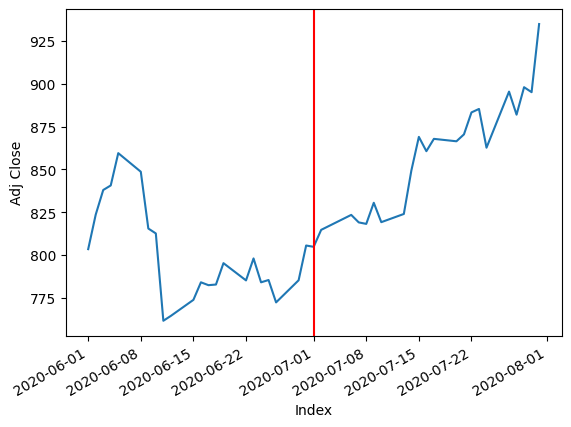

---------------------------------------------------------------------------
For MGM The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


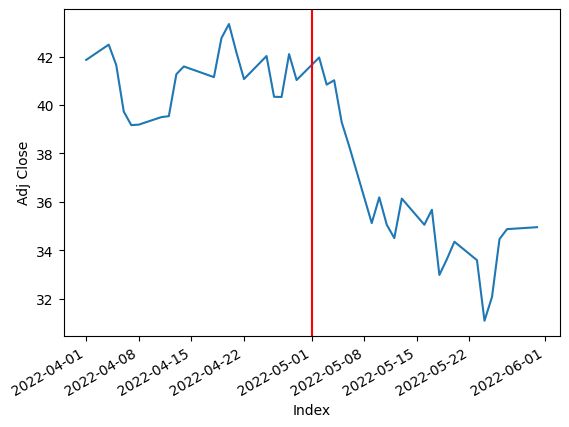

---------------------------------------------------------------------------
For MCHP The index when the drop is the largest 2017-04-01 00:00:00
2017-04-01 00:00:00
[*********************100%***********************]  1 of 1 completed


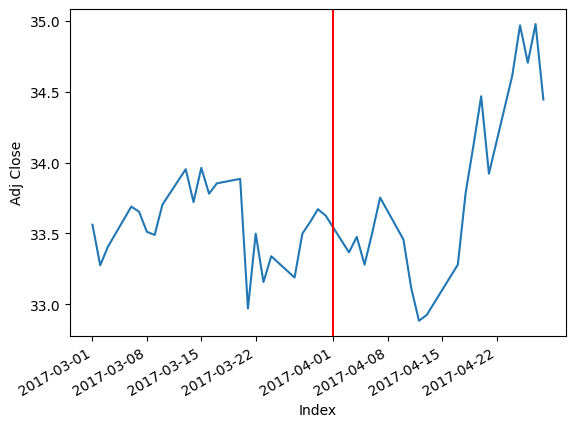

---------------------------------------------------------------------------
For MU The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


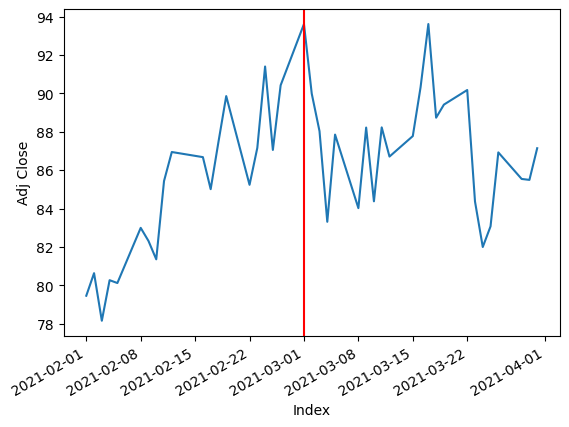

---------------------------------------------------------------------------
For MSFT The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


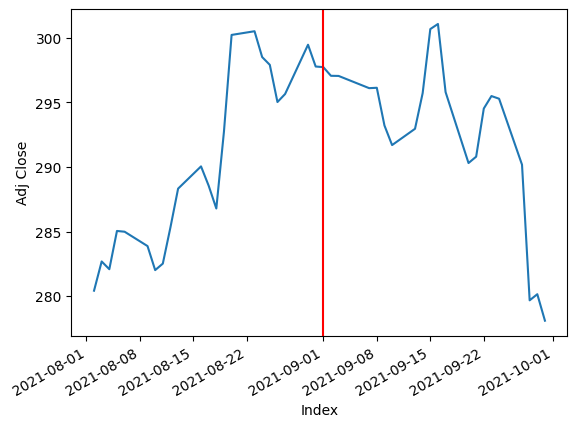

---------------------------------------------------------------------------
For MAA The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


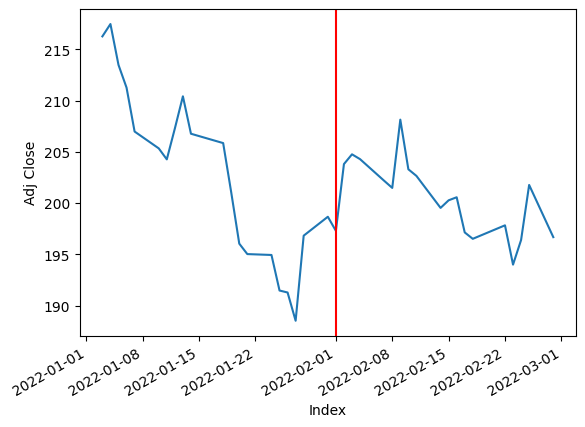

---------------------------------------------------------------------------
For MHK The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


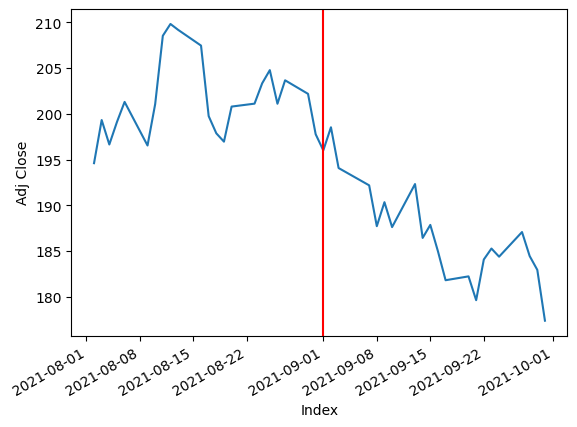

---------------------------------------------------------------------------
For TAP The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


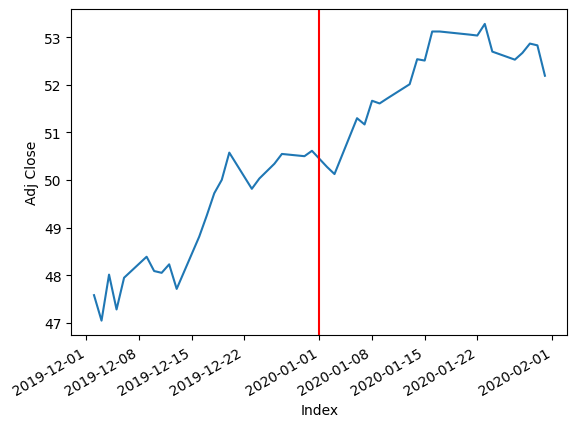

---------------------------------------------------------------------------
For MDLZ The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


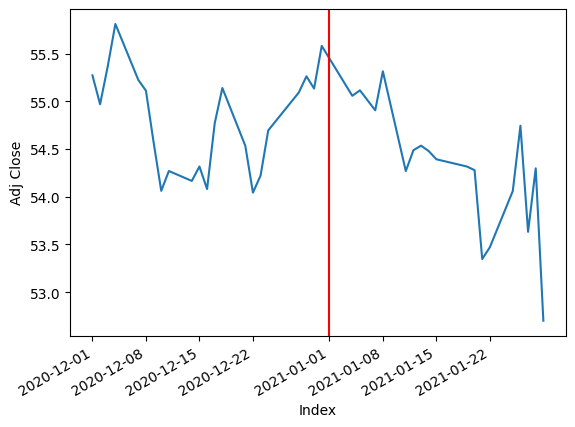

---------------------------------------------------------------------------
For MNST The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


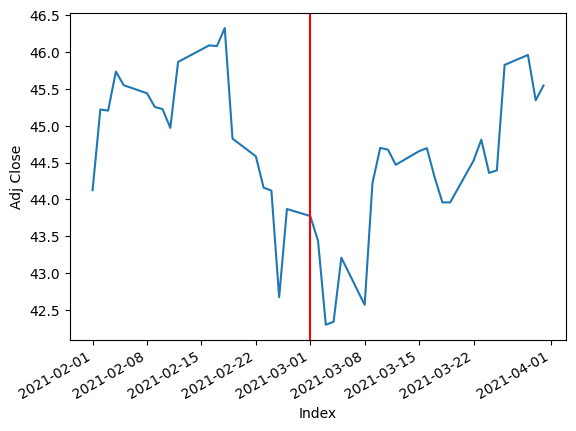

---------------------------------------------------------------------------
For MCO The index when the drop is the largest 2017-05-01 00:00:00
2017-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


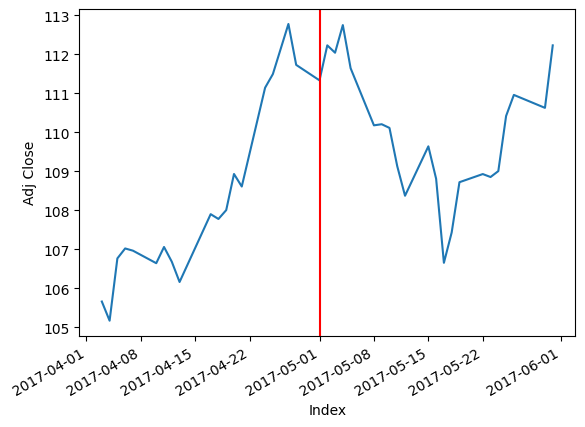

---------------------------------------------------------------------------
For MS The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


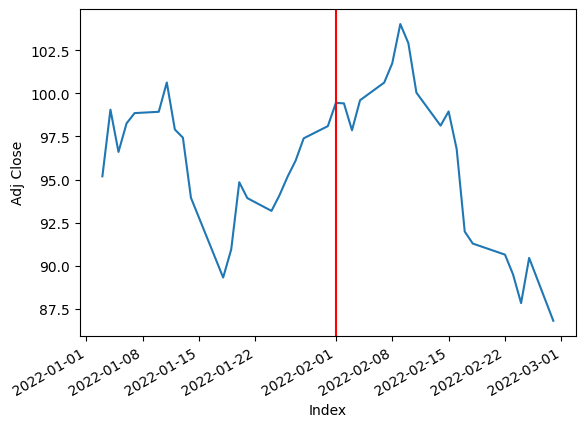

---------------------------------------------------------------------------
For MOS The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


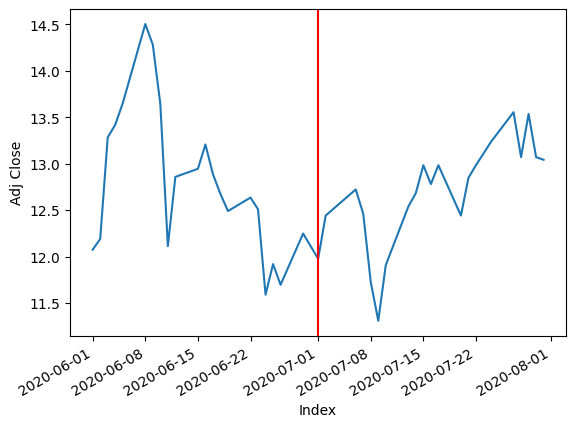

---------------------------------------------------------------------------
For MSI The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


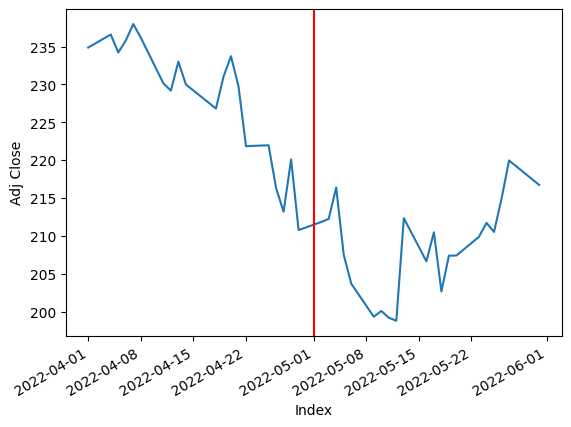

---------------------------------------------------------------------------
For MSCI The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


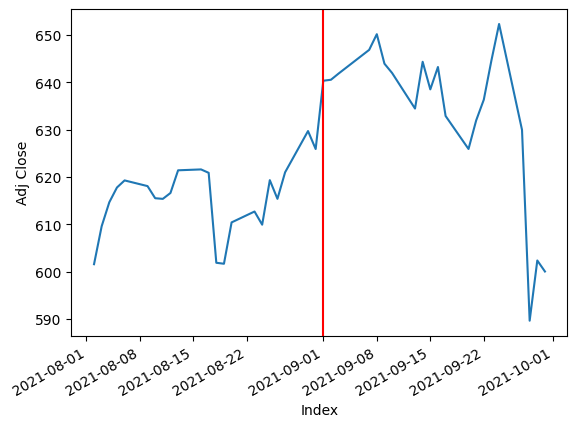

---------------------------------------------------------------------------
For NDAQ The index when the drop is the largest 2019-04-01 00:00:00
2019-04-01 00:00:00
[*********************100%***********************]  1 of 1 completed


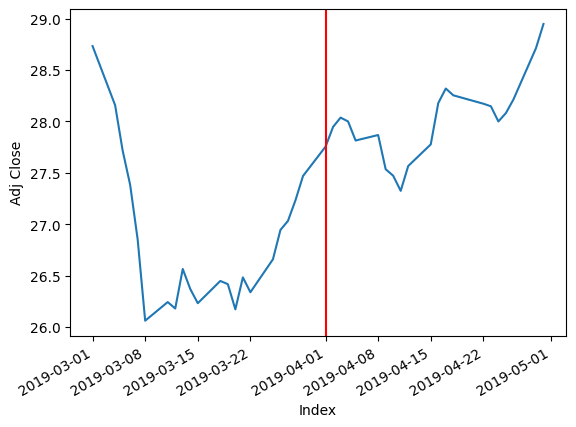

---------------------------------------------------------------------------
For NTAP The index when the drop is the largest 2021-02-01 00:00:00
2021-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


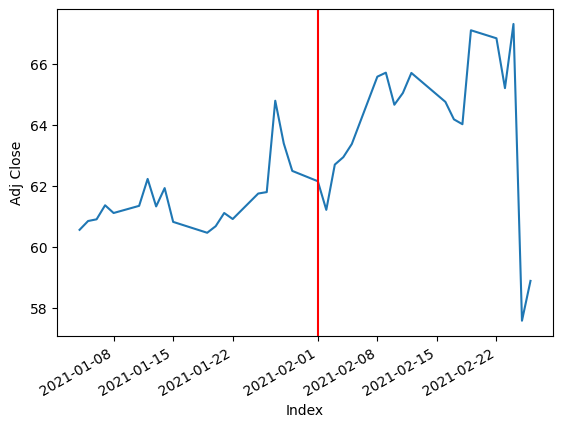

---------------------------------------------------------------------------
For NFLX The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


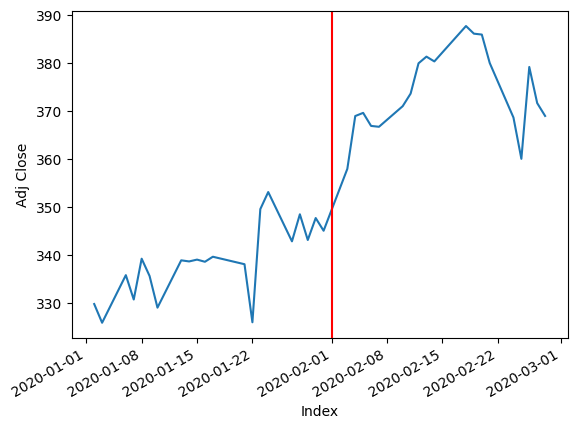

---------------------------------------------------------------------------
For NWL The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


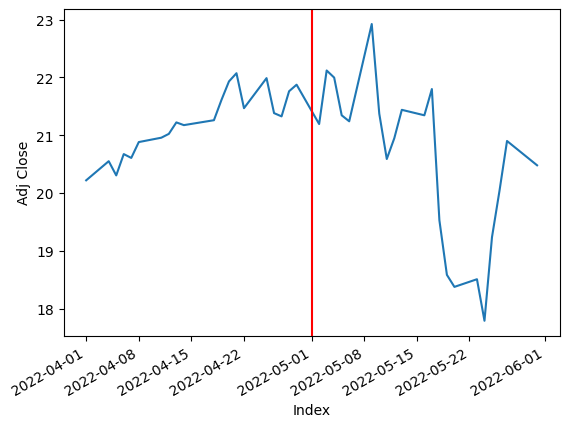

---------------------------------------------------------------------------
For NEM The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


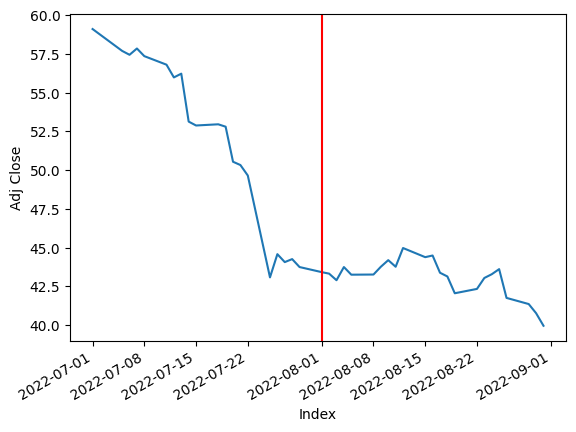

---------------------------------------------------------------------------
For NWSA The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


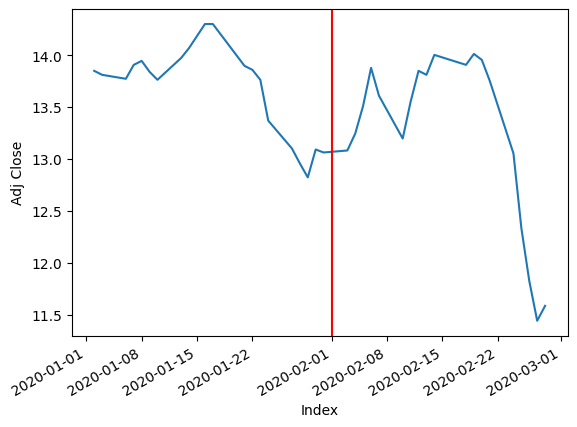

---------------------------------------------------------------------------
For NEE The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


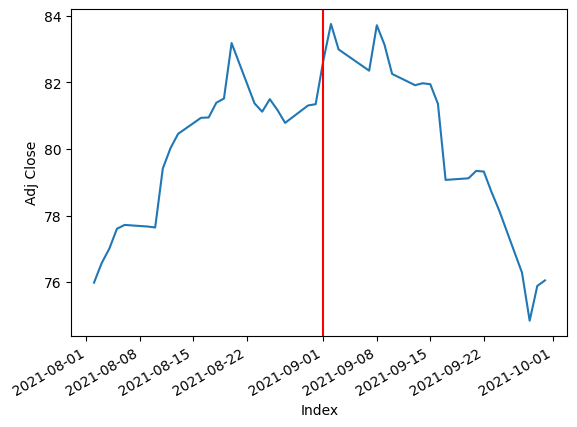

---------------------------------------------------------------------------
For NKE The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


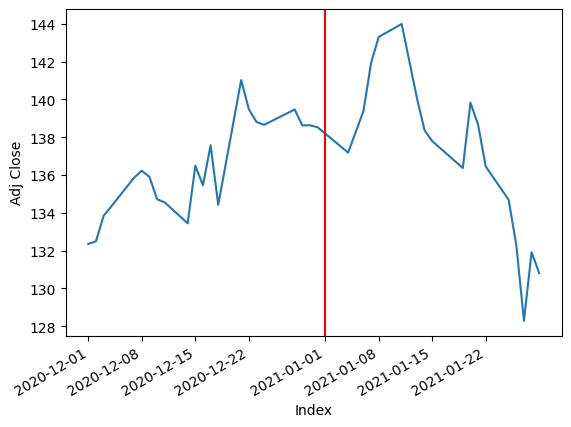

---------------------------------------------------------------------------
For NI The index when the drop is the largest 2018-09-01 00:00:00
2018-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


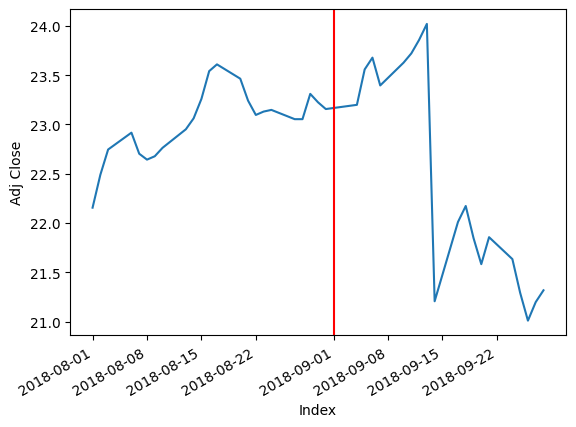

---------------------------------------------------------------------------
For NDSN The index when the drop is the largest 2019-05-01 00:00:00
2019-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


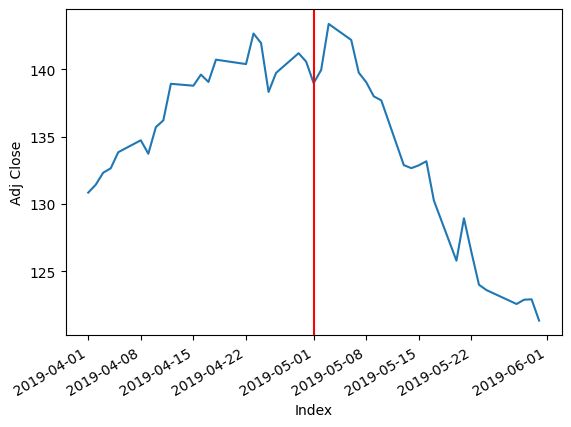

---------------------------------------------------------------------------
For NSC The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


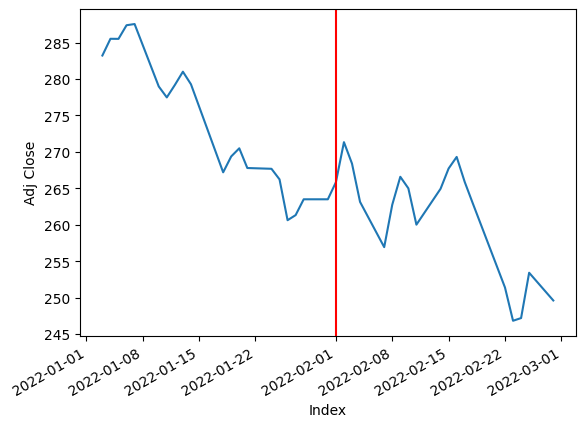

---------------------------------------------------------------------------
For NTRS The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


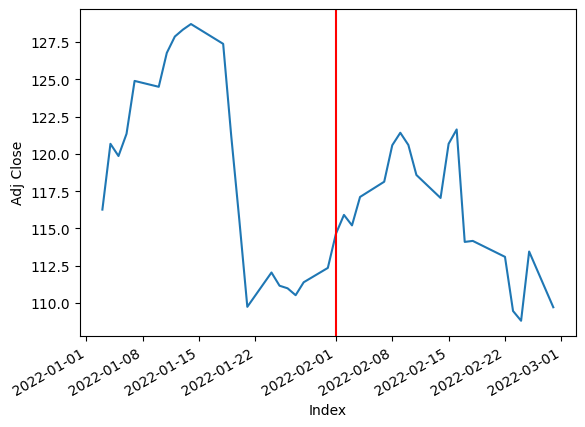

---------------------------------------------------------------------------
For NOC The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


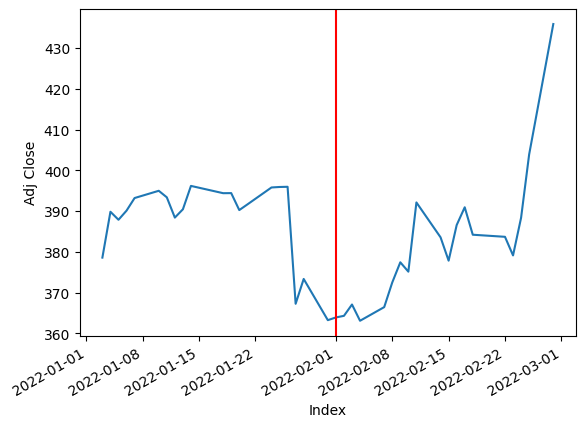

---------------------------------------------------------------------------
For NCLH The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


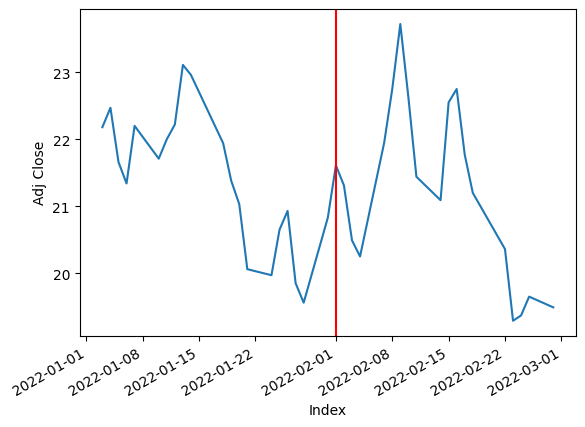

---------------------------------------------------------------------------
For NRG The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


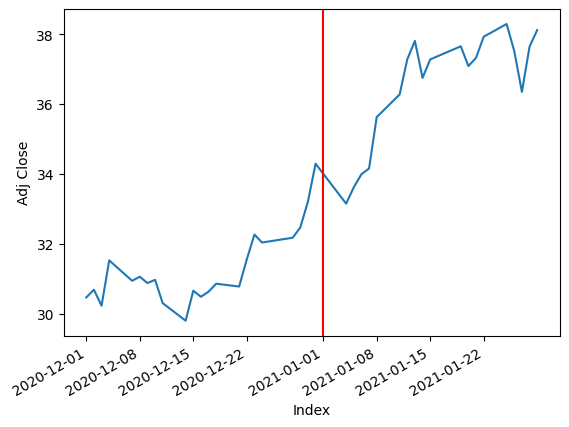

---------------------------------------------------------------------------
For NUE The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


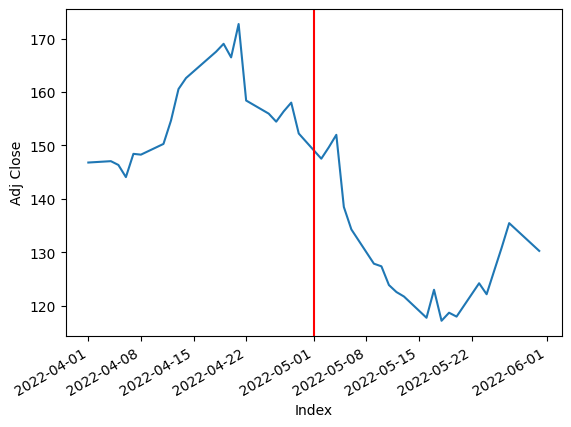

---------------------------------------------------------------------------
For NVDA The index when the drop is the largest 2020-03-01 00:00:00
2020-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


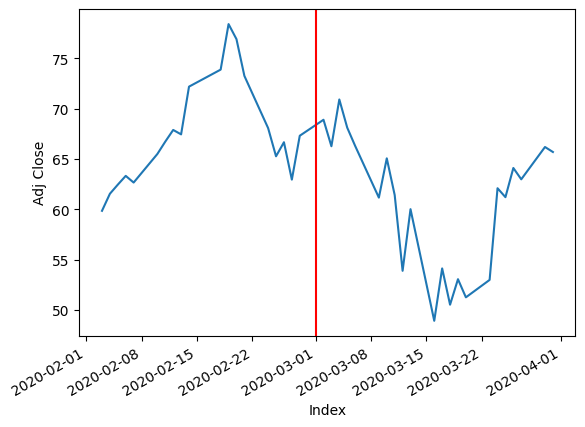

---------------------------------------------------------------------------
For NVR The index when the drop is the largest 2019-12-01 00:00:00
2019-12-01 00:00:00
[*********************100%***********************]  1 of 1 completed


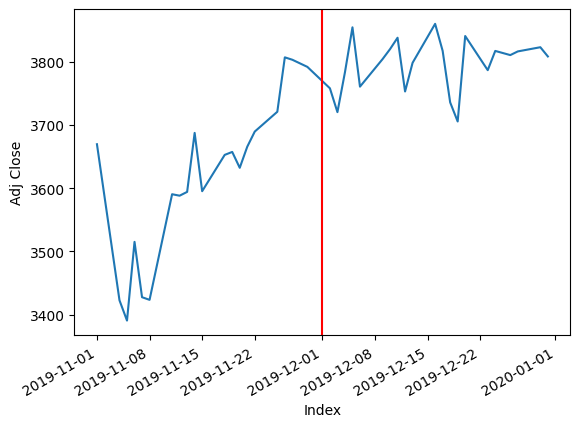

---------------------------------------------------------------------------
For NXPI The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


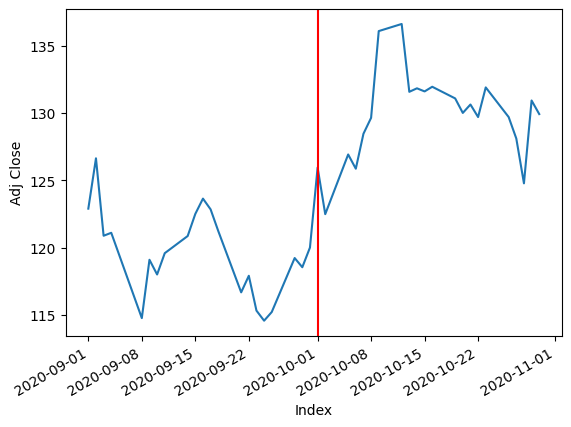

---------------------------------------------------------------------------
For ORLY The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


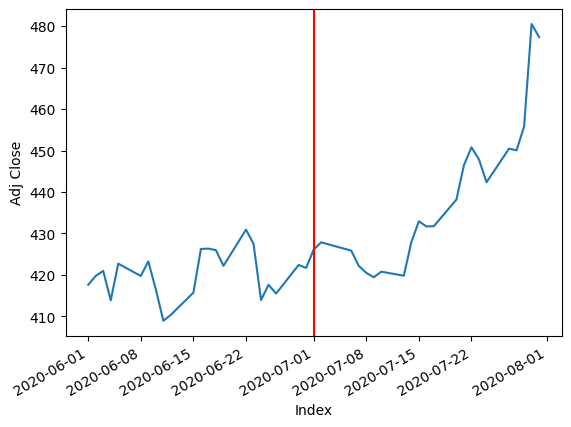

---------------------------------------------------------------------------
For OXY The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


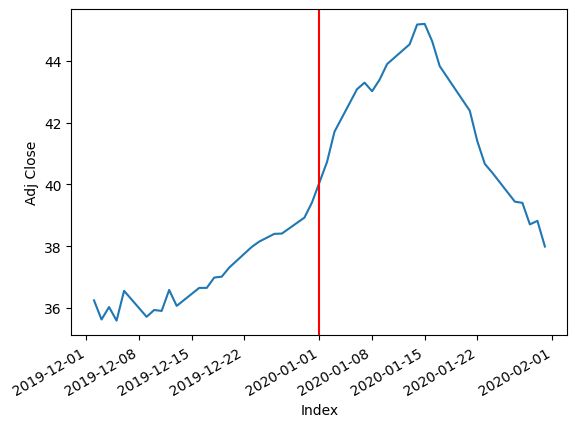

---------------------------------------------------------------------------
For OMC The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


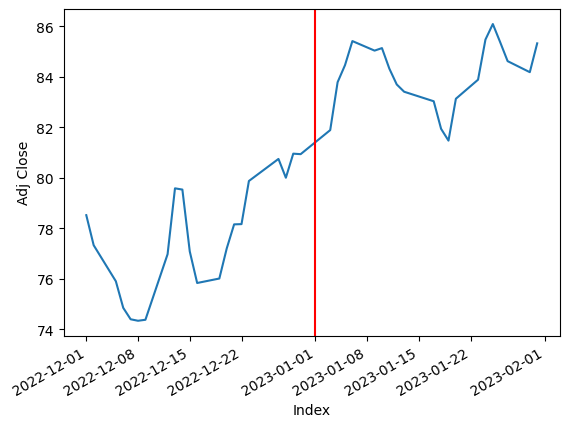

---------------------------------------------------------------------------
For ON The index when the drop is the largest 2017-01-01 00:00:00
2017-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


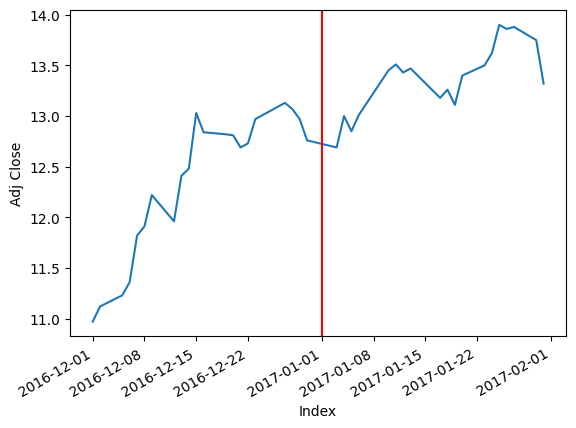

---------------------------------------------------------------------------
For OKE The index when the drop is the largest 2019-09-01 00:00:00
2019-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


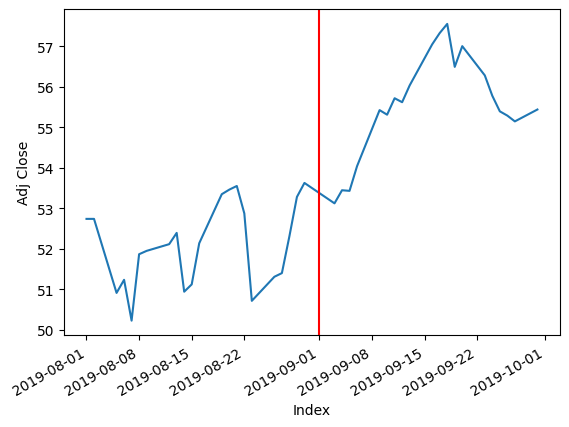

---------------------------------------------------------------------------
For ORCL The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


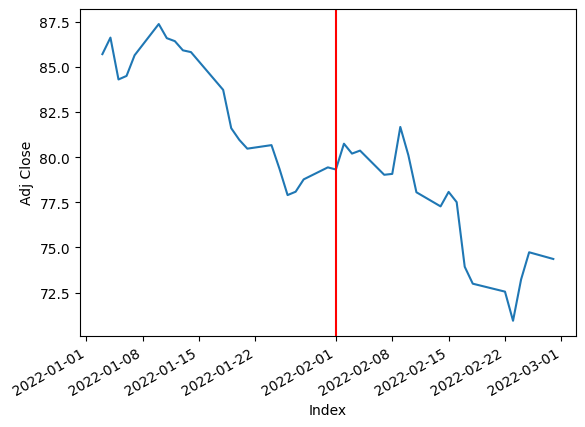

---------------------------------------------------------------------------
For PCAR The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


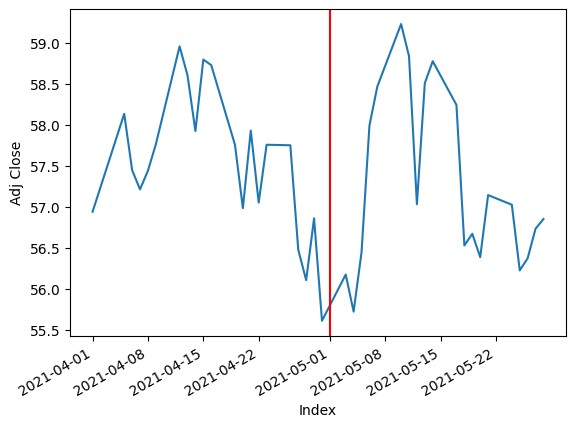

---------------------------------------------------------------------------
For PKG The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


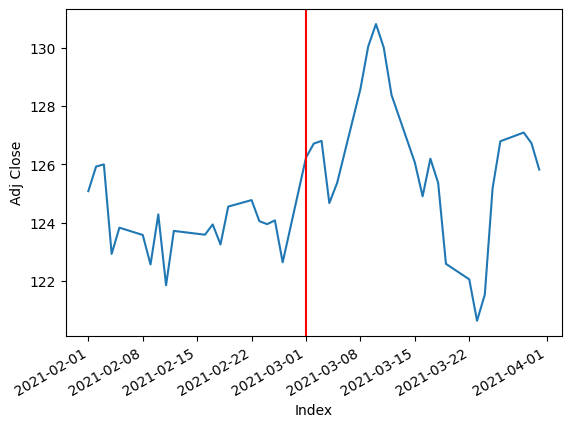

---------------------------------------------------------------------------
For PH The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


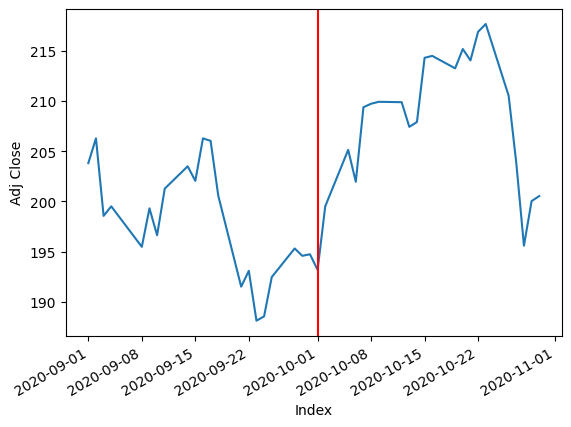

---------------------------------------------------------------------------
For PAYX The index when the drop is the largest 2019-11-01 00:00:00
2019-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


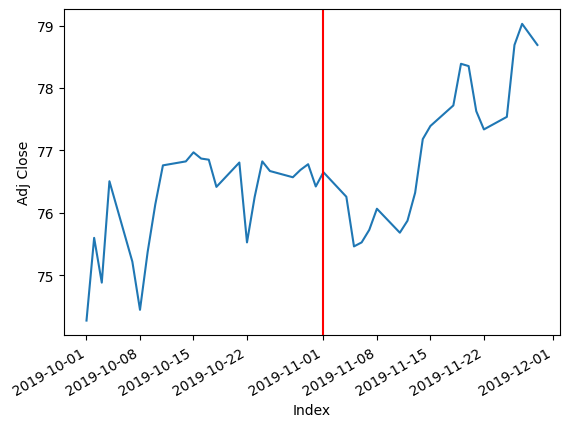

---------------------------------------------------------------------------
For PYPL The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


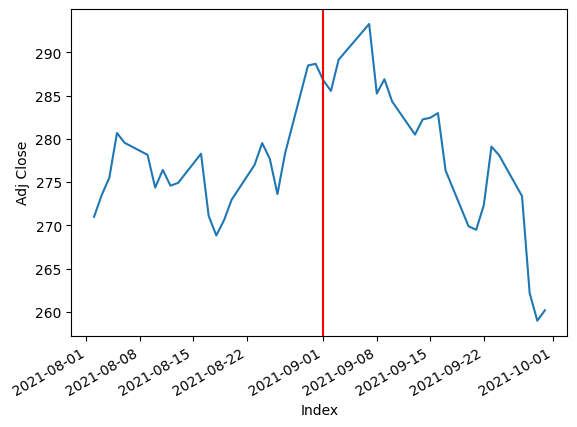

---------------------------------------------------------------------------
For PNR The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


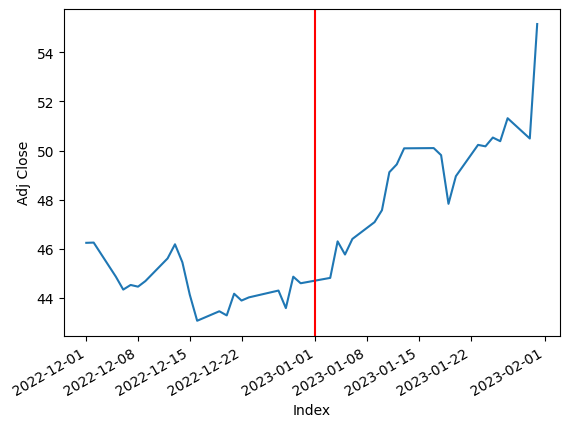

---------------------------------------------------------------------------
For PEP The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


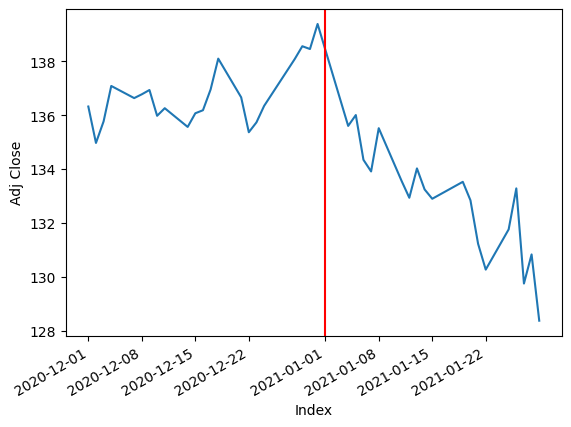

---------------------------------------------------------------------------
For PKI The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


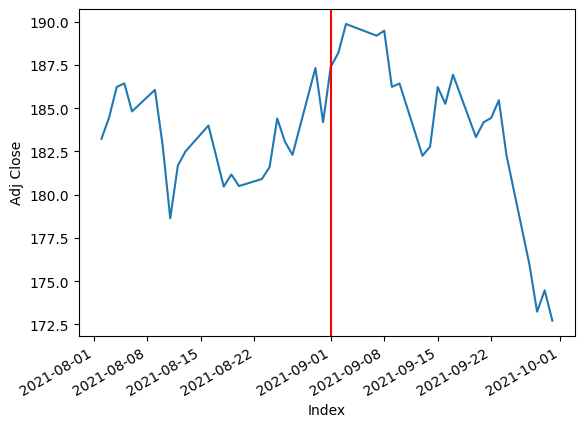

---------------------------------------------------------------------------
For PFE The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


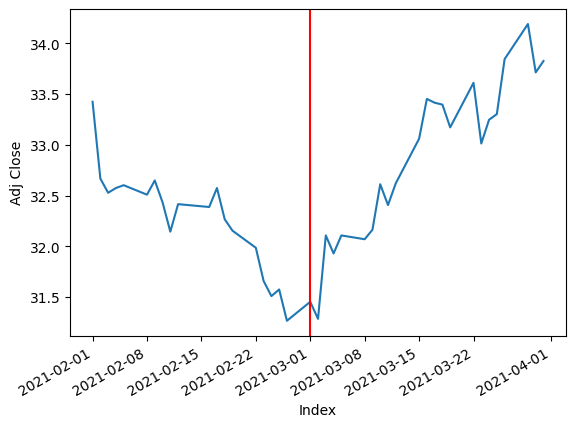

---------------------------------------------------------------------------
For PCG The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


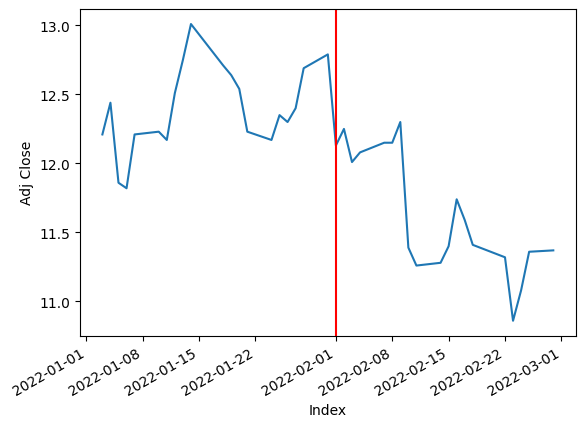

---------------------------------------------------------------------------
For PM The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


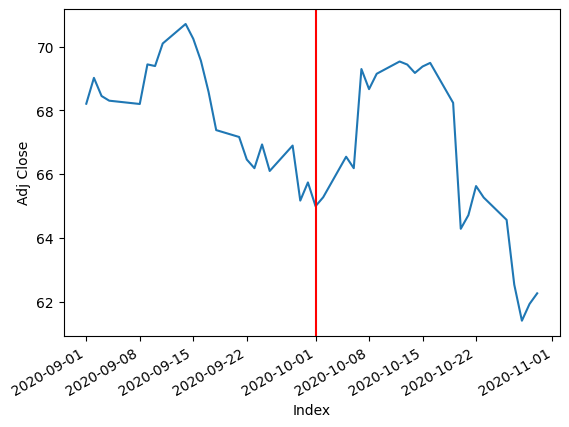

---------------------------------------------------------------------------
For PSX The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


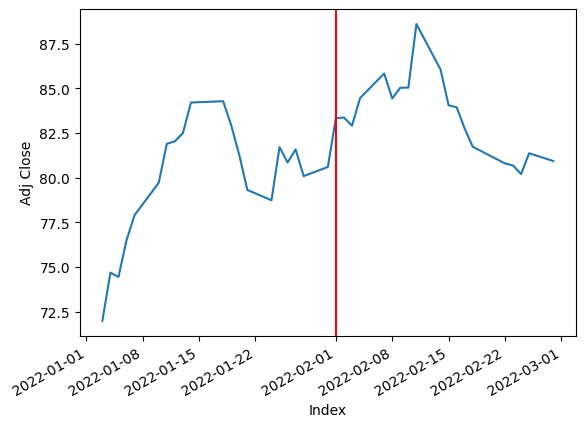

---------------------------------------------------------------------------
For PNW The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


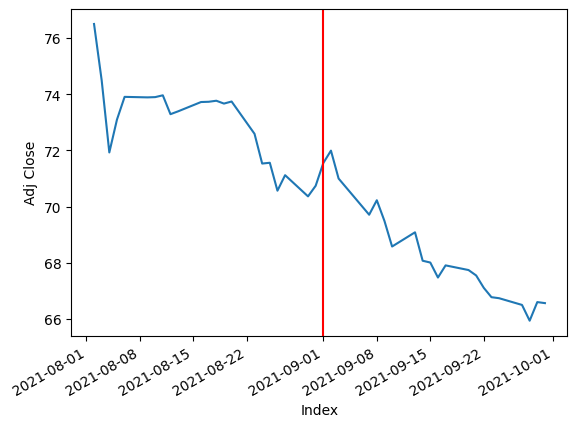

---------------------------------------------------------------------------
For PXD The index when the drop is the largest 2015-01-01 00:00:00
2015-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


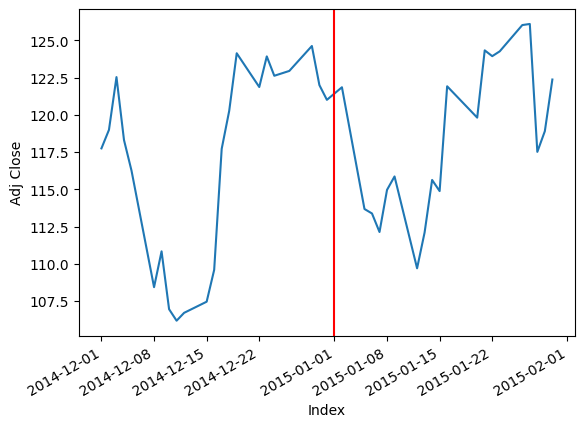

---------------------------------------------------------------------------
For PNC The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


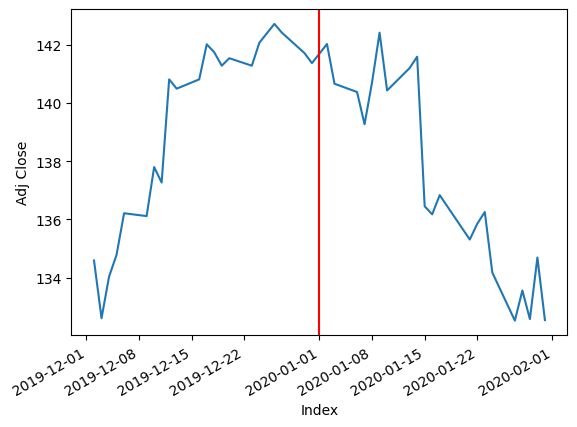

---------------------------------------------------------------------------
For PPG The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


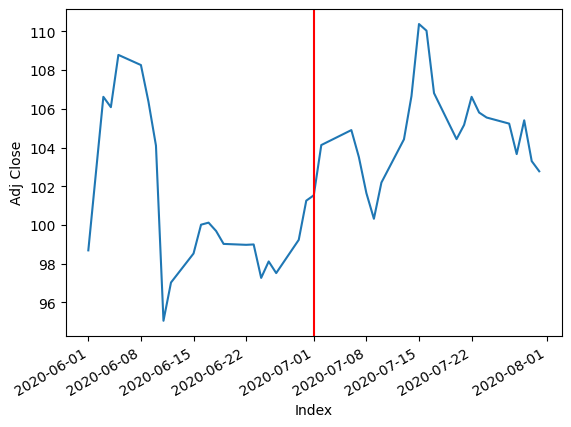

---------------------------------------------------------------------------
For PPL The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


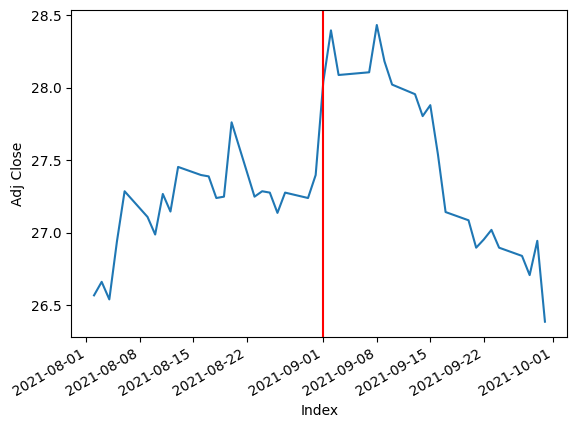

---------------------------------------------------------------------------
For PFG The index when the drop is the largest 2015-12-01 00:00:00
2015-12-01 00:00:00
[*********************100%***********************]  1 of 1 completed


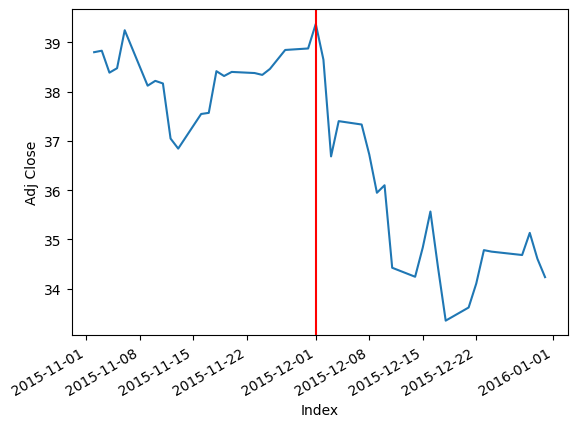

---------------------------------------------------------------------------
For PG The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


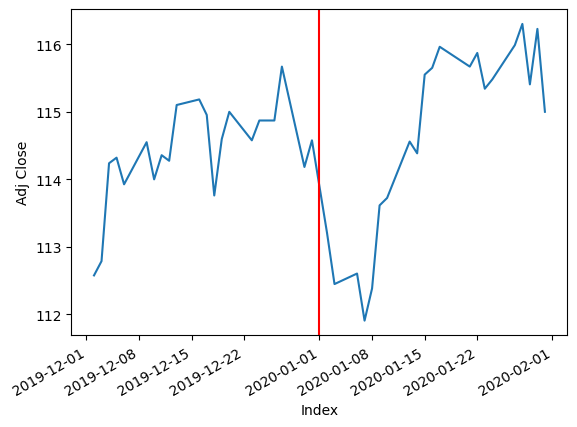

---------------------------------------------------------------------------
For PGR The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


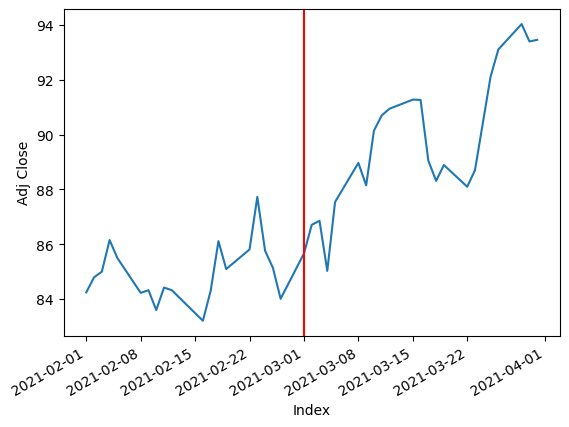

---------------------------------------------------------------------------
For PLD The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


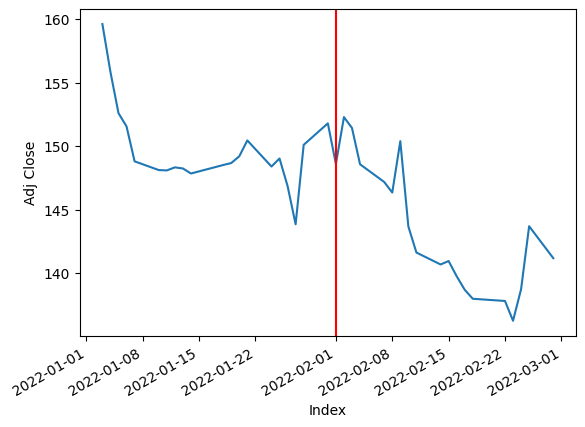

---------------------------------------------------------------------------
For PRU The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


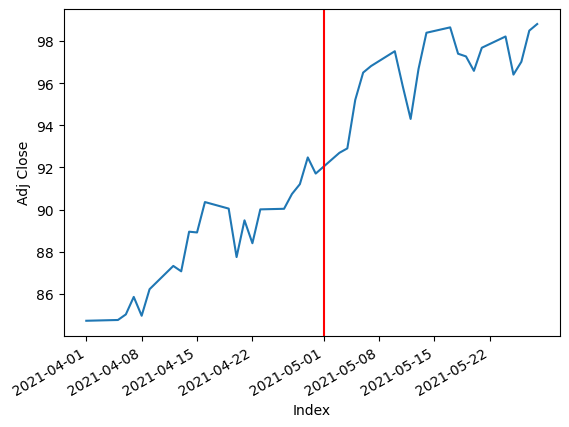

---------------------------------------------------------------------------
For PEG The index when the drop is the largest 2023-01-01 00:00:00
2023-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


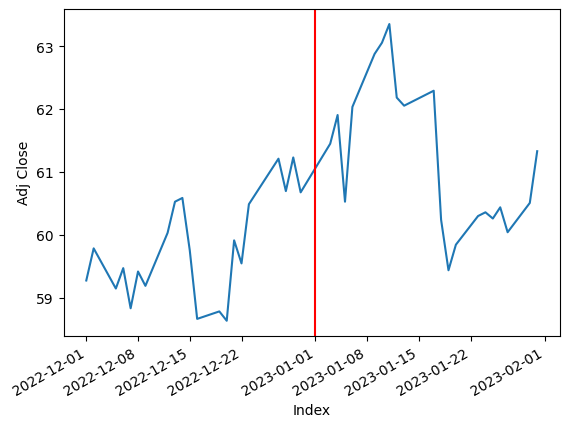

---------------------------------------------------------------------------
For PTC The index when the drop is the largest 2019-08-01 00:00:00
2019-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


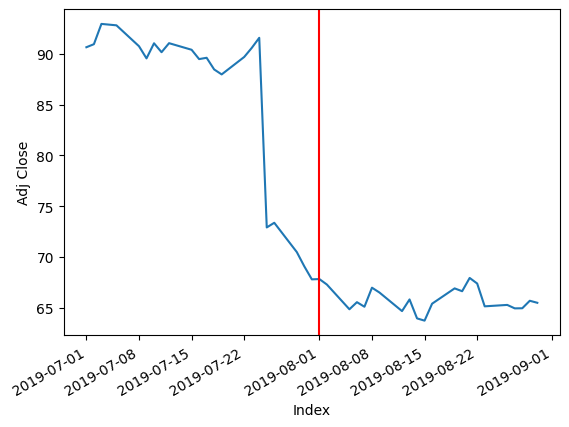

---------------------------------------------------------------------------
For PSA The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


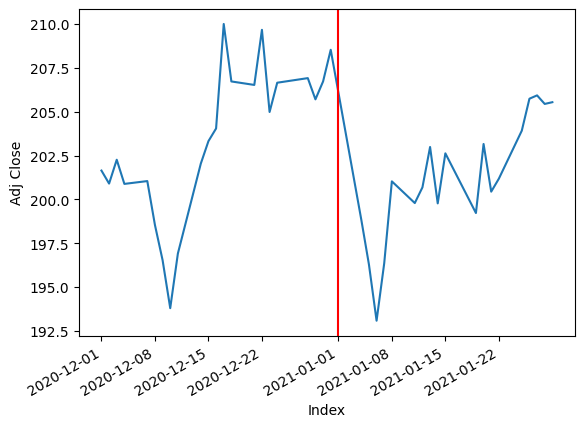

---------------------------------------------------------------------------
For PHM The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


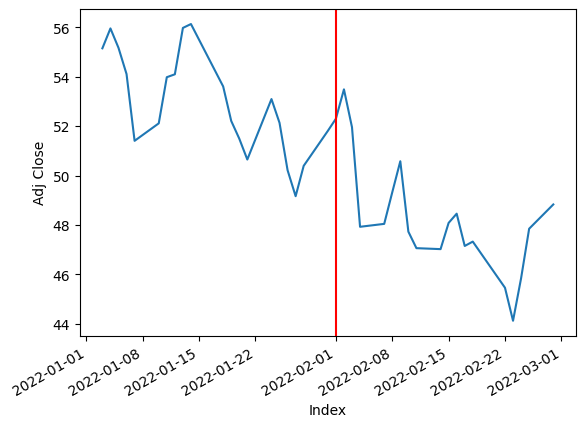

---------------------------------------------------------------------------
For QRVO The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


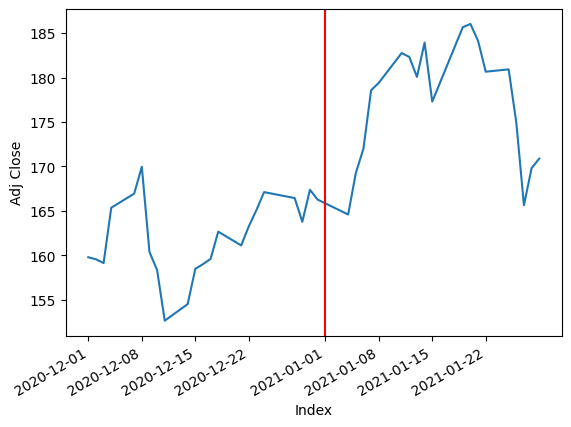

---------------------------------------------------------------------------
For PWR The index when the drop is the largest 2015-01-01 00:00:00
2015-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


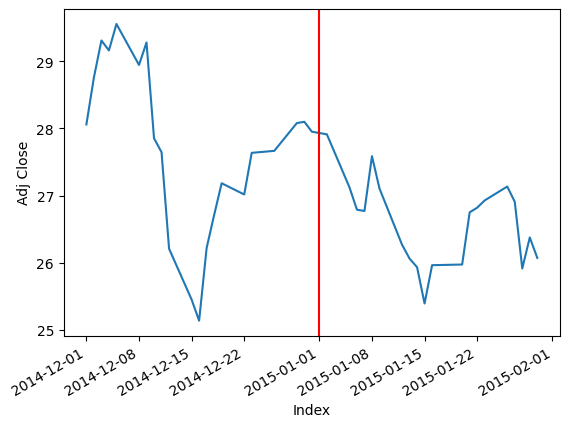

---------------------------------------------------------------------------
For QCOM The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


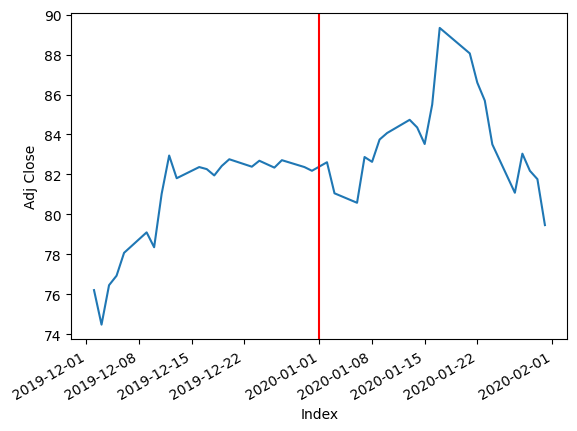

---------------------------------------------------------------------------
For DGX The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


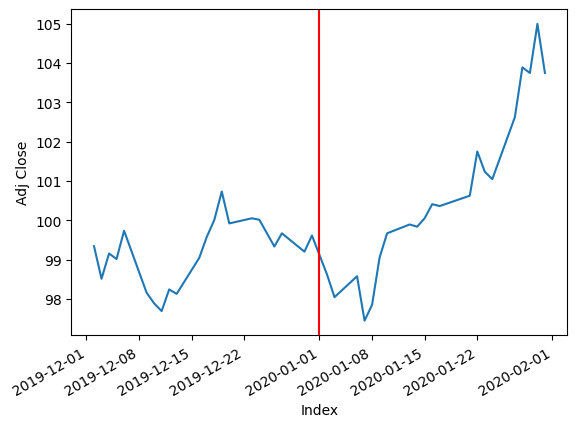

---------------------------------------------------------------------------
For RL The index when the drop is the largest 2016-11-01 00:00:00
2016-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


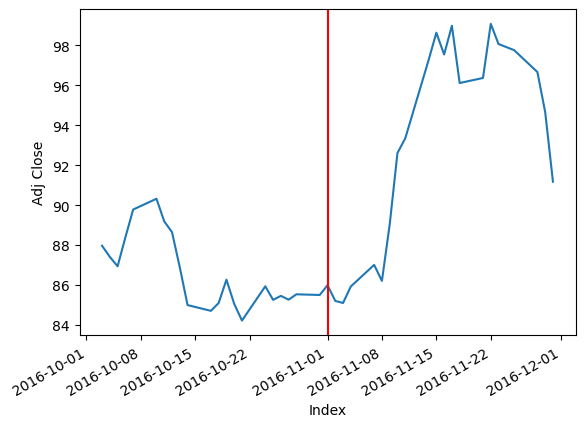

---------------------------------------------------------------------------
For RJF The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


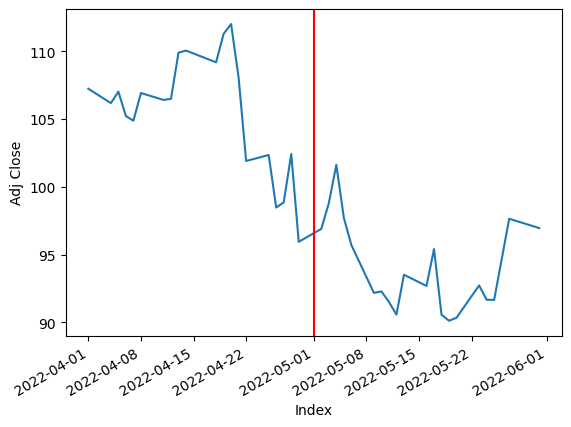

---------------------------------------------------------------------------
For RTX The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


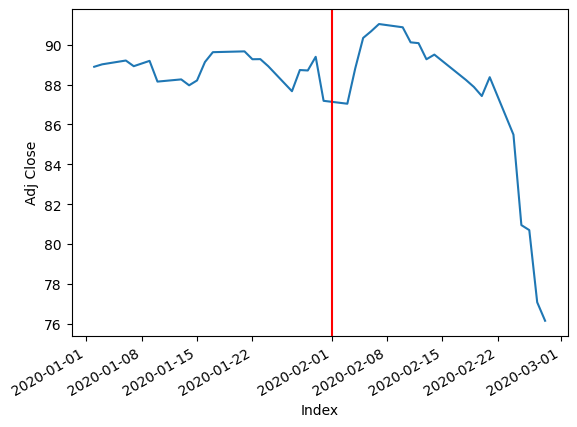

---------------------------------------------------------------------------
For O The index when the drop is the largest 2019-08-01 00:00:00
2019-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


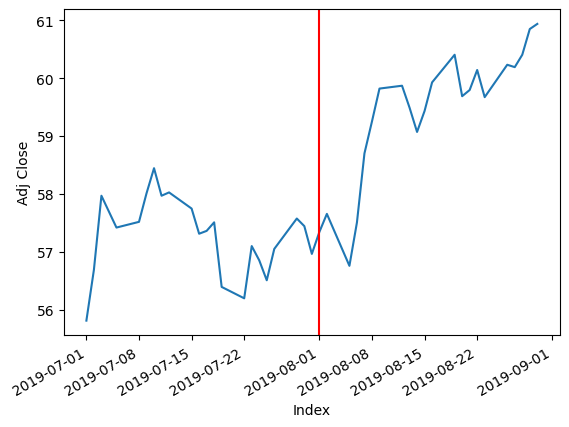

---------------------------------------------------------------------------
For REG The index when the drop is the largest 2019-11-01 00:00:00
2019-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


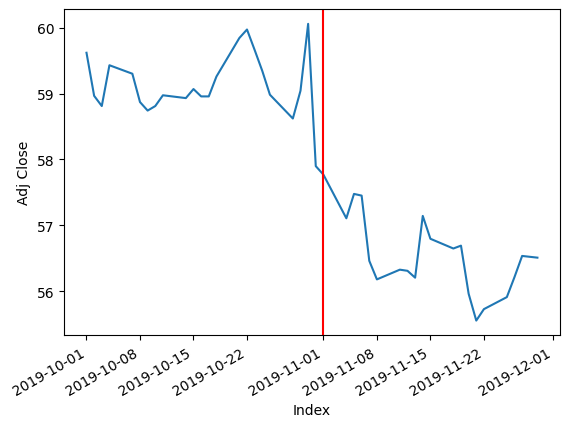

---------------------------------------------------------------------------
For REGN The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


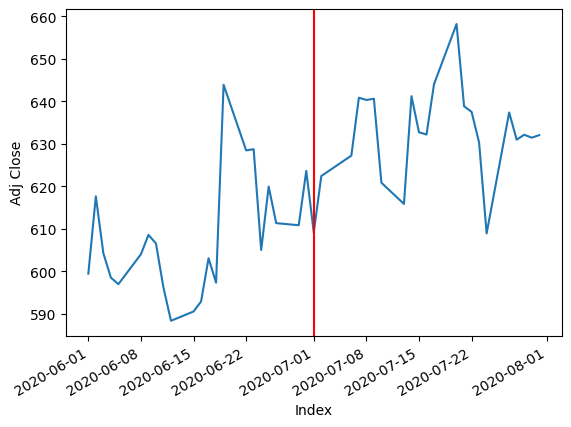

---------------------------------------------------------------------------
For RF The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


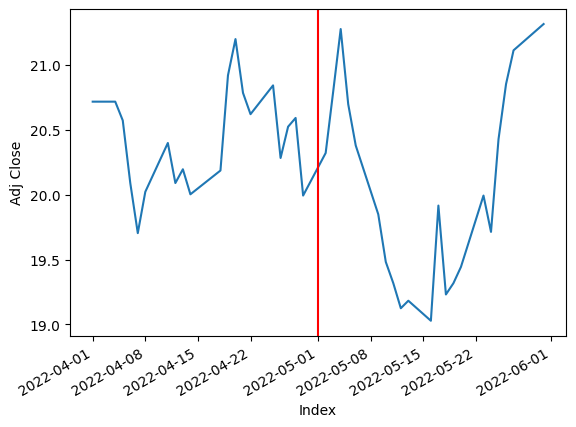

---------------------------------------------------------------------------
For RSG The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


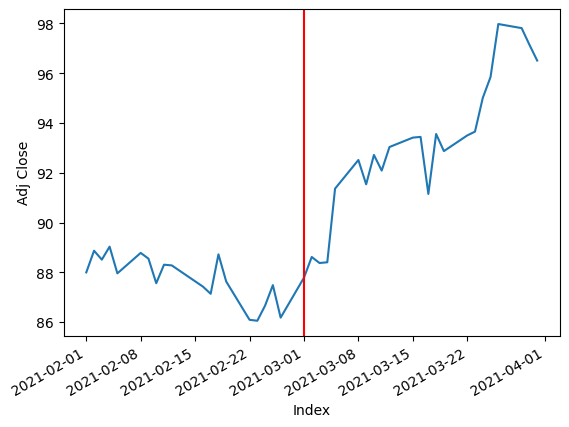

---------------------------------------------------------------------------
For RMD The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


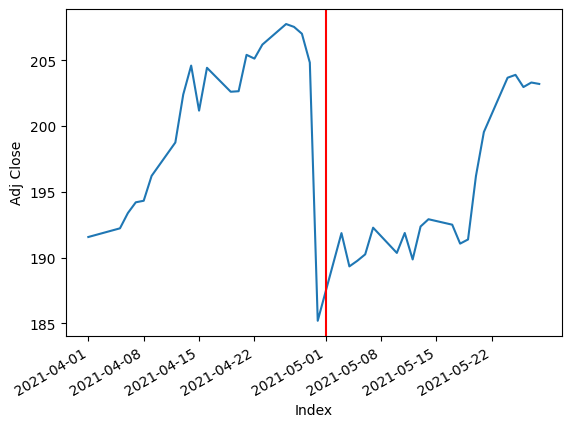

---------------------------------------------------------------------------
For RHI The index when the drop is the largest 2019-09-01 00:00:00
2019-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


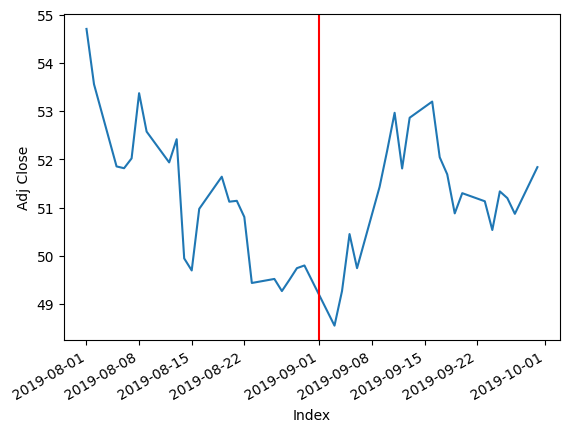

---------------------------------------------------------------------------
For ROK The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


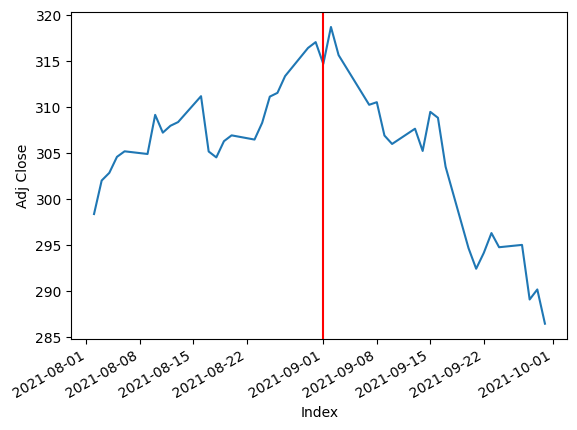

---------------------------------------------------------------------------
For ROL The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


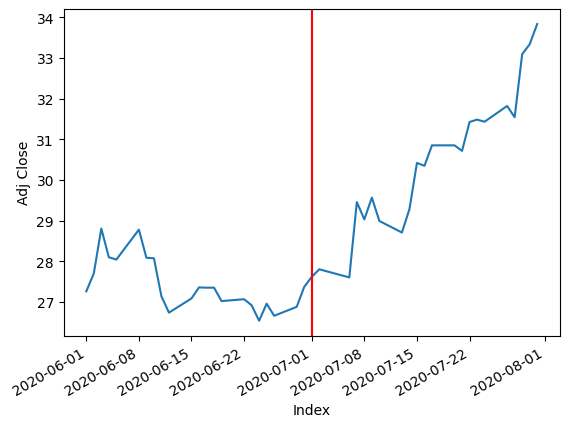

---------------------------------------------------------------------------
For ROP The index when the drop is the largest 2020-03-01 00:00:00
2020-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


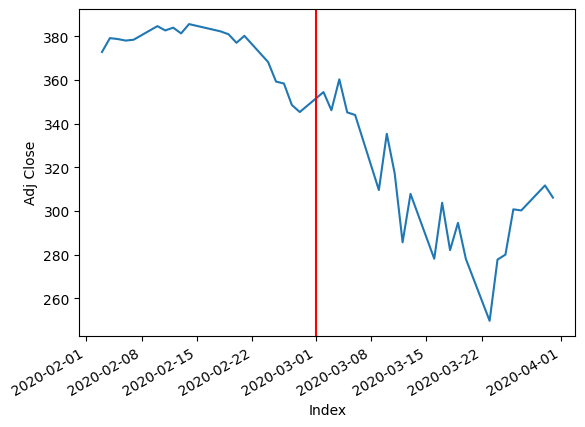

---------------------------------------------------------------------------
For ROST The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


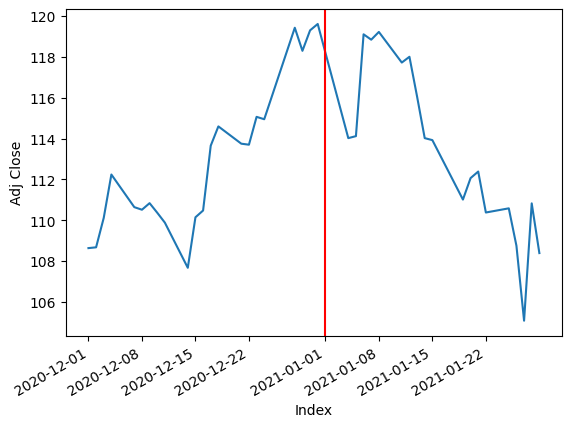

---------------------------------------------------------------------------
For RCL The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


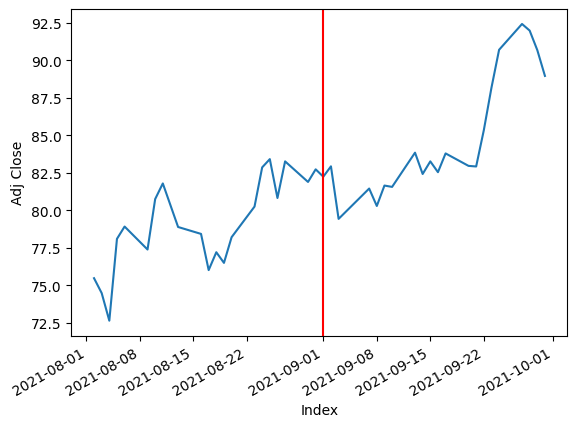

---------------------------------------------------------------------------
For SPGI The index when the drop is the largest 2018-08-01 00:00:00
2018-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


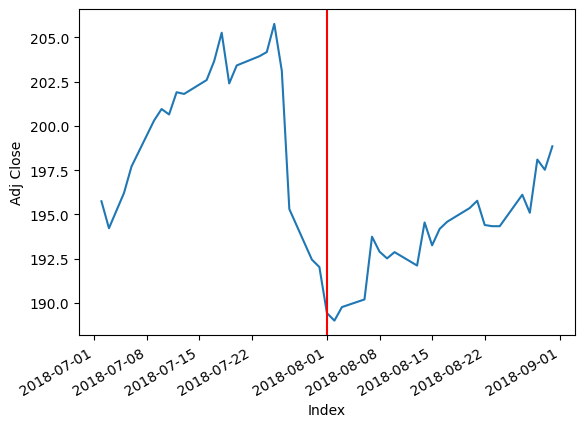

---------------------------------------------------------------------------
For CRM The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


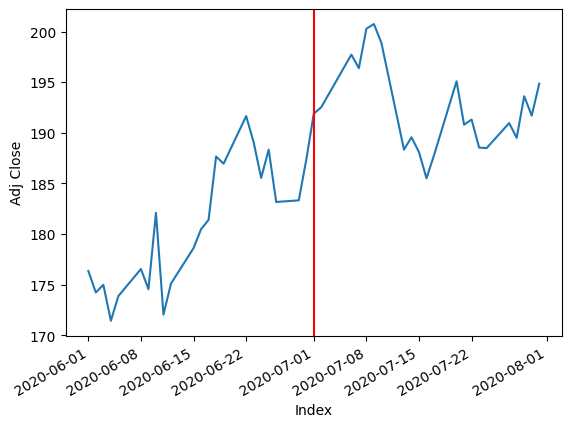

---------------------------------------------------------------------------
For SBAC The index when the drop is the largest 2019-08-01 00:00:00
2019-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


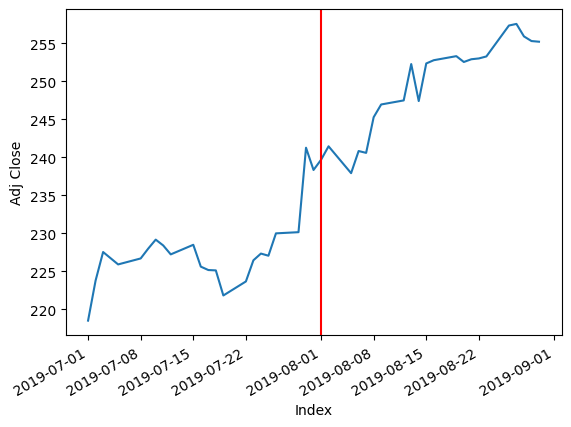

---------------------------------------------------------------------------
For SLB The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


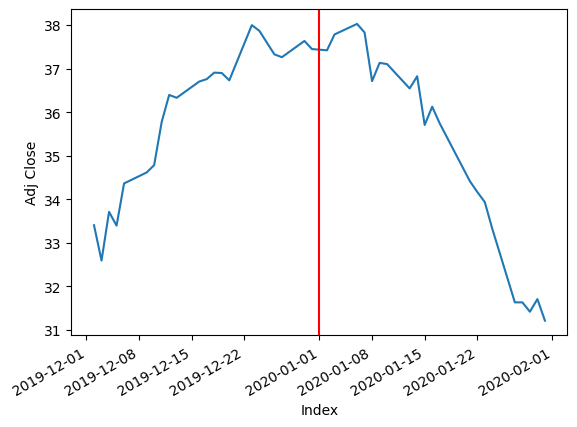

---------------------------------------------------------------------------
For STX The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


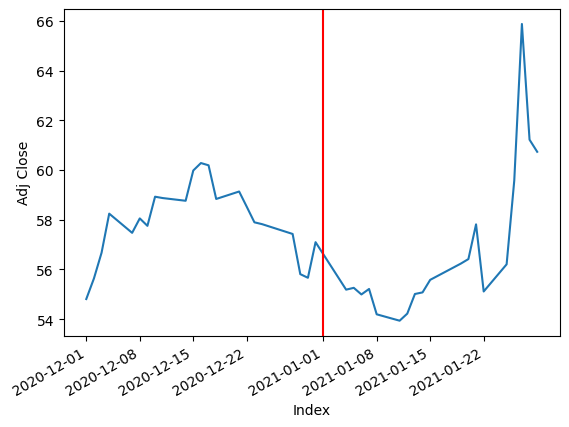

---------------------------------------------------------------------------
For SEE The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


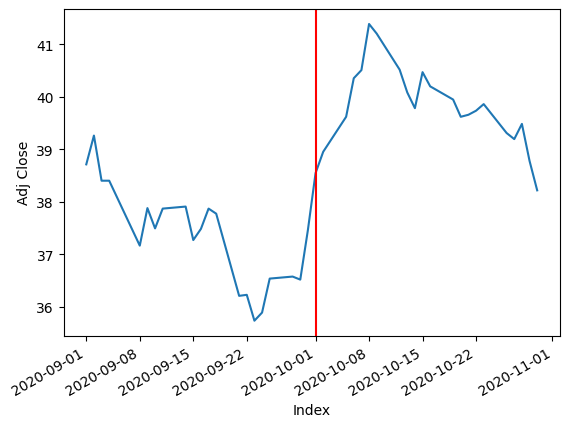

---------------------------------------------------------------------------
For SRE The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


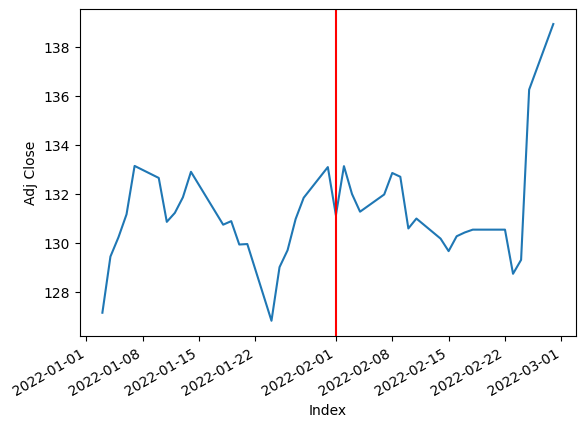

---------------------------------------------------------------------------
For NOW The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


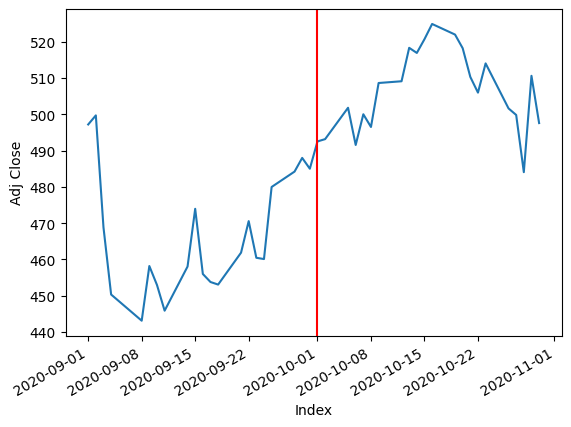

---------------------------------------------------------------------------
For SHW The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


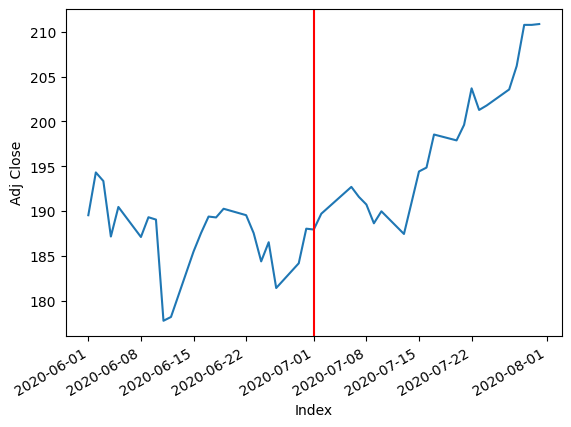

---------------------------------------------------------------------------
For SPG The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


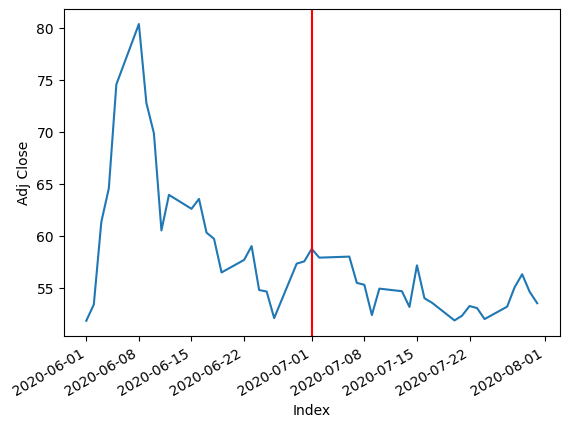

---------------------------------------------------------------------------
For SWKS The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


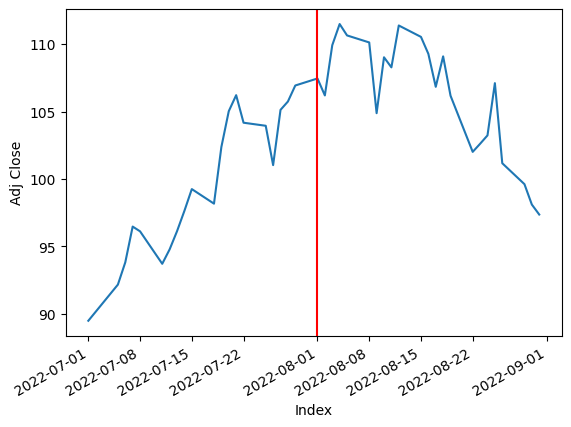

---------------------------------------------------------------------------
For SJM The index when the drop is the largest 2016-06-01 00:00:00
2016-06-01 00:00:00
[*********************100%***********************]  1 of 1 completed


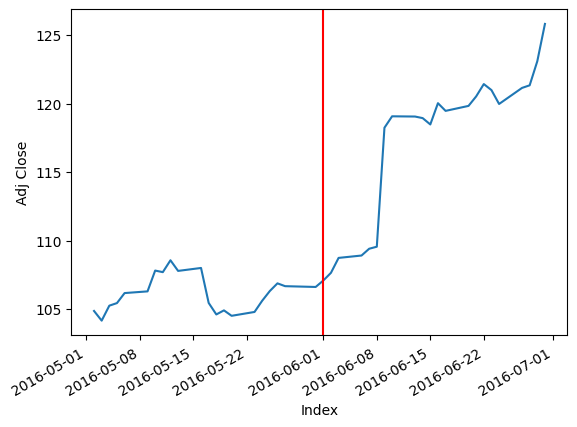

---------------------------------------------------------------------------
For SNA The index when the drop is the largest 2021-05-01 00:00:00
2021-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


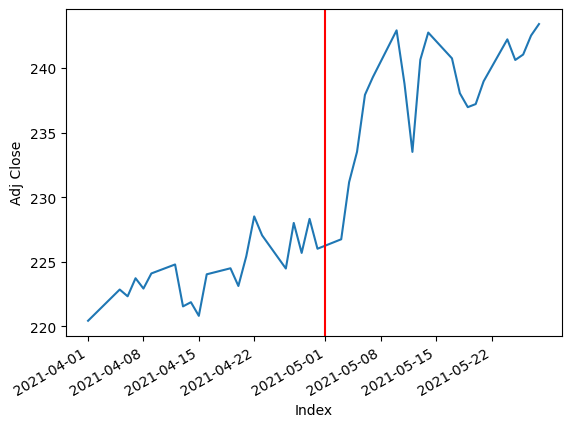

---------------------------------------------------------------------------
For SO The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


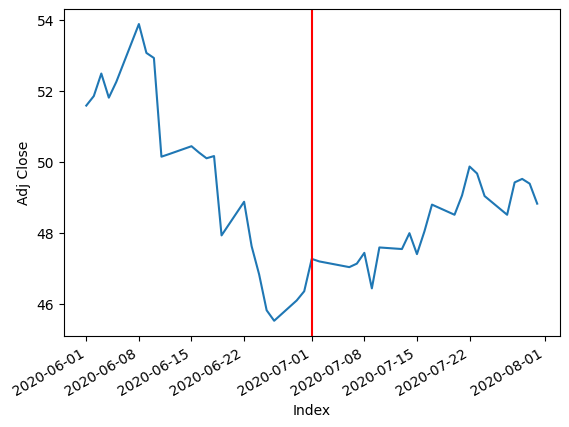

---------------------------------------------------------------------------
For LUV The index when the drop is the largest 2021-02-01 00:00:00
2021-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


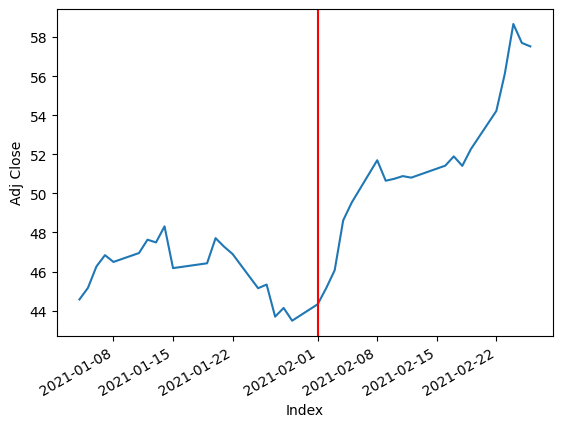

---------------------------------------------------------------------------
For SWK The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


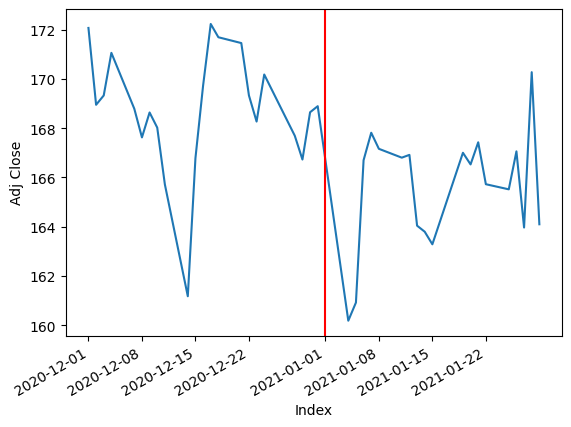

---------------------------------------------------------------------------
For SBUX The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


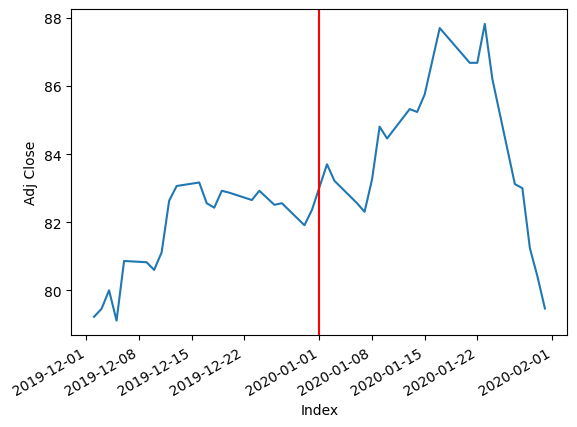

---------------------------------------------------------------------------
For STT The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


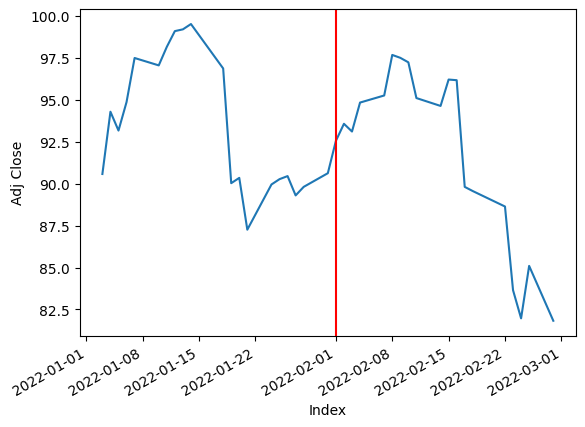

---------------------------------------------------------------------------
For STLD The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


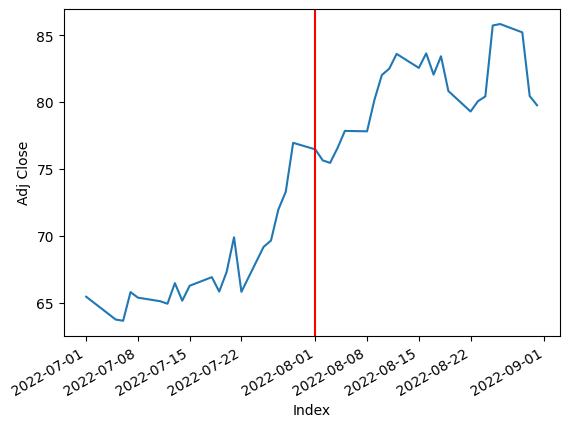

---------------------------------------------------------------------------
For SYK The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


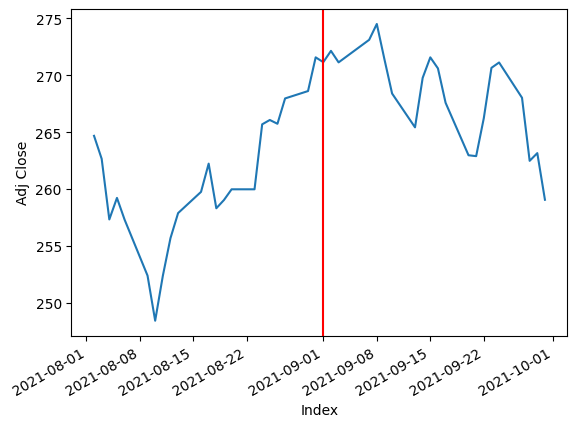

---------------------------------------------------------------------------
For SYF The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


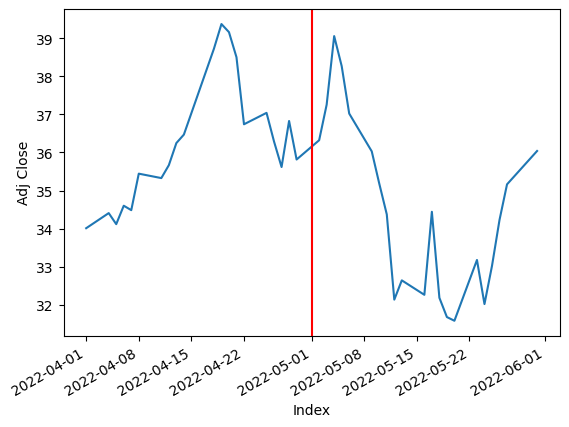

---------------------------------------------------------------------------
For SNPS The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


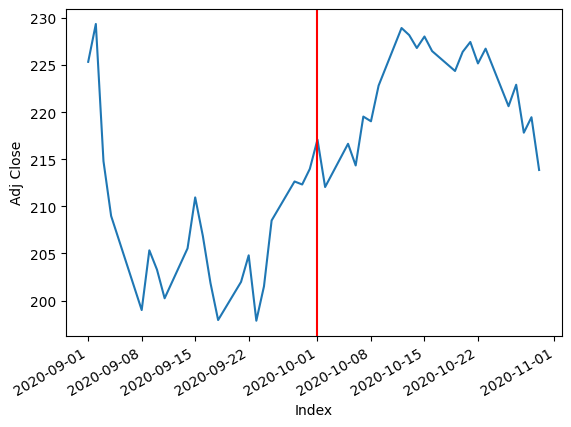

---------------------------------------------------------------------------
For SYY The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


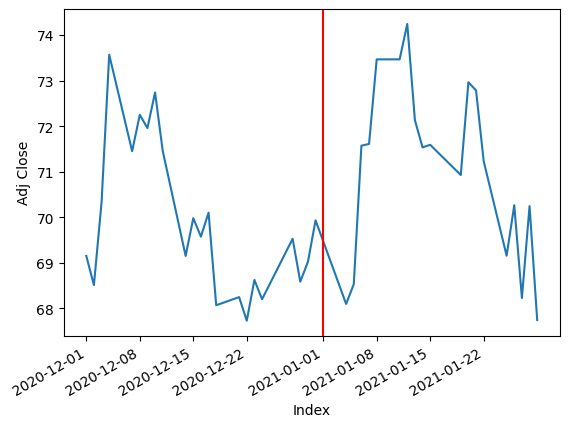

---------------------------------------------------------------------------
For TMUS The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


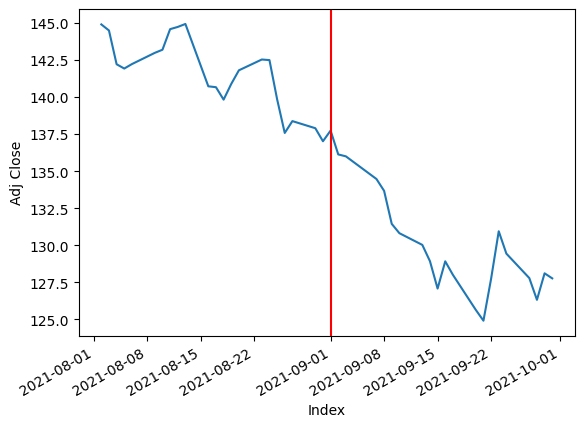

---------------------------------------------------------------------------
For TROW The index when the drop is the largest 2021-02-01 00:00:00
2021-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


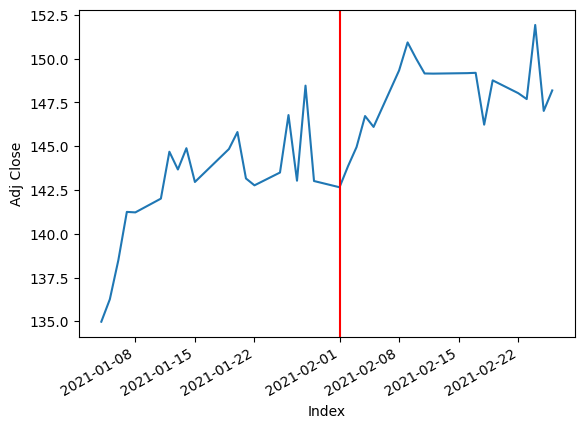

---------------------------------------------------------------------------
For TPR The index when the drop is the largest 2021-02-01 00:00:00
2021-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


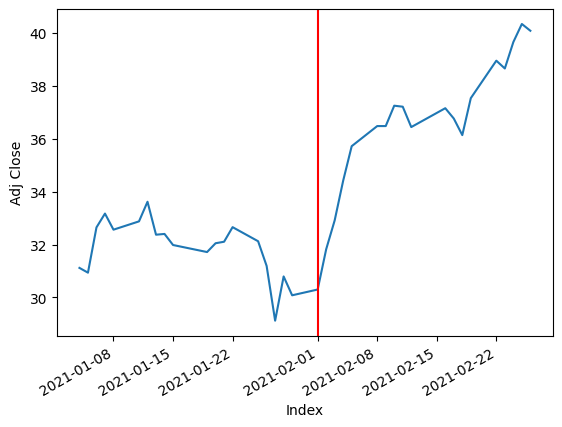

---------------------------------------------------------------------------
For TRGP The index when the drop is the largest 2019-09-01 00:00:00
2019-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


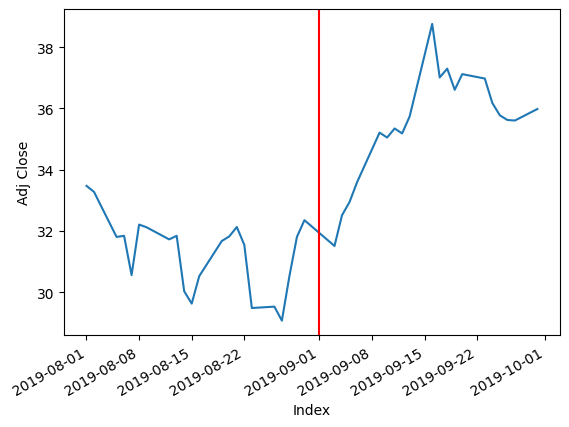

---------------------------------------------------------------------------
For TGT The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


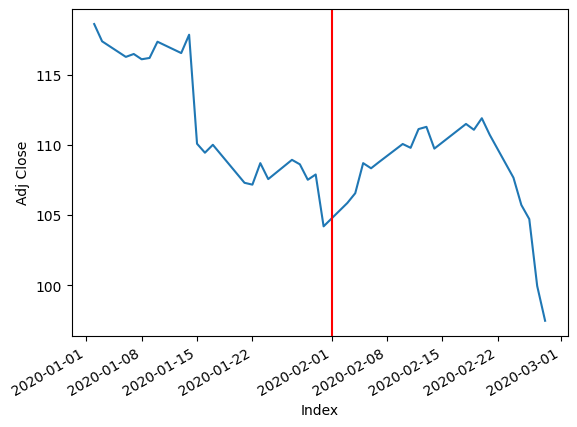

---------------------------------------------------------------------------
For TEL The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


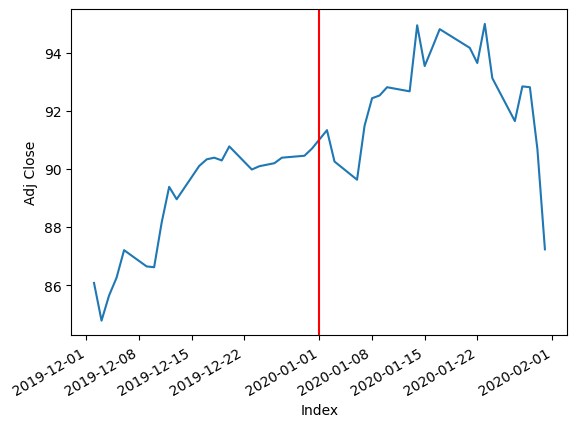

---------------------------------------------------------------------------
For TFX The index when the drop is the largest 2019-06-01 00:00:00
2019-06-01 00:00:00
[*********************100%***********************]  1 of 1 completed


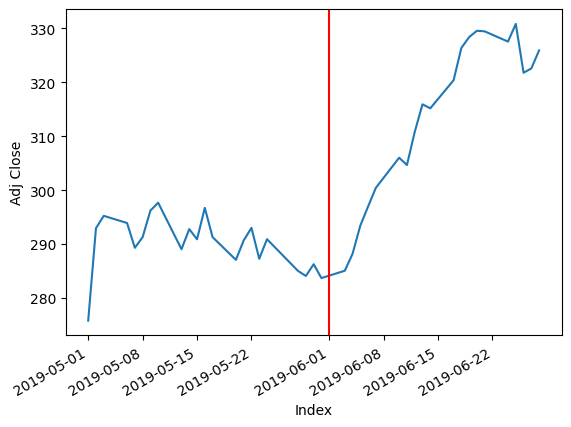

---------------------------------------------------------------------------
For TER The index when the drop is the largest 2019-07-01 00:00:00
2019-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


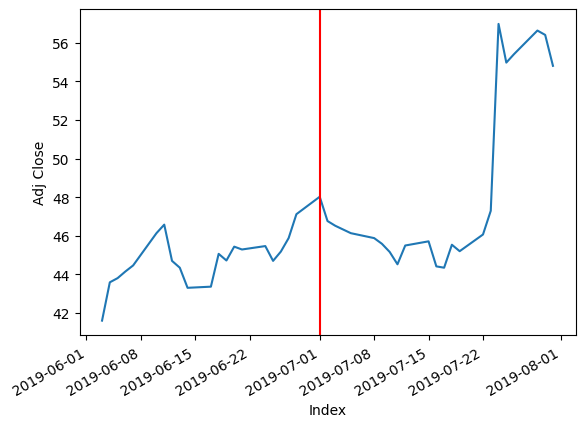

---------------------------------------------------------------------------
For TSLA The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


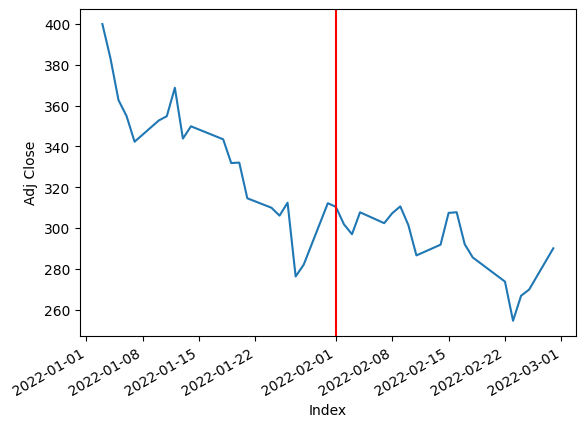

---------------------------------------------------------------------------
For TXN The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


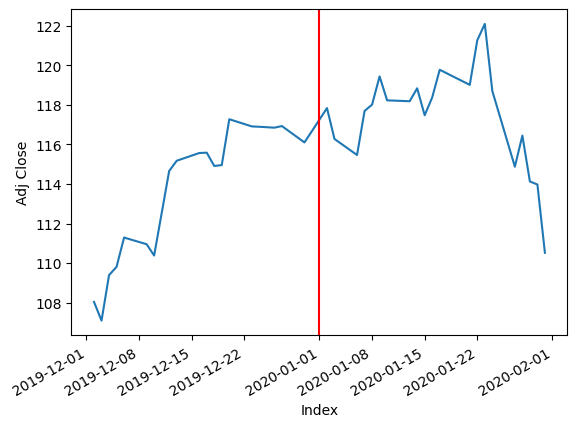

---------------------------------------------------------------------------
For TXT The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


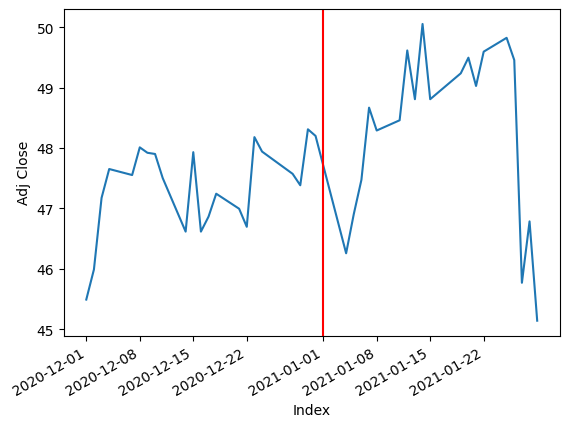

---------------------------------------------------------------------------
For TMO The index when the drop is the largest 2021-02-01 00:00:00
2021-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


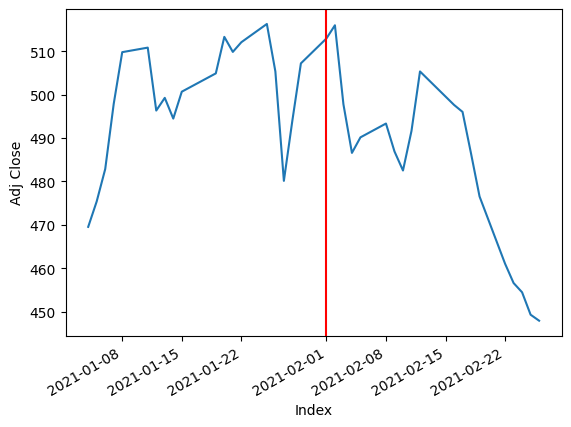

---------------------------------------------------------------------------
For TJX The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


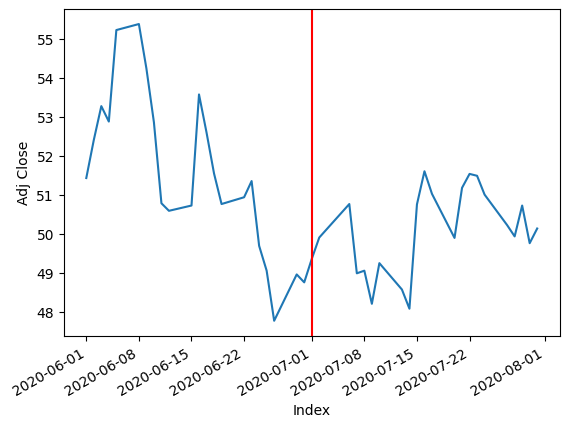

---------------------------------------------------------------------------
For TSCO The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


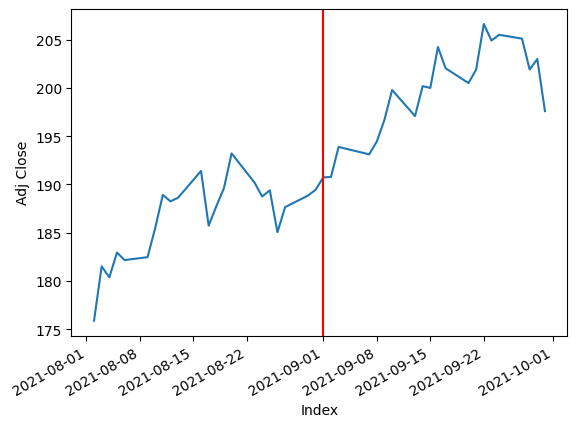

---------------------------------------------------------------------------
For TT The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


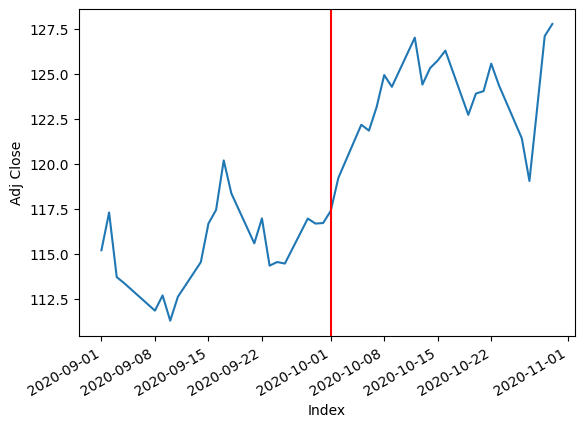

---------------------------------------------------------------------------
For TDG The index when the drop is the largest 2015-10-01 00:00:00
2015-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


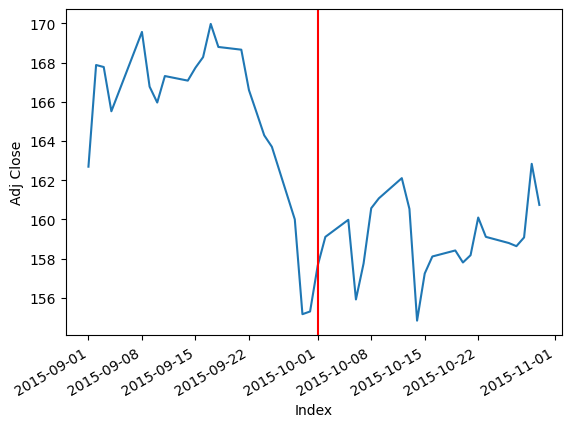

---------------------------------------------------------------------------
For TRV The index when the drop is the largest 2017-08-01 00:00:00
2017-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


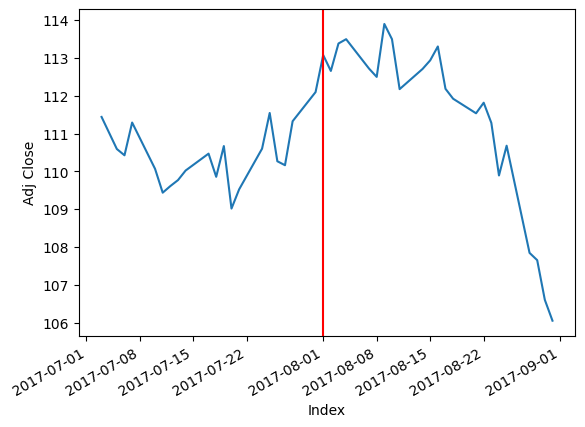

---------------------------------------------------------------------------
For TRMB The index when the drop is the largest 2018-11-01 00:00:00
2018-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


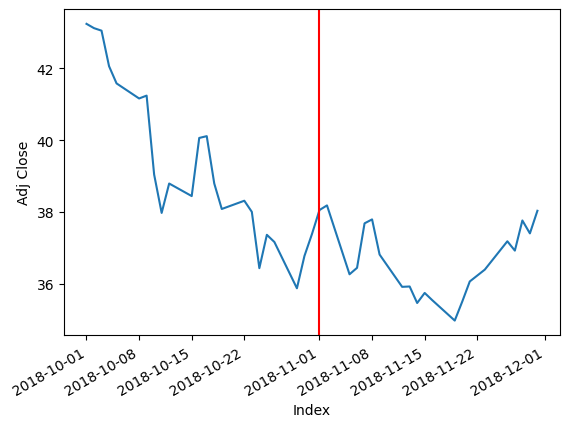

---------------------------------------------------------------------------
For TSN The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


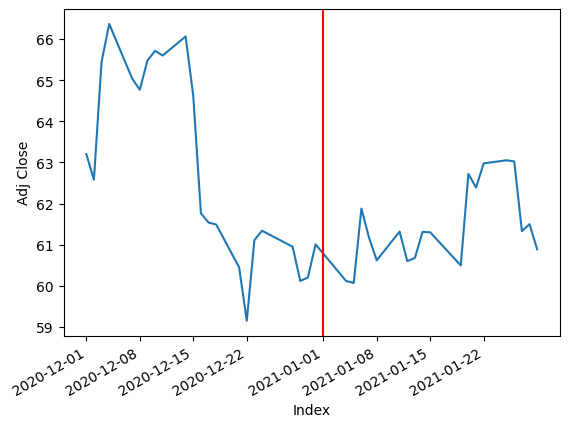

---------------------------------------------------------------------------
For USB The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


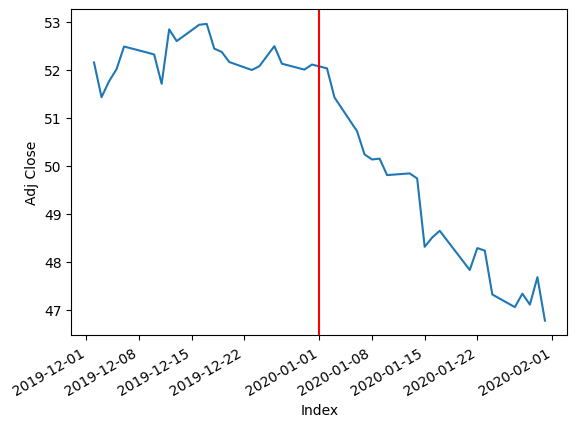

---------------------------------------------------------------------------
For UDR The index when the drop is the largest 2014-11-01 00:00:00
2014-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


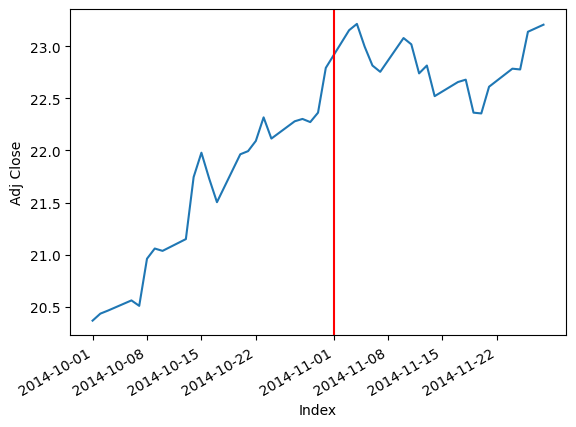

---------------------------------------------------------------------------
For ULTA The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


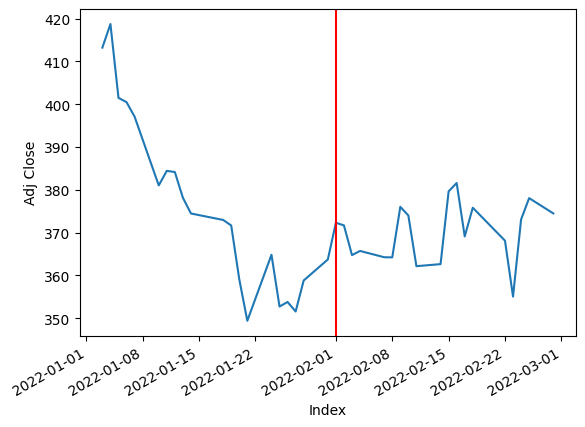

---------------------------------------------------------------------------
For UNP The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


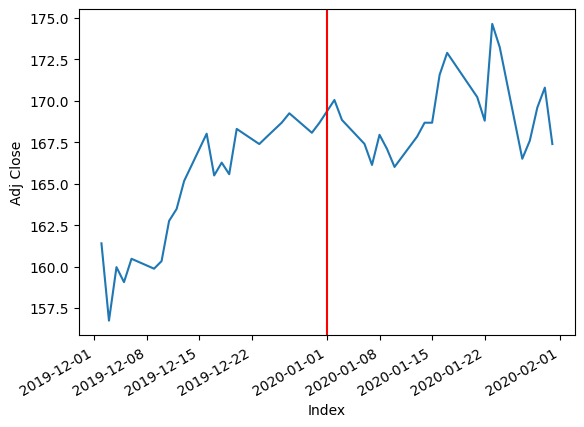

---------------------------------------------------------------------------
For UAL The index when the drop is the largest 2018-11-01 00:00:00
2018-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


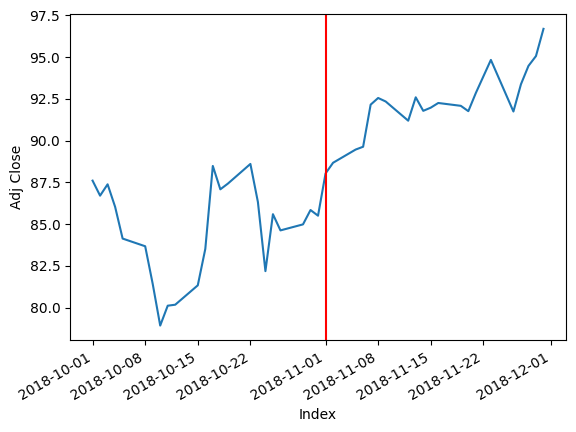

---------------------------------------------------------------------------
For UPS The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


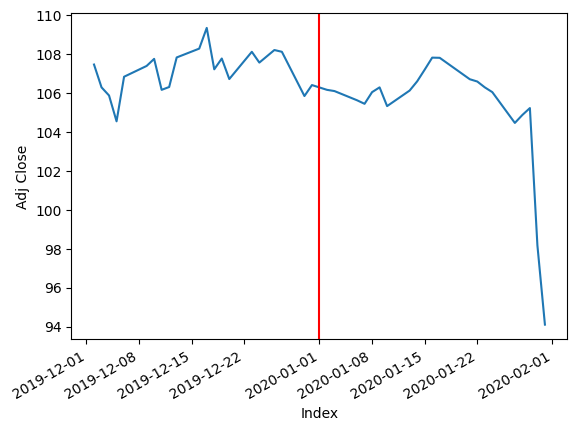

---------------------------------------------------------------------------
For URI The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


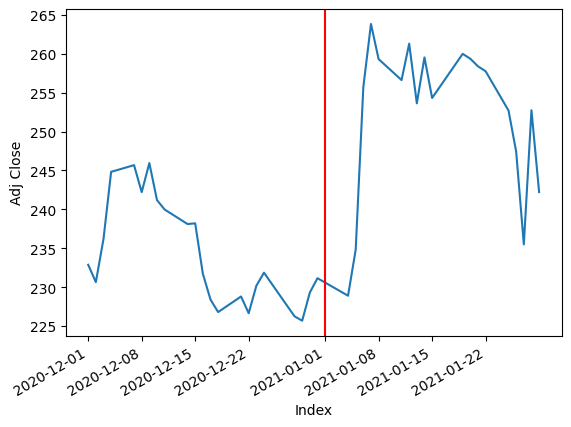

---------------------------------------------------------------------------
For UNH The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


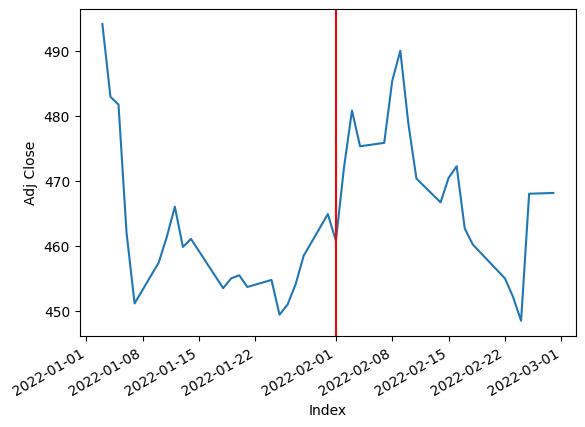

---------------------------------------------------------------------------
For UHS The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


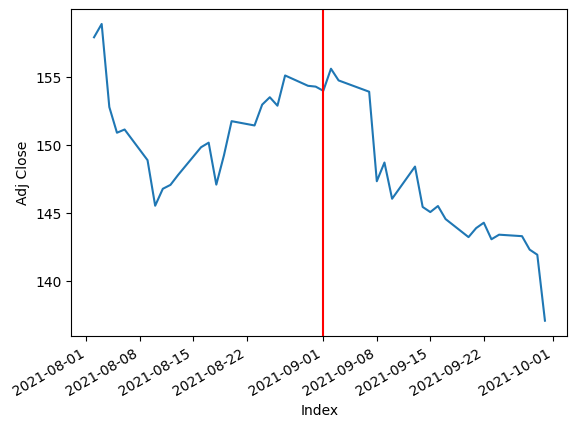

---------------------------------------------------------------------------
For VLO The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


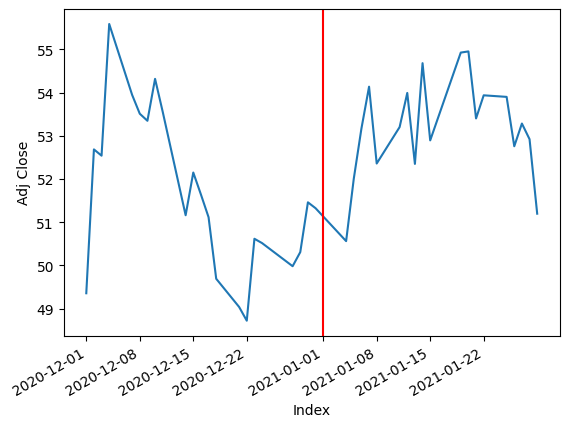

---------------------------------------------------------------------------
For VTR The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


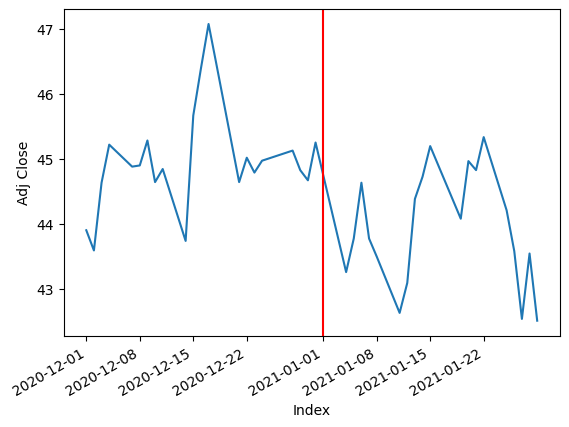

---------------------------------------------------------------------------
For VRSN The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


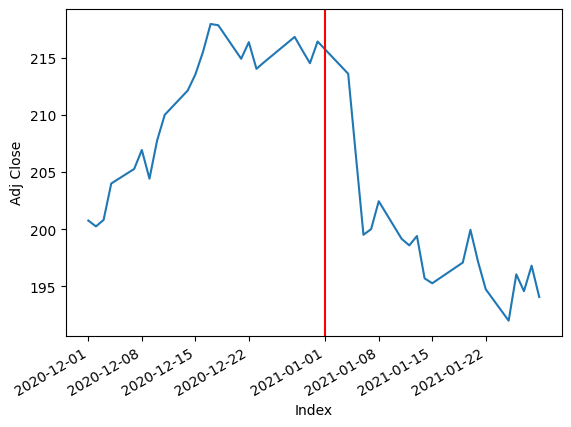

---------------------------------------------------------------------------
For VRSK The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


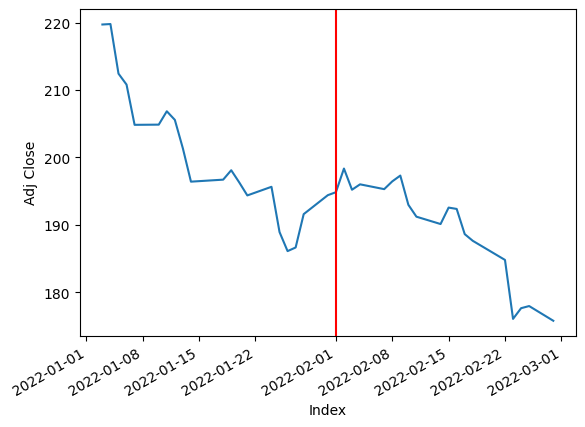

---------------------------------------------------------------------------
For VZ The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


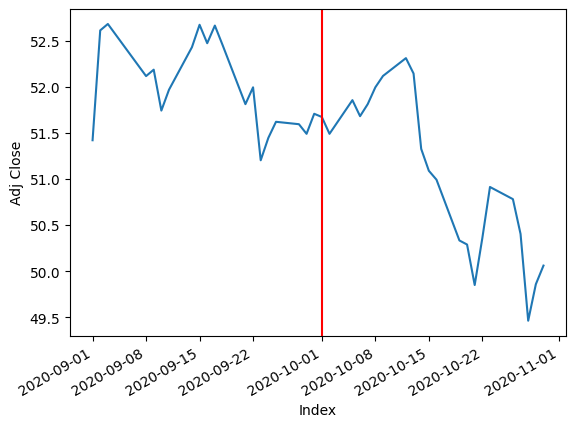

---------------------------------------------------------------------------
For VRTX The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


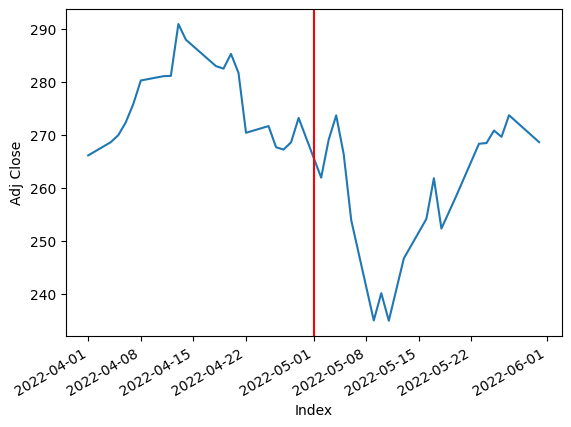

---------------------------------------------------------------------------
For VFC The index when the drop is the largest 2018-03-01 00:00:00
2018-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


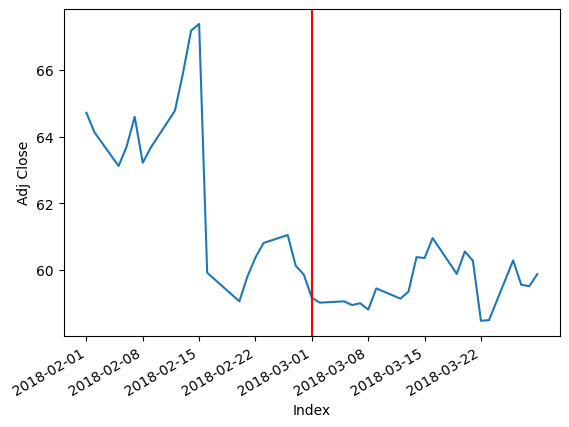

---------------------------------------------------------------------------
For V The index when the drop is the largest 2020-03-01 00:00:00
2020-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


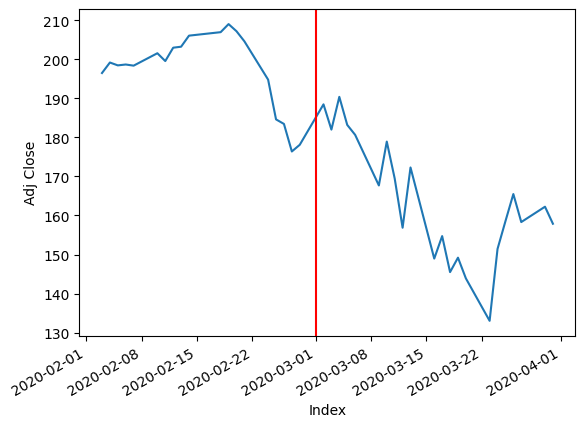

---------------------------------------------------------------------------
For VMC The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


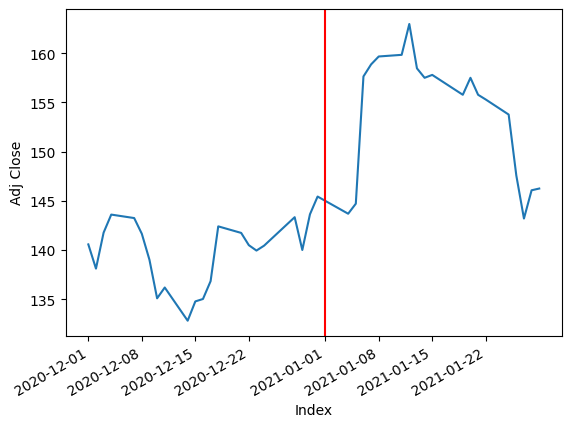

---------------------------------------------------------------------------
For WAB The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


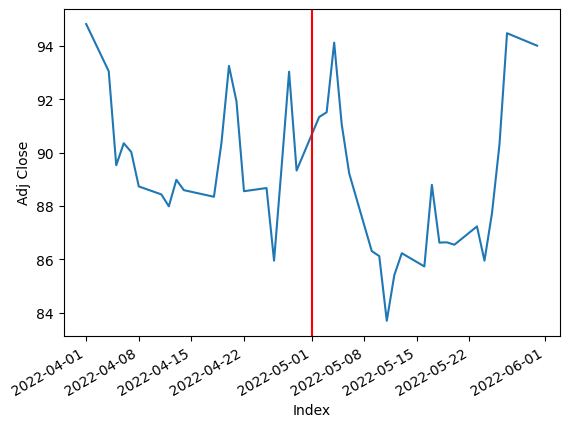

---------------------------------------------------------------------------
For WBA The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


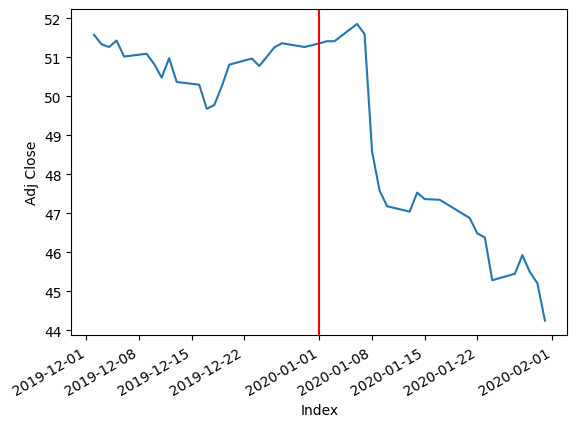

---------------------------------------------------------------------------
For WMT The index when the drop is the largest 2022-08-01 00:00:00
2022-08-01 00:00:00
[*********************100%***********************]  1 of 1 completed


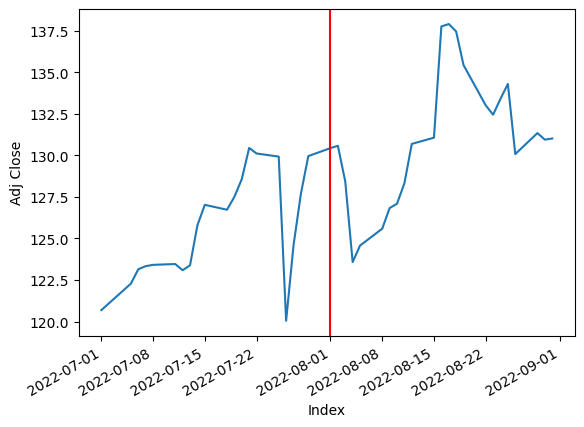

---------------------------------------------------------------------------
For WM The index when the drop is the largest 2019-03-01 00:00:00
2019-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


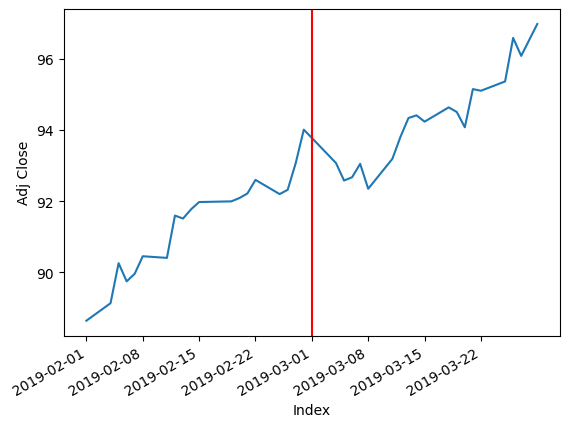

---------------------------------------------------------------------------
For WAT The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


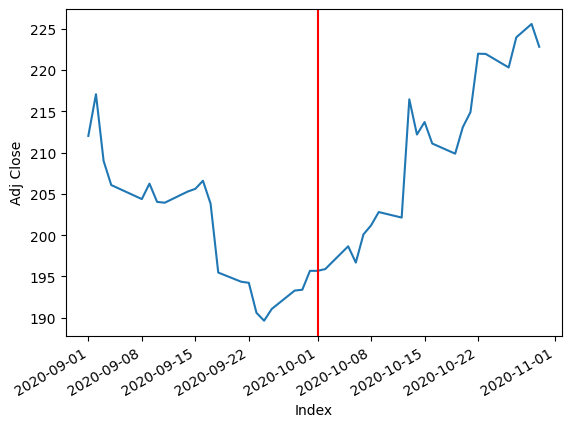

---------------------------------------------------------------------------
For WEC The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


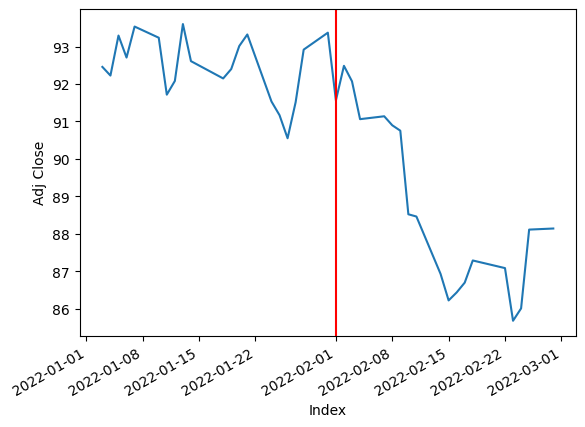

---------------------------------------------------------------------------
For WFC The index when the drop is the largest 2020-01-01 00:00:00
2020-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


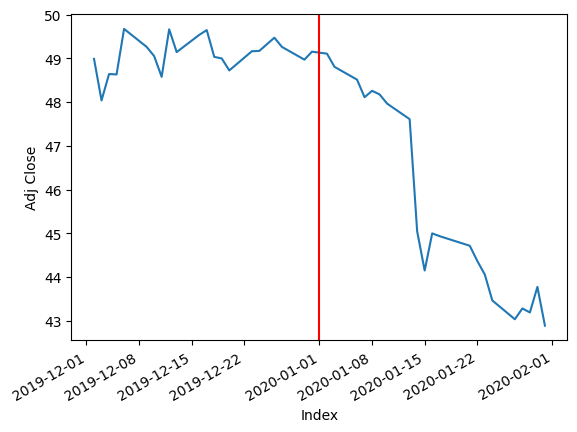

---------------------------------------------------------------------------
For WELL The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


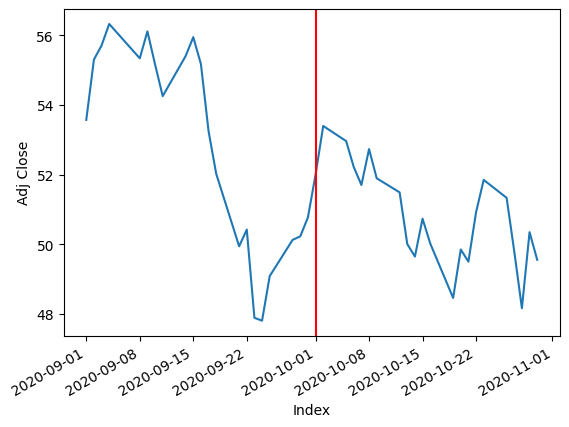

---------------------------------------------------------------------------
For WDC The index when the drop is the largest 2020-07-01 00:00:00
2020-07-01 00:00:00
[*********************100%***********************]  1 of 1 completed


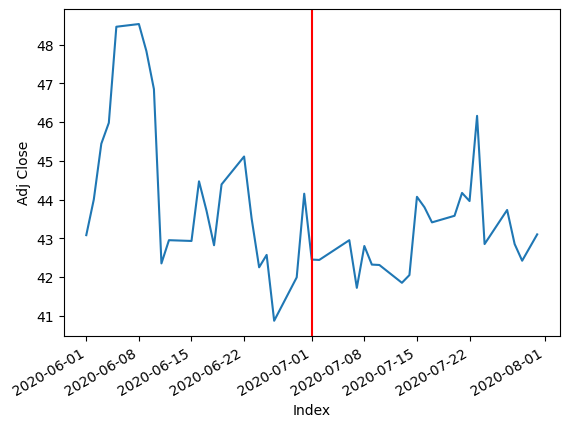

---------------------------------------------------------------------------
For WRK The index when the drop is the largest 2016-10-01 00:00:00
2016-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


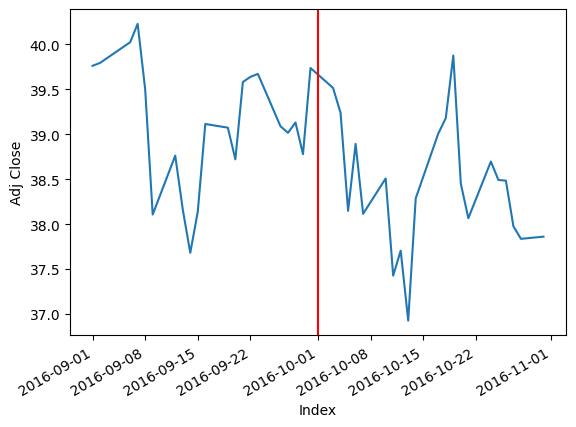

---------------------------------------------------------------------------
For WY The index when the drop is the largest 2021-03-01 00:00:00
2021-03-01 00:00:00
[*********************100%***********************]  1 of 1 completed


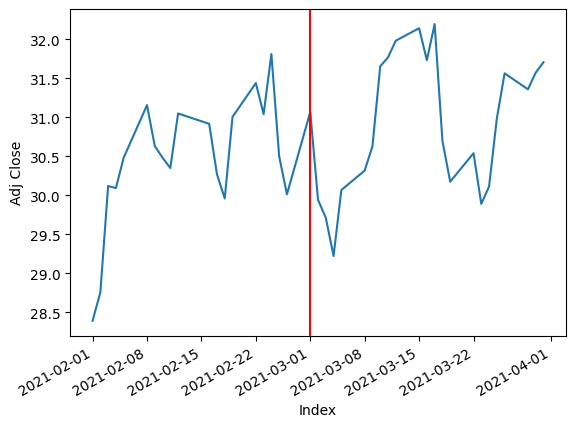

---------------------------------------------------------------------------
For WHR The index when the drop is the largest 2021-01-01 00:00:00
2021-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


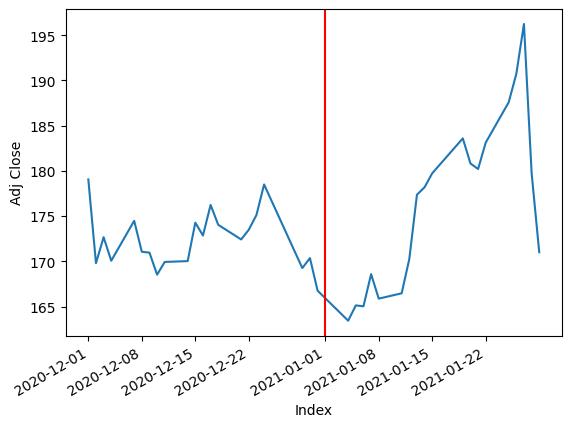

---------------------------------------------------------------------------
For WMB The index when the drop is the largest 2018-10-01 00:00:00
2018-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


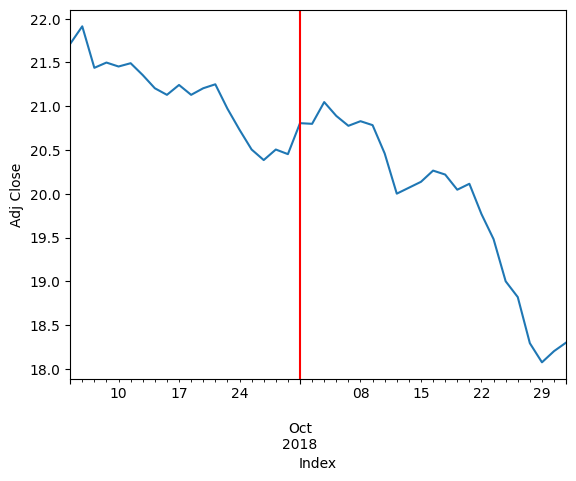

---------------------------------------------------------------------------
For WTW The index when the drop is the largest 2022-05-01 00:00:00
2022-05-01 00:00:00
[*********************100%***********************]  1 of 1 completed


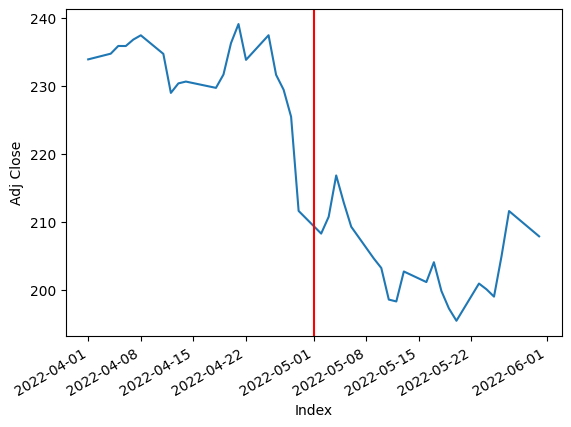

---------------------------------------------------------------------------
For GWW The index when the drop is the largest 2015-12-01 00:00:00
2015-12-01 00:00:00
[*********************100%***********************]  1 of 1 completed


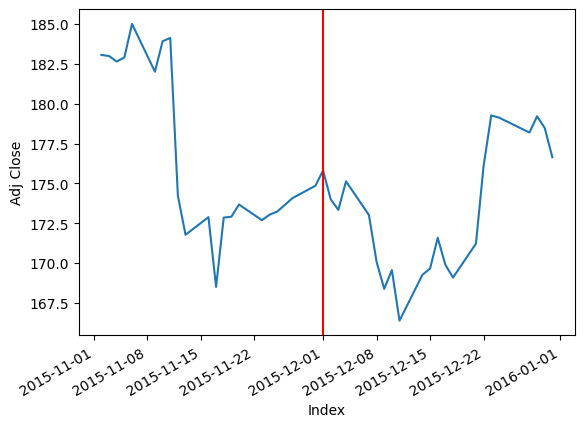

---------------------------------------------------------------------------
For WYNN The index when the drop is the largest 2020-02-01 00:00:00
2020-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


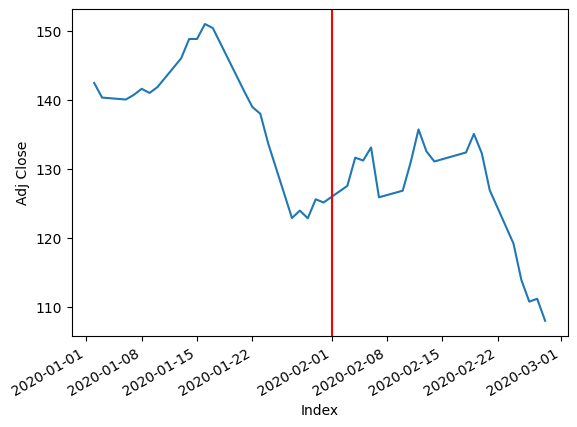

---------------------------------------------------------------------------
For XEL The index when the drop is the largest 2022-02-01 00:00:00
2022-02-01 00:00:00
[*********************100%***********************]  1 of 1 completed


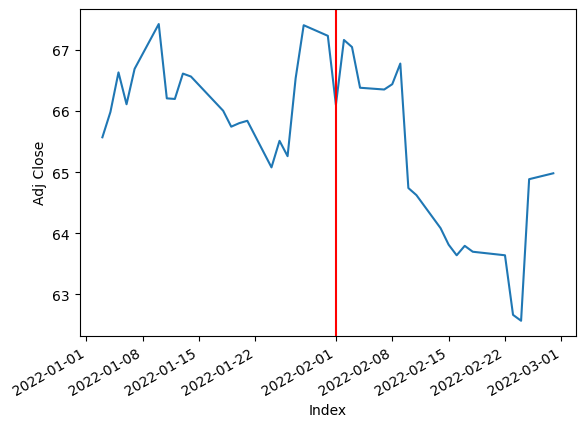

---------------------------------------------------------------------------
For XYL The index when the drop is the largest 2020-10-01 00:00:00
2020-10-01 00:00:00
[*********************100%***********************]  1 of 1 completed


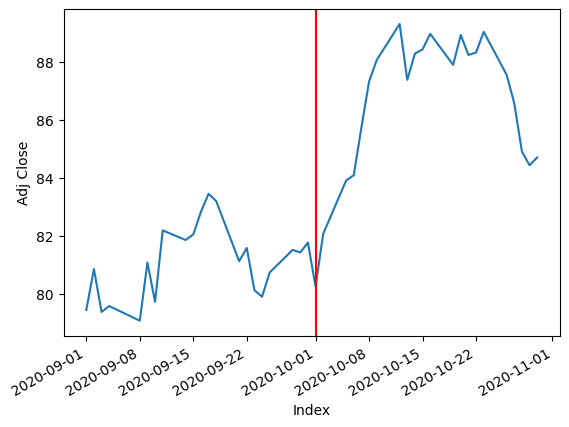

---------------------------------------------------------------------------
For YUM The index when the drop is the largest 2018-11-01 00:00:00
2018-11-01 00:00:00
[*********************100%***********************]  1 of 1 completed


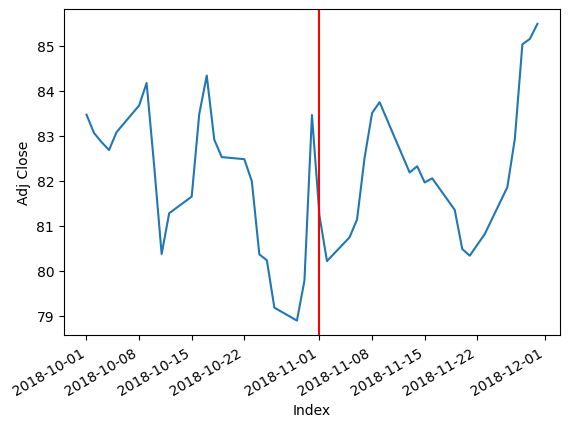

---------------------------------------------------------------------------
For ZBH The index when the drop is the largest 2021-09-01 00:00:00
2021-09-01 00:00:00
[*********************100%***********************]  1 of 1 completed


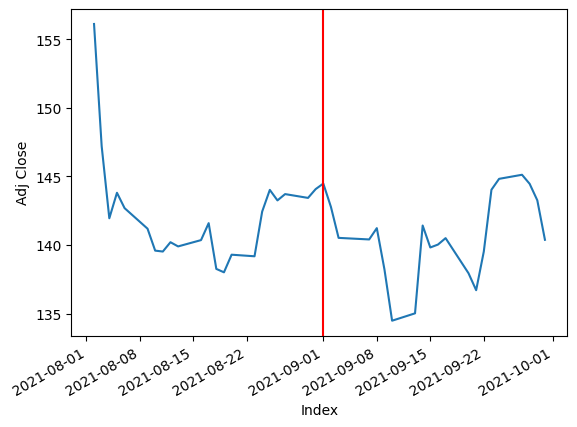

---------------------------------------------------------------------------
For ZION The index when the drop is the largest 2016-04-01 00:00:00
2016-04-01 00:00:00
[*********************100%***********************]  1 of 1 completed


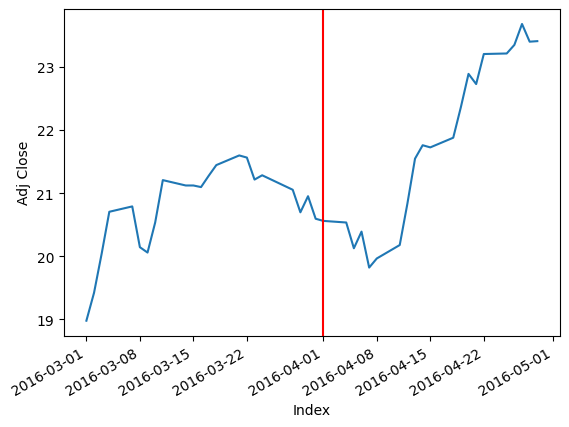

---------------------------------------------------------------------------
For ZTS The index when the drop is the largest 2015-01-01 00:00:00
2015-01-01 00:00:00
[*********************100%***********************]  1 of 1 completed


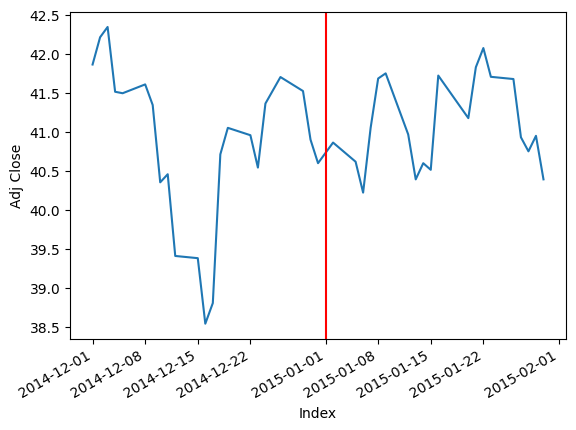

In [ ]:
for i in range(154, len(company_esg_normalized)):
  try:
    eda(company_esg_normalized[i],i)
  except Exception:
    pass




In [ ]:


'''
def minmax(date) :
  global i
  start_date = date - relativedelta(months=1)
  start_date = start_date.date()
  end_date = date + relativedelta(months=1)
  end_date = end_date.date()
  data = yf.download(used_ticker[i], start = start_date, end=end_date)['Adj Close']
  data = data['Adj Close']
  max_price = data.max()
  min_price = data.min()
  if max_price.index() < min_price.index():         #하락
    change = ((min_price-max_price)/max_price) * 100
  elif max_price.index() > min_price.index():        #상승
    change = ((max_price - min_price)/min_price) * 100

  
for i in range(4):
  df = company_esg_normalized[i]
  df['price_change'] = df.iloc[1:].apply(minmax, axis=0)
  print(df)
 

def minmax(df):
  dates_list = df.index.tolist()
  change_list = []
  for date in dates_list:
    start_date = date - relativedelta(months=1)
    start_date = start_date.date()
    end_date = date + relativedelta(months=1)
    end_date = end_date.date()
    data = yf.download(used_ticker[i], start = start_date, end=end_date)
    max_price = data['Adj Close'].max()
    print(type(max_price))

    min_price = data['Adj Close'].min()
    if max_price.index < min_price.index:         #하락
      change = ((min_price-max_price)/max_price) * 100
    elif max_price.index > min_price.index:        #상승
      change = ((max_price - min_price)/min_price) * 100
    change_list.append(change)
  print(change_list)
 



minmax(company_esg_normalized[3])





price_drop_list = []
esg_change_list = []
stock_list = []




def minmax(df,ticker) :
  global price_drop_list
  global esg_change_list
  global stock
  date= df['change'].dropna().idxmin()
  start_date = date - relativedelta(months=1)
  start_date = start_date.date()
  end_date = date + relativedelta(months=1)
  end_date = end_date.date()
  data = yf.download(used_ticker[ticker], start = start_date, end=end_date)
  max_date = data['Adj Close'].idxmax()
  min_date = data['Adj Close'].idxmin()
  max_price = data['Adj Close'].max()
  #print(used_ticker[ticker],":", max_price)
  min_price = data['Adj Close'].min()
  #print(used_ticker[ticker], ":", min_price)

  if max_date < min_date:
    price_drop = ((max_price - min_price) / max_price) * 100
    print(used_ticker[ticker], ":", price_drop)
    price_drop_list.append(price_drop)
    esg_change = df.iloc[df.index.get_loc(date), 1]  # Convert date index to integer index
    esg_change_list.append(esg_change)
    stock_list.append(used_ticker[ticker])
   
  else: 
    pass


'''
stock_list =[]
corr_list = []
def get_pricechange(ticker):
  price_change_list = []
  df = company_esg_normalized[ticker]
  for date in df.index: 
    start_date = date - relativedelta(months=1)
    start_date = start_date.date()
    end_date = date + relativedelta(months=1)
    end_date = end_date.date()
    data = yf. download(used_ticker[ticker], start = start_date, end=end_date)['Adj Close']
    max_price = data.max()
    max_date= data.idxmax()
    min_price = data.min()
    min_date = data.idxmin()
    if max_date < min_date:         #하락
      change = ((min_price-max_price)/max_price) * 100
    elif max_date> min_date:        #상승
      change = ((max_price - min_price)/min_price) * 100
    price_change_list.append(change)
  df['price_change_percentage'] = price_change_list
  corr = df['price_change_percentage'].corr(df['change'])
  corr_list.append(corr)
  stock_list.append(used_ticker[ticker])

  


for i in range(10):
  get_pricechange(i)

'''

def get_change(date):
  start_date = date - relativedelta(months=1)
  start_date = start_date.date()
  end_date = date + relativedelta(months=1)
  end_date = end_date.date()
  data = yf.download(used_ticker[ticker], start = start_date, end=end_date)
  max_price = data['Adj Close'].max()
  min_price = data['Adj Close'].min()
  if max_price.index < min_price.index:         #하락
    change = ((min_price-max_price)/max_price) * 100
  elif max_price.index > min_price.index:        #상승
    change = ((max_price - min_price)/min_price) * 100
  


def get_change2(i):
  i['Price Change'] = i.iloc[1:].apply(get_change, axis=0)
  print(i)


for i in range(3):
  get_change2(company_esg_normalized[i])

'''
 


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

KeyboardInterrupt: ignored

In [ ]:
#grand = pd.DataFrame({'stock': stock_list, 'correlation': corr_list})
#display(grand)


In [ ]:
for i in range(11, 21):
    get_pricechange(i)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [ ]:
#grand2 = pd.DataFrame({'stock': stock_list, 'correlation': corr_list})
#display(grand2)



get_pricechange(3)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,Total-Score-Normalized,change,price_change_percentage
Date,,,
2014-09-01,8.185539,NaN,14.543717
2014-10-01,13.642565,5.457026,19.962177
2014-11-01,2.728513,-10.914052,30.812850
2014-12-01,2.728513,0.000000,13.349598
2015-01-01,2.728513,0.000000,-12.777128
2015-02-01,2.728513,0.000000,-17.349526
2015-03-01,0.000000,-2.728513,-10.008091
2015-04-01,0.000000,0.000000,20.708424
2015-05-01,8.185539,8.185539,19.329204


In [ ]:
for i in range(21, 31):
    get_pricechange(i)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,stock,correlation
0,MMM,0.157817
1,AOS,-0.103615
2,ABT,0.028358
3,ABBV,0.067623
4,ACN,0.053983
5,ATVI,0.283728
6,ADM,0.049798
7,ADBE,0.063588
8,ADP,0.118531
9,AAP,-0.022430


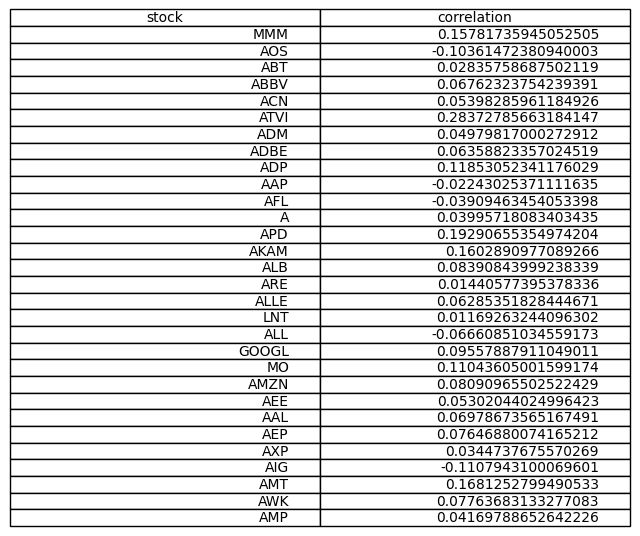

In [ ]:
import matplotlib.pyplot as plt
grand3 = pd.DataFrame({'stock': stock_list, 'correlation': corr_list})
display(grand3)

fig, ax = plt.subplots(figsize=(8, 3))
ax.axis('off')
ax.axis('tight')
ax.table(cellText=grand3.values, colLabels=grand3.columns, loc='center')

plt.savefig('dataframe.png', dpi=300, bbox_inches='tight')

In [ ]:
for i in range(31, 41):
    get_pricechange(i)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [ ]:
for i in range(41, 51):
    get_pricechange(i)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,stock,correlation
0,MMM,0.157817
1,AOS,-0.103615
2,ABT,0.028358
3,ABBV,0.067623
4,ACN,0.053983
5,ATVI,0.283728
6,ADM,0.049798
7,ADBE,0.063588
8,ADP,0.118531
9,AAP,-0.022430


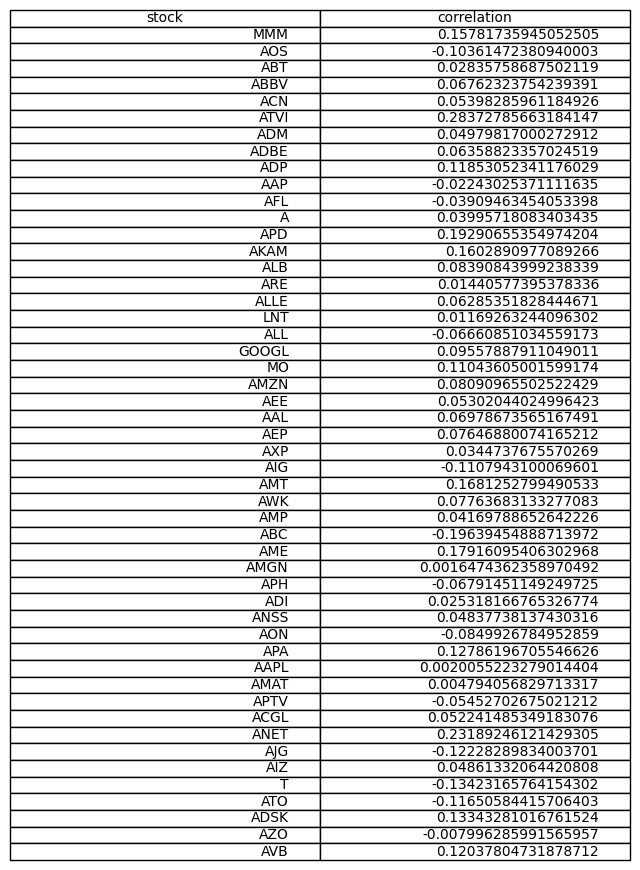

In [ ]:
grand4 = pd.DataFrame({'stock': stock_list, 'correlation': corr_list})
display(grand4)

fig, ax = plt.subplots(figsize=(8, 3))
ax.axis('off')
ax.table(cellText=grand4.values, colLabels=grand4.columns, loc='center')

plt.savefig('dataframe.png', dpi=300, bbox_inches='tight')

In [ ]:


'''
print(price_drop_list)
print(esg_change_list)
print(stock_list)

print(len(price_drop_list))
print(len(esg_change_list))
print(len(stock_list))
'''

[11.572970180784155, 8.468943881824412, 25.25251347114928, 9.455146509733307, 17.05272262968212, 11.572978571864907, 8.468920547496603, 25.252521396802614, 9.455146509733307, 17.05272262968212, 14.272569085089865, 19.47853461903396, 10.046809229398722, 13.109239629833306, 26.016260569426418, 11.121259618959925, 17.934192778785274, 9.182964350809831, 16.325869966396915, 7.70208323837962, 8.369291565602557, 6.9570045384831305, 12.972527401211268, 10.723471145955482, 24.971549643903707, 17.152901562798935, 16.628574916294642, 24.053402864519136, 8.89295773782018, 14.575329694318981, 8.12371695286161, 7.793091067157662, 15.449108093770864, 8.412463207159632, 6.851181956284585, 20.41998415964073, 18.49982186466738, 11.79349203264399, 15.035459465206467, 18.532980530292413, 12.283763741026787, 15.874564688118515, 13.988289958524536, 17.429316480769046, 9.538449010954913, 5.416507339086052, 9.498150064467755, 6.272452409943504, 16.127172809381698, 14.355323435989535, 10.449670926848004, 46.64

In [ ]:
'''
price_drop_df = pd.DataFrame(price_drop_list)
esg_change_df = pd.DataFrame(esg_change_list)
stock_df = pd.DataFrame(stock_list)

grand = pd.concat([price_drop_df,esg_change_df,stock_df],axis=1)
grand = grand.set_index(grand.iloc[:,2])
grand = grand.iloc[:, :2]

grand.columns = ['Price Drop','ESG change']

display(grand)
'''

,Price Drop,ESG change
0,,
AOS,11.572970,-88.755981
ABT,8.468944,-64.012739
ATVI,25.252513,-62.018349
ADBE,9.455147,-83.274021
ADP,17.052723,-87.966805
AOS,11.572979,-88.755981
ABT,8.468921,-64.012739
ATVI,25.252521,-62.018349
ADBE,9.455147,-83.274021
